In [1]:
import copy
import socket
import os
import pickle 
# import ssm #need to/ keep 
import sys
import glob
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap


sys.path.append("/Users/friederikebuck/Desktop/MBL/project/WholeBrainImagingAnalysis/collab/")
sys.path.append('/Users/bennetsakelaris/Documents/Obsidian Vault/Worms/wormcode/Code+Notes 09-24-24/collab/')

from scipy.ndimage import gaussian_filter1d
from get_data.read_neuro_beh_data import get_exp_features, load_json
from get_data.process_neural_data import get_derivative_of_neural_activity, get_neural_activity_from_labels, get_neural_activity_and_labels
from beh_classification.behavior_features import get_behavior_features
from beh_classification.get_behavior_classifications import get_behavior_classification
# from beh_classification.beh_classification_utils import get_start_end_is_of_ones_in_binary_array
from sklearn.decomposition import PCA

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.metrics import balanced_accuracy_score

from sklearn import svm
from sklearn.svm import LinearSVC
from sklearn.neighbors import NearestNeighbors

from load_data_fncs import load_all_data, get_exp_dates
from analyse_rslds_utils import make_behavior_decoder, input_slds

In [2]:

from matplotlib.colors import LinearSegmentedColormap

#color palette for plotting, colors as in make_behavior_ethogram
palette = ["coral",     # forward
           "lightblue", # reverse
           "darkgreen", # turn
           "purple","red", "yellow", "black", "pink"]    # pause
cmap = LinearSegmentedColormap.from_list("behavior", palette, N=len(palette))


# Load data, model, behavior decoder

In [3]:


T = 1599
full_traces, full_neural_labels, full_beh_classification, full_beh_data = load_all_data()

velocity_og = np.array([full_beh_data[i]["velocity"][0:1599] for i in range(len(full_beh_data))])
acceleration_og = np.array([full_beh_data[i]["acceleration"][1:1600] for i in range(len(full_beh_data))])
head_curvature_og = np.array([full_beh_data[i]["head_angle"][0:1599] for i in range(len(full_beh_data))])
worm_curvature_og = np.array([full_beh_data[i]["worm_curvature"][0:1599] for i in range(len(full_beh_data))])
pumping_og = np.array([full_beh_data[i]["pumping"][0:1599] for i in range(len(full_beh_data))])
body_angle_mag_og = np.array([full_beh_data[i]["body_angle_mag"][0:1599] for i in range(len(full_beh_data))])
midlines_og =  np.array([full_beh_data[i]["midlines"][0:1599] for i in range(len(full_beh_data))])
body_angles_og =  np.array([full_beh_data[i]["body_angles"][0:1599] for i in range(len(full_beh_data))])

velocity = copy.deepcopy(velocity_og)
acceleration = copy.deepcopy(acceleration_og)
head_curvature = copy.deepcopy(head_curvature_og)
worm_curvature = copy.deepcopy(worm_curvature_og)
pumping = copy.deepcopy(pumping_og)
body_angle_mag =copy.deepcopy(body_angle_mag_og)
midlines =copy.deepcopy( midlines_og)
body_angles = copy.deepcopy(body_angles_og)


np.random.seed(0)

foldername = "/Users/friederikebuck/Downloads/worm notes/worm_code/test_rslds_QM_run_061325/model_selection/top_2_combined/"
items = np.array(os.listdir(foldername))
folders = np.array(["." not in directory for directory in items], dtype=bool)
folders = items[folders]

folder = folders[0]

with open(foldername+"/Y.npy", 'rb') as handle:  
    Y = pickle.load(handle)


with open(foldername+folder+"/saved_data/prior.npy", 'rb') as handle:
    global_worm = pickle.load(handle)
    global_worm.D = int(global_worm.D)

with open(foldername+folder+"/saved_data/prior_q.npy", 'rb') as handle:
    q = pickle.load(handle)
    

slds = global_worm

neural_labels = np.load(foldername+"/neurons.npy", allow_pickle=True)

# set up a single behavioral state array ("z" in the language of scott): 
z = [beh_classification["is_fwd"][0:1599]+ 2*beh_classification["is_rev"][0:1599]+ 4*beh_classification["is_pause"][0:1599]+3*beh_classification["is_turn"][0:1599]-1 for beh_classification in full_beh_classification]

# get estimated latents, states
q_x = q.mean_continuous_states
q_z = [slds.most_likely_states(q_x[w], Y[w]) for w in range(len(q_x))]

# traces, neural_labels, behavior_classification, mask = load_all_data_but_pretend_its_all_one_worm()

# velocity = np.array([full_beh_data[i]["velocity"][0:1599] for i in range(len(full_beh_data))])
# # velocity_all = 
# acceleration = np.array([full_beh_data[i]["acceleration"][1:1600] for i in range(len(full_beh_data))])
# head_curvature = np.array([full_beh_data[i]["head_angle"][0:1599] for i in range(len(full_beh_data))])
# worm_curvature = np.array([full_beh_data[i]["worm_curvature"][0:1599] for i in range(len(full_beh_data))])
# pumping = np.array([full_beh_data[i]["pumping"][0:1599] for i in range(len(full_beh_data))])

q_z_all = np.concatenate(q_z)
z_all = np.concatenate(z)

# Input rSLDS
input_list = ["AVA", "RIB", "RIM", "AIB"]
new_slds, input_dict = input_slds(slds,neural_labels, input_list, input_list)
new_slds.D = int(new_slds.D)
input_dict

beh_decoder = make_behavior_decoder(q_x, z)



Worm 0, date: 2022-06-14-01
Worm 1, date: 2023-01-23-08
Worm 2, date: 2022-06-28-07
Worm 3, date: 2022-07-15-12
Worm 4, date: 2023-01-19-01
Worm 5, date: 2022-08-02-01
Worm 6, date: 2022-06-14-07
Worm 7, date: 2022-06-28-01
Worm 8, date: 2023-01-23-15
Worm 9, date: 2022-07-26-01
Worm 10, date: 2023-01-19-15
Worm 11, date: 2023-03-07-01
Worm 12, date: 2022-06-14-13
Worm 13, date: 2023-01-23-21
Worm 14, date: 2023-01-19-22
Worm 15, date: 2023-01-23-01
Worm 16, date: 2023-01-17-01
Worm 17, date: 2022-07-20-01
Worm 18, date: 2023-01-09-28
Worm 19, date: 2023-01-19-08
Worm 20, date: 2022-07-15-06


/Users/friederikebuck/Desktop/MBL/project/WholeBrainImagingAnalysis/collab/beh_classification/behavior_features.py:11: RuntimeWarning: Mean of empty slice
  body_angles = body_angles-np.nanmean(body_angles, axis = 1)[:, None]
/Users/friederikebuck/Desktop/MBL/project/WholeBrainImagingAnalysis/collab/beh_classification/behavior_features.py:15: RuntimeWarning: Mean of empty slice
  centroids = np.nanmean(midlines, axis = 1)


In [4]:

from rslds_visualization_utils import plot_states_and_neurons
from matplotlib.backends.backend_pdf import PdfPages

        
import ssm
from ssm.util import random_rotation, find_permutation

import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.decomposition import PCA
    
from matplotlib.backends.backend_pdf import PdfPages
    
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
import sys 

sys.path.append("/Users/friederikebuck/")

sys.path.append("/Users/friederikebuck/Desktop/MBL/project/WholeBrainImagingAnalysis/collab/")
sys.path.append('/Users/bennetsakelaris/Documents/Obsidian Vault/Worms/wormcode/Code+Notes 09-24-24/collab/')

sys.path.append("/Users/friederikebuck/Downloads/worm notes/worm_code/fit_hierarchical/")
# from rslds_utils.load_data_utils import load_all_data_but_pretend_its_all_one_worm, load_all_data
from rslds_utils.rslds_plotting_utils import plot_dynamics

emissions_dim = max(traces.shape[1] for traces in full_traces)
model = slds

exp_dates = get_exp_dates() 




# pdf_save_dir = "/Users/friederikebuck/Downloads/worm notes/rslds_all_dates/"
# os.makedirs(pdf_save_dir, exist_ok=True)


# #color palette for plotting, colors as in make_behavior_ethogram
# palette = ["coral",     # forward
#         "lightblue", # reverse
#         "darkgreen", # turn
#         "purple","red", "yellow", "black", "pink"]    # pause
# cmap = LinearSegmentedColormap.from_list("behavior", palette, N=len(palette))
# exp_dates = get_exp_dates() 
# colors = ["dodgerblue", "magenta", "navy", "orange", "green"]
# all_figs = []
# for exp_i, (date, z_w, q_z_w, labels, traces) in enumerate(zip(exp_dates, z, q_z, full_neural_labels, full_traces)):#(len(z)):
#     # Plot the true and inferred states
    
#     n_sections = 4
#     # fig, axs = plt.subplots(2,1, figsize=(18,6))
#     fig, axs = plt.subplots(2*n_sections,1, figsize=(18,6*n_sections))
#     axs[0].imshow(z_w[None,:], aspect="auto", cmap=cmap, alpha=0.3, vmin=0, vmax=len(palette))
#     axs[1].imshow(q_z_w[None,:], aspect="auto", cmap=cmap, alpha=0.3, vmin=0, vmax=len(palette))
#     axs[0].set_yticks([]); axs[1].set_yticks([])
#     axs[0].set_title(f"{date}; Beh"); axs[1].set_title("Inferred by rSLDS")
#     axs[1].set_xticks([])
    

#     ###plot RID; RIB; AVB 
#     neurons = ["RID", "RIB", "AVB"]
#     colors = ["darkred", "crimson", "purple"]
#     neuron_to_color = dict(zip(neurons, colors))
#     plot_states_and_neurons(neurons, neuron_to_color, z_w, q_z_w,traces,labels, date,  fig = fig, axs = axs[2:4])
    
    
#     neurons = ["RIM", "AIB", "AVA"]
#     colors = ["dodgerblue", "darkmagenta", "navy"]
#     neuron_to_color = dict(zip(neurons, colors))
#     plot_states_and_neurons(neurons, neuron_to_color, z_w, q_z_w, traces,labels, date, fig = fig, axs = axs[4:6])
    
        
#     ###plot AIY; RIM; RIB 
#     neurons = ["OLQ", "URY", "OLL", "RIV"]
#     colors = ["olivedrab", "seagreen", "darkslategray", "purple"]
#     neuron_to_color = dict(zip(neurons, colors))
#     plot_states_and_neurons(neurons, neuron_to_color, z_w, q_z_w, traces,labels, date, fig = fig, axs = axs[6:])
    
#     # ###plot AIY; RIM; RIB 
#     # neurons = ["AIY", "AIZ", "RIV"]
#     # colors = ["darkred", "dodgerblue", "purple"]
#     # neuron_to_color = dict(zip(neurons, colors))
#     # plot_states_and_neurons(neurons, neuron_to_color, z_w, q_z_w)
    
#     # ###plot AIY; RIM; RIB 
#     # eurons = ["SMD", "SAA", "RME"]
#     # colors = ["darkred", "dodgerblue", "teal"]
#     # neuron_to_color = dict(zip(neurons, colors))
#     # plot_states_and_neurons(neurons, neuron_to_color, z_w, q_z_w)
#     all_figs.append(fig)

# with PdfPages(os.path.join(pdf_save_dir,f"all_dates.pdf")) as pdf:
#     for fig in all_figs: 
#         pdf.savefig(fig)
#         # break
    
    
    
    
    



In [5]:


# for exp_i, (z_w, q_x_w, q_z_w) in enumerate(zip(z, q_x,q_z )):#(len(z)):
#     plot_dynamics(model, q_x_w, q_z_w, z_w, 
#                   emissions_dim, 
#                   n_disc_states=3, 
#                   transition = "recurrent_only",
#                     #transition = "sticky_recurrent_only"
#                     dynamic = "diagonal_gaussian",
#                     emission = "gaussian_orthog",
#                   )






# for exp_i, (date, z_w, q_z_w, q_x_w, labels, traces) in enumerate(zip(exp_dates, z, q_z, q_x, full_neural_labels, full_traces)):#(len(z)):
#     # Plot the true and inferred states

#     fig = plt.figure(figsize=(9, 6))  # wider to make room for square ax
#     gs = GridSpec(2, 2, width_ratios=[3, 1], height_ratios=[1, 1], figure=fig)

#     # Original 2x1 vertical subplots on the left
#     ax0 = fig.add_subplot(gs[0, 0])
#     ax1 = fig.add_subplot(gs[1, 0])
#     axs = [ax0, ax1]
#     # New square subplot on the right
    
    
#     n_sections = 4
#     # fig, axs = plt.subplots(2,1, figsize=(18,6))
#     # fig, axs = plt.subplots(2*n_sections,1, figsize=(18,6*n_sections))
#     axs[0].imshow(z_w[None,:], aspect="auto", cmap=cmap, alpha=0.3, vmin=0, vmax=len(palette))
#     axs[1].imshow(q_z_w[None,:], aspect="auto", cmap=cmap, alpha=0.3, vmin=0, vmax=len(palette))
#     axs[0].set_yticks([]); axs[1].set_yticks([])
#     axs[0].set_title(f"{date}; Beh"); axs[1].set_title("Inferred by rSLDS")
#     axs[1].set_xticks([])
#     ax2 = fig.add_subplot(gs[:, 1])  # spans both rows
#     plot_dynamics(model, q_x_w, q_z_w, z_w, 
#                 emissions_dim, 
#                 n_disc_states=3, 
#                 transition = "recurrent_only",
#                 #transition = "sticky_recurrent_only"
#                 dynamic = "diagonal_gaussian",
#                 emission = "gaussian_orthog",
#                 fig = fig, 
#                 ax = ax2
#                 )
#     ax2.set_aspect('equal')
#     all_figs.append(fig)
# pdf_save_dir = "/Users/friederikebuck/Downloads/worm notes/rslds_all_dates/"
# os.makedirs(pdf_save_dir, exist_ok=True)
# with PdfPages(os.path.join(pdf_save_dir,f"dyanmics_all_dates.pdf")) as pdf:
#     for fig in all_figs: 
#         pdf.savefig(fig)


In [6]:

# from sklearn.metrics import confusion_matrix #confusion_matrix(y_true, y_pred)

# cm = confusion_matrix(np.concatenate(z), np.concatenate(q_z))#,  
# labels=["fwds", "rev", "turn"]
# # disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=labels)
# # disp.plot(cmap='Blues')


# # Normalize by row (true class counts)
# cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
# # colors = ["white", "dodgerblue"]
# # cmap = LinearSegmentedColormap.from_list("white_to_dodgerblue", colors)
# # Display confusion matrix
# disp = ConfusionMatrixDisplay(confusion_matrix=cm_normalized, display_labels=labels)
# fig, ax = plt.subplots()
# im = disp.plot(cmap='Blues', values_format='.2f', text_kw={'fontsize': 25, 
#                                                         #    'fontweight': 'bold'
#                                                            }, ax=ax).im_

# im.set_clim(0, 1)
# # Your inputs
# # z and q_z are lists of arrays; flatten them
# cm = confusion_matrix(np.concatenate(z), np.concatenate(q_z))
# labels = ["fwds", "rev", "turn"]

# # Display raw counts (not normalized)
# disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=labels)
# fig, ax = plt.subplots()
# im = disp.plot(cmap='Blues', values_format='d',  # 'd' = integer
#                text_kw={'fontsize': 25}, ax=ax).im_
# im.set_clim(0, cm.max())  
# # Manually set color limits

# # plt.title('Confusion Matrix (Normalized)')
# true_labels = ['Fwds', 'Rev', 'Turn']
# pred_labels = ['Fwds-like', 'Rev-like', 'Turn-like']
# # ax.set_xticks(np.arange(len(pred_labels)))
# # ax.set_xticklabels(pred_labels)
# # ax.set_yticks(np.arange(len(true_labels)))
# # ax.set_yticklabels(true_labels)
# plt.rcParams['font.family'] = 'DejaVu Sans'
# colors = [
#             # "coral", 
#             "orangered", 
#           "royalblue",
#           "darkgreen"]
# ax.set_xticks(np.arange(len(pred_labels)))
# ax.set_xticklabels(pred_labels, rotation=45)#, fontname='Calibri')
# ax.set_xlabel("rslds state")

# ax.set_yticks(np.arange(len(true_labels)))
# ax.set_yticklabels(true_labels)#, fontname='Calibri')
# ax.set_ylabel("beh state")

# for ticklabel, color in zip(ax.get_xticklabels(), colors):
#     ticklabel.set_color(color)
# for ticklabel, color in zip(ax.get_yticklabels(), colors):
#     ticklabel.set_color(color)
# # ax.set_ylabel("")
# # ax.set_xlabel("")
# fig.tight_layout()

    
# ###Plot full confusion matrix 

# # from sklearn.metrics import confusion_matrix
# # # confusion_matrix(, np.concatenate(q_z))


# ###plot biases of all neurons 

# # fig.savefig(filestr+"/rslds_figs/"+f"worm{w}_states.png")
# # plt.close()
    
# pdf_save_dir = "/Users/friederikebuck/Downloads/worm notes/rslds_all_dates/"
# os.makedirs(pdf_save_dir, exist_ok=True)
# with PdfPages(os.path.join(pdf_save_dir,f"dyanmics_all_dates.pdf")) as pdf:
#     for fig in all_figs: 
#         pdf.savefig(fig)

    
# plt.savefig(os.path.join(pdf_save_dir,f"confusion_mat.pdf"))



# Setup inputs, outputs

In [7]:
# velocity = np.array([full_beh_data[i]["velocity"][0:1599] for i in range(len(full_beh_data))])
# acceleration = np.array([full_beh_data[i]["acceleration"][1:1600] for i in range(len(full_beh_data))])
# head_curvature = np.array([full_beh_data[i]["head_angle"][0:1599] for i in range(len(full_beh_data))])
# worm_curvature = np.array([full_beh_data[i]["worm_curvature"][0:1599] for i in range(len(full_beh_data))])
# pumping = np.array([full_beh_data[i]["pumping"][0:1599] for i in range(len(full_beh_data))])
import torch
import numpy as np
import random
import numpy as np
import torch
import matplotlib.pyplot as plt
# from angle.preprocess import create_sequences

from compute_donut_utils import fix_signs, compute_phase,compute_radius, extract_rotation_angle, set_seed
y = np.array(q_x)

pca = PCA(n_components=9, svd_solver="full")
pca.fit(np.concatenate(q_x[:-2])) #leave out two worms to test generalization
pca.components_ = fix_signs(pca.components_)
pca_x = pca.transform(np.concatenate(q_x))

#instead of training on phase, we'll train on sin and cosine to avoid the jumping between 2pi and 0
thetas = np.array([compute_phase(q_x[i], pca) for i in range(21)])
y_sin = [np.sin(y_i) for y_i in thetas]
y_cos = [np.cos(y_i) for y_i in thetas]

y = np.zeros((21, 1599, 3))
y[:,:,0] = y_sin
y[:,:,1] = y_cos
y[:,:,2] = [compute_radius(q_x[i], pca) for i in range(21)]

rotated_data = extract_rotation_angle(pca_x, n_neighbors=5)

rotated_data2d = rotated_data[:, 1:3]  # Project onto the principal plane
angles = np.arctan2(rotated_data2d[:, 1], rotated_data2d[:, 0])  

n_worms, timepoints = [21, 1599]
# angles = np.radians((270-np.degrees(angles+ np.pi))%360-180)

angles = angles.reshape(n_worms, timepoints)
rotated_data2d = rotated_data2d.reshape(n_worms, timepoints, 2)

y_sin = np.sin(angles)
y_cos = np.cos(angles)
radii = np.sqrt(rotated_data2d[..., 0]**2 + rotated_data2d[..., 1]**2)

y = np.stack([y_sin, y_cos, radii], axis=-1)
y.shape
z_norm = np.array(z, np.float64)

# Train model

### This block is the main new thing compared to angles.ipynb

In [8]:
velocity -= velocity.mean()
velocity /= velocity.std()
acceleration -= acceleration.mean()
acceleration /= acceleration.std()
worm_curvature -= worm_curvature.mean()
worm_curvature /= worm_curvature.std()
z_norm -= z_norm.mean()
z_norm /= z_norm.std()
z_flat = np.array(z).flatten()

In [9]:
from angle.preprocess import prepare_data, split_and_normalize
from angle.train import train_model
from angle.plot_funcs_1 import plot_prediction
from angle.plot_funcs_1 import plot_held_out_worm

set_seed(42)
normalize=False
T = 5
X_all, y_all = prepare_data([velocity, acceleration, worm_curvature, z_norm], y, T=T, holdout_idxs=[20])
X_train, X_test, y_train, y_test, input_stats = split_and_normalize(X_all, y_all, normalize=normalize) # test here is held-out timepoints of held-in worms

input_dim = X_train.shape[2]
output_dim = y_train.shape[1]

model_type = 'lstm'  # or 'ff'

model, train_losses, test_losses = train_model(
    X_train, y_train,
    X_test, y_test,
    input_dim=input_dim,
    output_dim=output_dim,
    model_type=model_type,
    hidden_dim=64,
    num_layers=3,
    dropout=0.5,
    learning_rate=0.001,
    num_epochs=500
)


Epoch 0, Train Loss: 1.0179, Test Loss: 0.9792
Epoch 50, Train Loss: 0.2710, Test Loss: 0.2384
Epoch 100, Train Loss: 0.2386, Test Loss: 0.2137
Epoch 150, Train Loss: 0.2239, Test Loss: 0.2028
Epoch 200, Train Loss: 0.2122, Test Loss: 0.1918
Epoch 250, Train Loss: 0.2030, Test Loss: 0.1831
Epoch 300, Train Loss: 0.1981, Test Loss: 0.1782
Epoch 350, Train Loss: 0.1948, Test Loss: 0.1747
Epoch 400, Train Loss: 0.1911, Test Loss: 0.1717
Epoch 450, Train Loss: 0.1880, Test Loss: 0.1688
Final Training Loss: 0.1850
Final Test Loss: 0.1662


# Plot all worms -- LSTM

(21, 1599, 3)


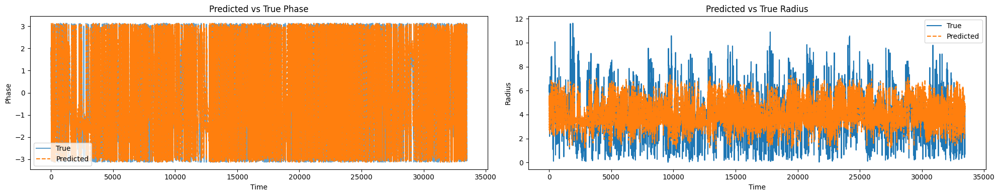

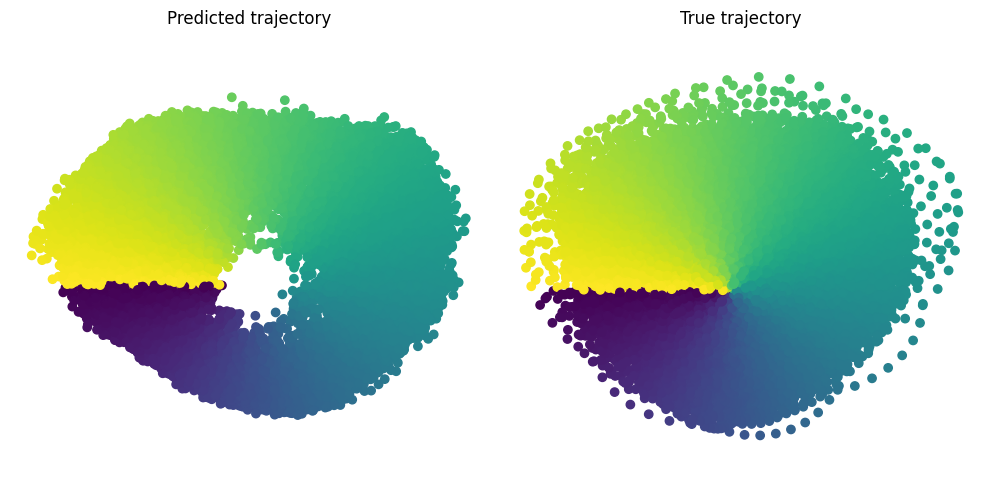

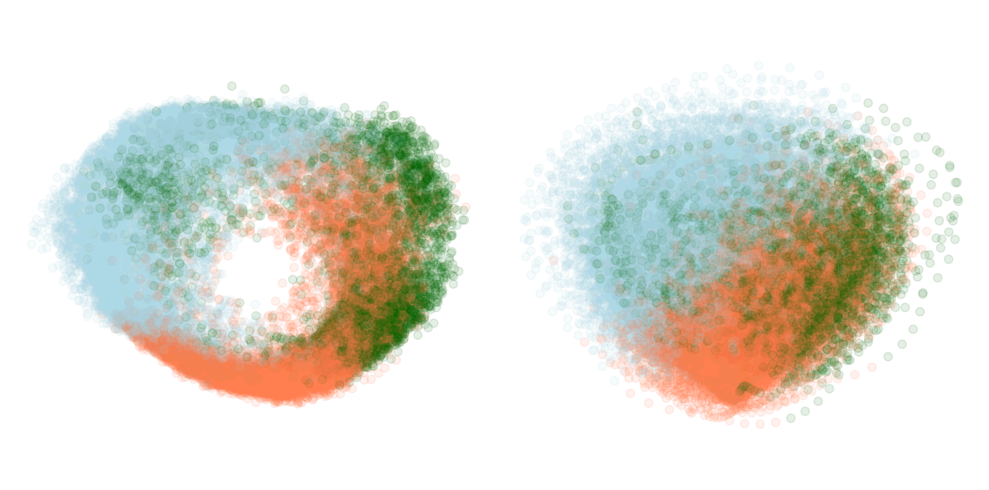

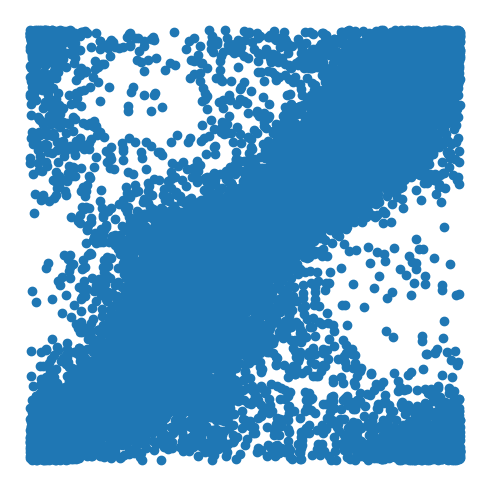

In [10]:

worm_angles, worm_radii = plot_prediction(
    model=model,
    inputs=[velocity, acceleration, worm_curvature, z_norm],
    y=y,
    T=T,
    y_train_mean=input_stats["y_mean"],
    y_train_std=input_stats["y_std"],
    z = z,
    cmap=cmap, normalize=normalize
)

worm_angles = [worm_angles[i*1594:(1+i)*1594] for i in range(20)]
worm_radii = [worm_radii[i*1594:(1+i)*1594] for i in range(20)]

print(y.shape)

# plot a worm

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


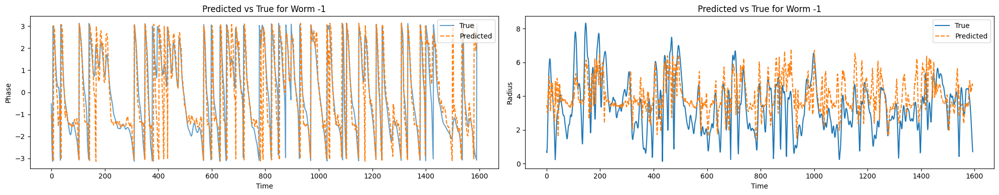

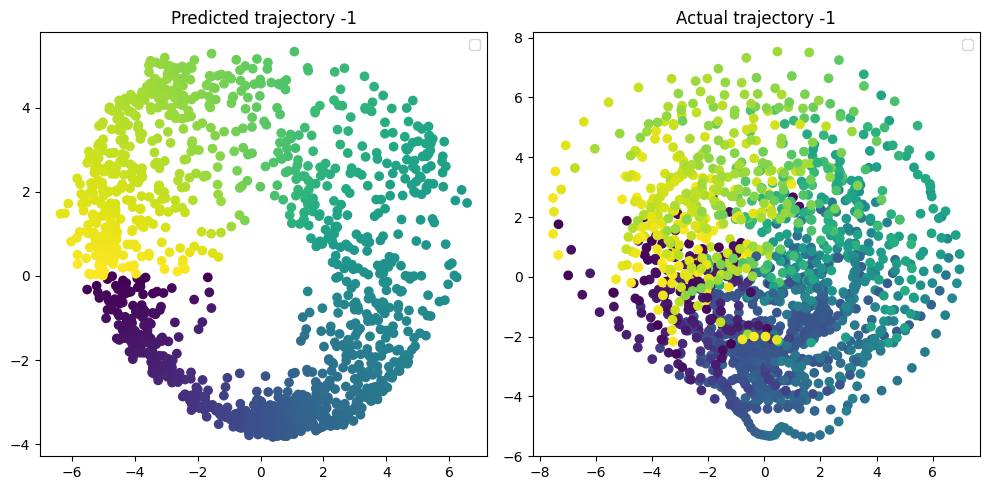

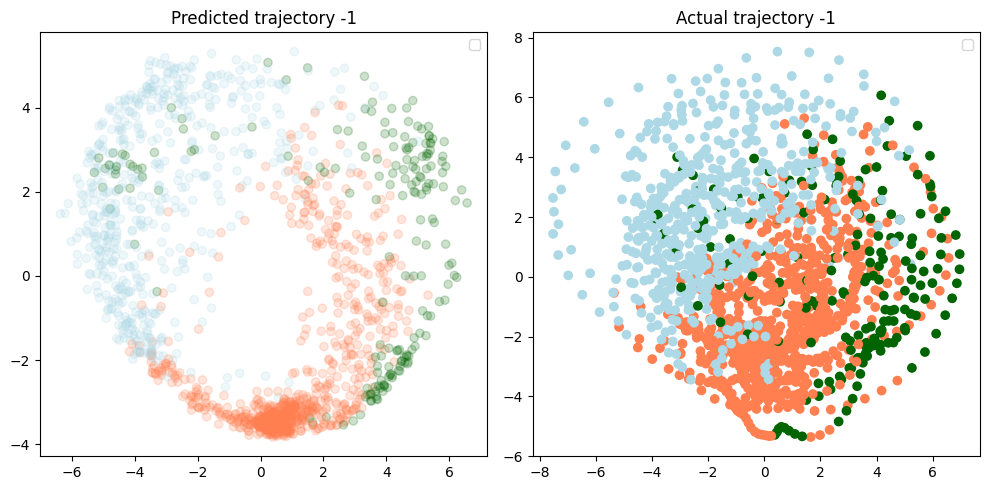

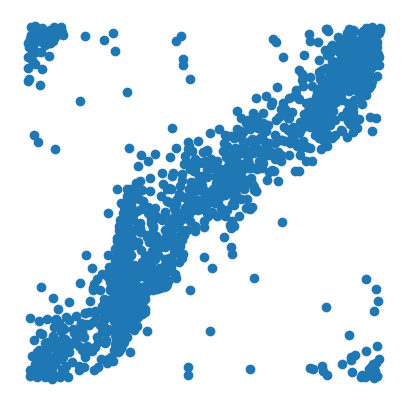

In [11]:

pred_test_angles, pred_test_radii = plot_held_out_worm(model, [velocity, acceleration, worm_curvature, z_norm], y, T, input_stats, new_worm_idx=-1,z=z, cmap=cmap, normalize=normalize)


# Store as new ground truth

In [12]:
T = 5
y = np.array((np.cos(np.concatenate(worm_angles)), np.sin(np.concatenate(worm_angles)), np.concatenate(worm_radii)))
y_new = np.array((np.cos(pred_test_angles), np.sin(pred_test_angles), pred_test_radii))
y = np.hstack((y, y_new))
y = np.array([y[:,i*1594:1594*(i+1)].T for i in range(21)])


In [13]:
print(y.shape)

(21, 1594, 3)


# Activity-directed network

Epoch 0, Train Loss: 1.0847, Test Loss: 0.9536
Epoch 50, Train Loss: 0.2171, Test Loss: 0.1715
Epoch 100, Train Loss: 0.1660, Test Loss: 0.1375
Epoch 150, Train Loss: 0.1381, Test Loss: 0.1125
Epoch 200, Train Loss: 0.1186, Test Loss: 0.0870
Epoch 250, Train Loss: 0.1072, Test Loss: 0.0713
Epoch 300, Train Loss: 0.1008, Test Loss: 0.0639
Epoch 350, Train Loss: 0.0969, Test Loss: 0.0600
Epoch 400, Train Loss: 0.0929, Test Loss: 0.0567
Epoch 450, Train Loss: 0.0894, Test Loss: 0.0553
Final Training Loss: 0.0874
Final Test Loss: 0.0537


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


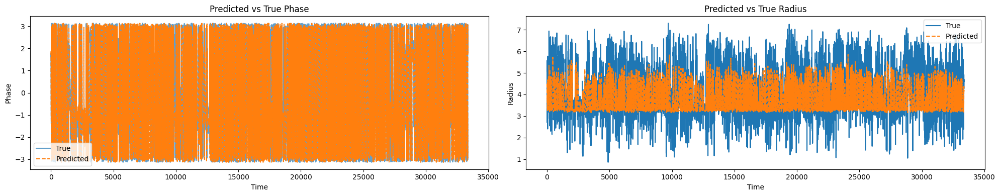

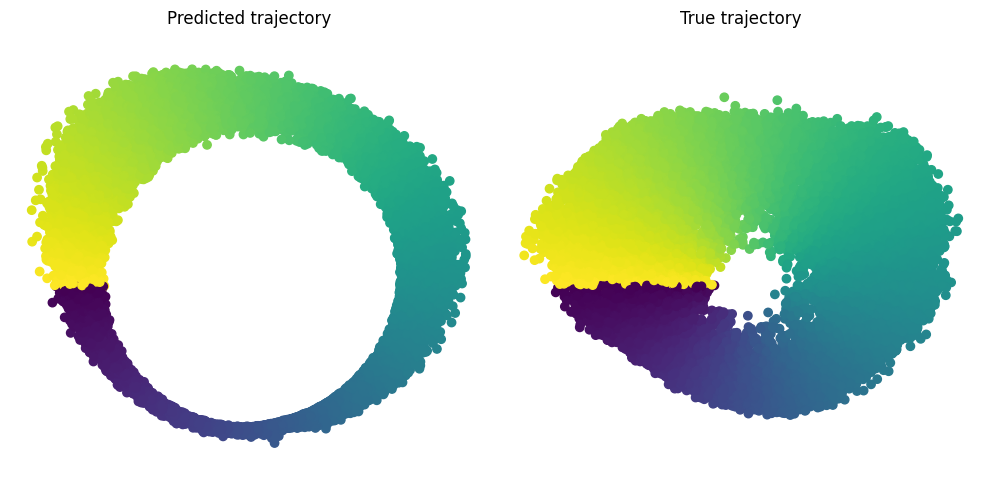

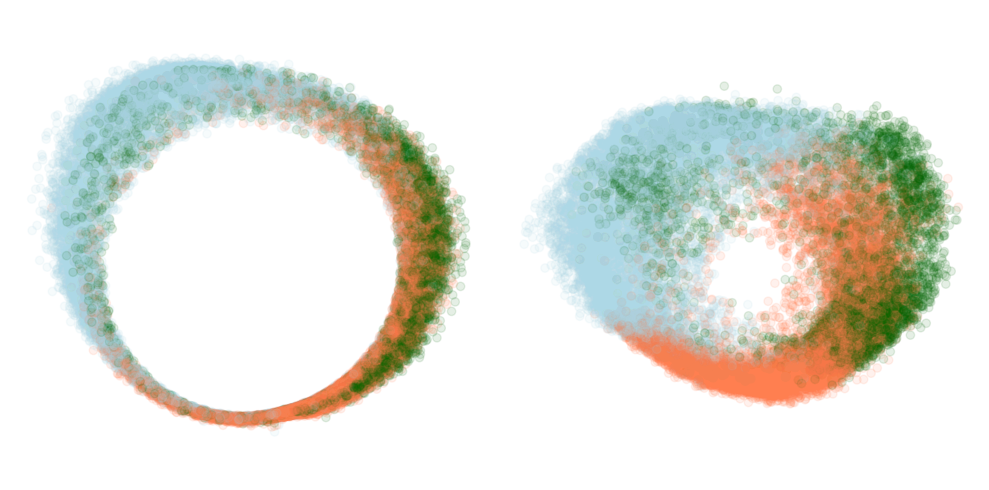

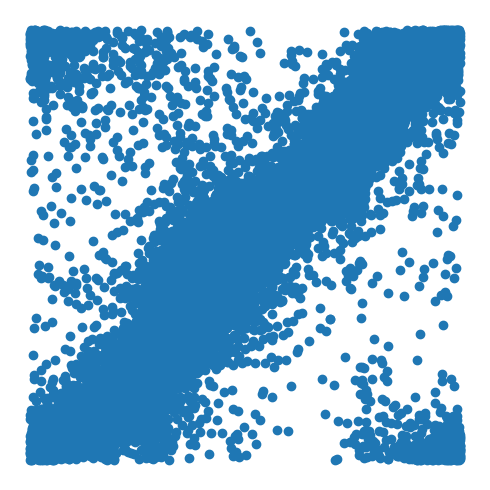

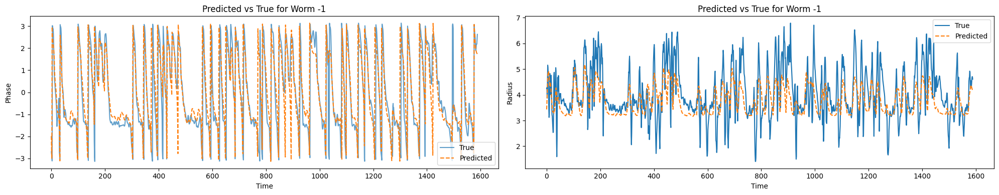

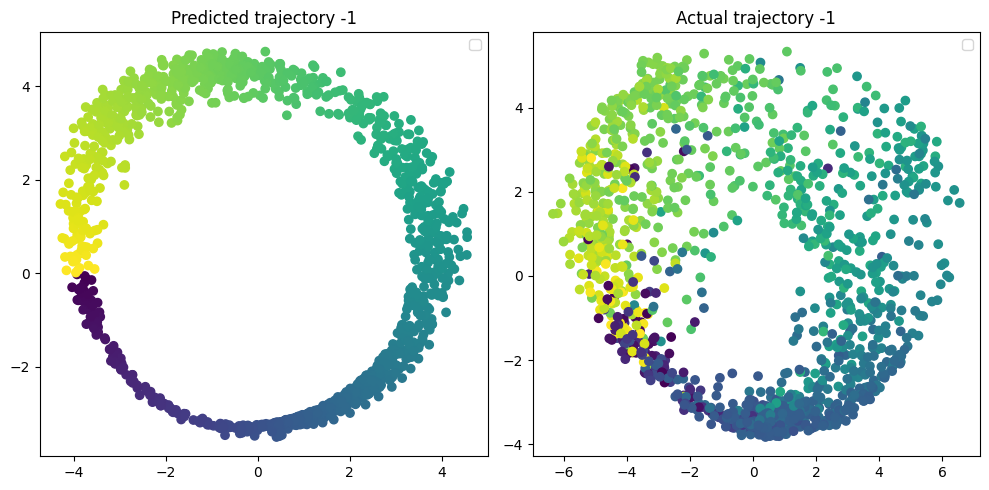

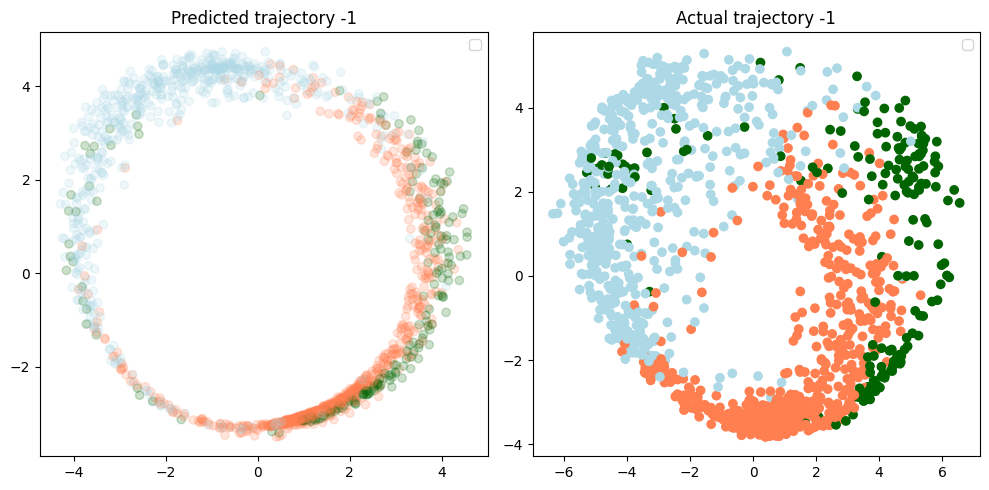

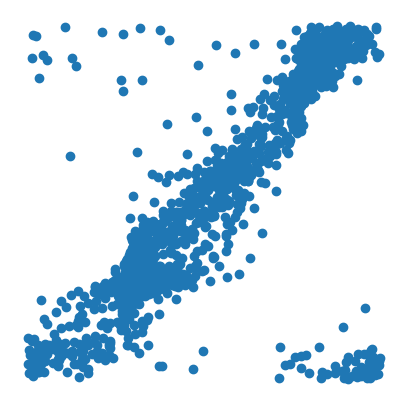

In [14]:
from visualize_donut_time_series_and_states import plot_donut_behs_trained
input_features = np.transpose(np.array(q_x)[:,5:], [2,0,1] )
X_all, y_all = prepare_data(input_features, y, T=T, holdout_idxs=[20])
X_train, X_test, y_train, y_test, input_stats = split_and_normalize(X_all, y_all, normalize=normalize)
model_type = 'ff'  # or 'ff'


input_dim = X_train.shape[-1]* X_train.shape[-2]
output_dim = y_train.shape[1]

model, train_losses, test_losses = train_model(
    X_train, y_train,
    X_test, y_test,
    input_dim=input_dim,
    output_dim=output_dim,
    model_type=model_type,
    hidden_dim=64,
    num_layers=3,
    dropout=0.5,
    learning_rate=0.001,
    num_epochs=500,
)

worm_angles_concat_neural, worm_radii_concat_neural = plot_prediction(
    model=model,
    inputs=input_features,
    y=y,
    T=T,
    y_train_mean=input_stats["y_mean"],
    y_train_std=input_stats["y_std"],
    z=np.array(z)[:,5:],
    cmap=cmap,
    normalize=normalize
)

pred_worm_angles_concat_neural, pred_worm_radii_neural = plot_held_out_worm(model, input_features, y, T, input_stats, new_worm_idx=-1,z=np.array(z)[:,5:], cmap=cmap, normalize=normalize)




In [15]:
# plot_donut_behs_trained(worm_angles_concat_neural, worm_radii_concat_neural,
#                     #  model, inputs, y, 
#                         T,
#                     #  stats,
#                         np.array(z)[:,5:],
#                         cmap,
#                         len_list = 1594,
#                     window = 3)

In [16]:
# from plot_single_neuron_activity_vs_phase import plot_neuron_heatmap_1d
    
# # neuron = "RIB"
# # figs = plot_neuron_heatmap_1d(worm_angles_concat_neural, Y, neuron,neural_labels, np.array(z)[:,5:], ax = None, num_bins = 40)
# pdf_save_dir = "/Users/friederikebuck/Downloads/worm notes/neuron_activity_vs_phase/"
# # os.makedirs(pdf_save_dir, exist_ok=True)
# # # with PdfPages(os.path.join(pdf_save_dir,f"{neuron}_combined_plots.pdf")) as pdf:
# # #     for fig in figs: 
# # #         pdf.savefig(fig)
        
# pdf_save_dir = "/Users/friederikebuck/Downloads/worm notes/neuron_activity_vs_phase1/"

# # with PdfPages(os.path.join(pdf_save_dir,f"all_nuerons_combined_plots.pdf")) as pdf:
# #     for fig in all_figs: 
# #         pdf.savefig(fig)
# donut_neurons_save_dir = "/Users/friederikebuck/Downloads/worm notes/worm_code/fit_hierarchical/rslds_utils"
# with open(os.path.join(donut_neurons_save_dir, "sorted_donut_neurons.txt"), "r") as f:
#     sorted_neurons = [line.strip() for line in f]
# all_figs = []
# for neuron in ["RIB"]:#sorted_neurons:
#     if neuron == "":
#         continue
#     figs = plot_neuron_heatmap_1d(worm_angles_concat_neural, Y, neuron,neural_labels, np.array(z)[:,5:],T,  ax = None, num_bins = 40)
#     all_figs.extend(figs)
#     break
# with PdfPages(os.path.join(pdf_save_dir,f"all_nuerons_combined_plots.pdf")) as pdf:
#     for fig in all_figs: 
#         pdf.savefig(fig)
        
        
# for i, neuron in enumerate(sorted_neurons):
#     if neuron == "":
#         continue
#     figs = plot_neuron_heatmap_1d(worm_angles_concat_neural, Y, neuron,neural_labels, np.array(z)[:,5:], ax = None, num_bins = 40)
#     all_figs.extend(figs)
#     with PdfPages(os.path.join(pdf_save_dir,f"{i}_{neuron}_combined_plots.pdf")) as pdf:
#         for fig in all_figs: 
#             pdf.savefig(fig)
# with PdfPages(os.path.join(pdf_save_dir,f"all_nuerons_combined_plots.pdf")) as pdf:
#     for fig in all_figs: 
#         pdf.savefig(fig)
            
        
#### OPTION 1: donut neurons
# to_keep = ["RIM", "AVA","AVE", "RIB", "AVB", "AIB", "RID", "RME", "ASG", "SIB", "RIV", "VB02", "BAG", "AUA", "AVL", "URY", "AQR", "AIA", "AIM", "IL1"] # top 20 donuty neurons

# donut_neurons_ranked = sorted_neurons

In [17]:
# from visualize_donut_time_series_and_states import plot_donut_behs_1
# all_figs = plot_donut_behs_1(worm_angles_concat_neural, worm_radii_concat_neural,
#                     #  model, inputs, y, 
#                         T,
#                     #  stats,
#                         np.array(z)[:,5:],
#                         cmap,
#                         len_list = 1594,
#                     window = 3)


        
# pdf_save_dir = "/Users/friederikebuck/Downloads/worm notes/neuron_activity_vs_phase/"
# os.makedirs(pdf_save_dir, exist_ok = True)
# print("all_figs", all_figs)
# with PdfPages(os.path.join(pdf_save_dir,f"phase_neural_beh_types.pdf")) as pdf:
#     for fig in all_figs: 
#         pdf.savefig(fig)

compare post rev turn vs post pure rev fwds: 

In [18]:
# from visualize_donut_time_series_and_features import plot_feature_heat_maps_given_phase_1, plot_feature_1d_hist_given_phase_1, plot_feature_heat_maps_given_phase_post_pure_rev
# # plot_feature_heat_maps_given_phase_post_pure_rev(worm_angles_concat_neural, 
# #                                      [ acceleration[:,5:], velocity[:,5:], worm_curvature[:, 5:]],#, body_angle_mag[:, 5:]], 
# #                                      ["acceleration", "velocity", "worm_curvature"],#, "body_angle_mag"], 
# #                                      np.array(z)[:,5:],
# #                                      ax = None, n_bins=10, len_list = 1594)


# # plot_feature_heat_maps_given_phase_1(worm_angles_concat_neural, 
# #                                       [ velocity[:,5:], worm_curvature[:, 5:]],
# #                                       [ "velocity", "worm_curvature"], 
# #                                       np.array(z)[:,5:],  
# #                                       ax = None, n_bins=10, len_list = 1594,  window = 11, subplot_fig_size = (28,2.5))



    
# plot_feature_1d_hist_given_phase_1(worm_angles_concat_neural, 
#                                     [ acceleration_og[:,5:], velocity_og[:,5:], worm_curvature_og[:, 5:]],
#                                    [ "acceleration", "velocity", "worm_curvature"], 
#                                    np.array(z)[:,5:], 
#                                   n_bins=10, len_list = 1594,  window = 5, T=5, subplot_fig_size = (16,10))
    


# # plot_feature_heat_maps_given_phase_1(worm_angles_concat_neural, 
# #                                       [ acceleration[:,5:], worm_curvature[:, 5:]],
# #                                       [ "acceleration", "worm_curvature"], 
# #                                       np.array(z)[:,5:],  
# #                                       ax = None, n_bins=10, len_list = 1594,  window = 11, subplot_fig_size = (28,2.5))


# # plot_feature_heat_maps_given_phase_1(worm_angles_concat_neural, 
# #                                       [ acceleration[:,5:], velocity[:, 5:]],
# #                                       [ "acceleration", "velocity"], 
# #                                       np.array(z)[:,5:],  
# #                                       ax = None, n_bins=10, len_list = 1594,  window = 11, subplot_fig_size = (28,2.5))



In [19]:
###uncomment if want to t plto 2d feature but not super informative compared to 1d featres above
# plot_feature_heat_maps_given_phase_1(worm_angles_concat_neural, 
#                                       [ acceleration_og[:,5:], worm_curvature_og[:, 5:]],
#                                       [ "acceleration", "velocity"], 
#                                       np.array(z)[:,5:],  
#                                       ax = None, n_bins=10, len_list = 1594,  window = 11, subplot_fig_size = (28,2.5))

# plot_feature_heat_maps_given_phase_post_pure_rev(worm_angles_concat_neural, 
#                                      [ acceleration_og[:,5:], velocity_og[:,5:], worm_curvature_og[:, 5:], body_angle_mag_og[:, 5:]], 
#                                      ["acceleration", "velocity", "worm_curvature", "body_angle_mag"], 
#                                      np.array(z)[:,5:],
#                                      ax = None, n_bins=10, len_list = 1594)


# plot_feature_heat_maps_given_phase_1(worm_angles_concat_neural, 
#                                       [ velocity_og[:,5:], worm_curvature_og[:, 5:]],
#                                       [ "velocity", "worm_curvature"], 
#                                       np.array(z)[:,5:],  
#                                       ax = None, n_bins=10, len_list = 1594,  window = 11, subplot_fig_size = (28,2.5))

# plot_feature_heat_maps_given_phase_1(worm_angles_concat_neural, 
#                                       [ acceleration_og[:,5:], worm_curvature_og[:, 5:]],
#                                       [ "acceleration", "worm_curvature"], 
#                                       np.array(z)[:,5:],  
#                                       ax = None, n_bins=10, len_list = 1594,  window = 11, subplot_fig_size = (28,2.5))




# behaviorally-directed network

Epoch 0, Train Loss: 1.1372, Test Loss: 1.0508
Epoch 50, Train Loss: 0.2216, Test Loss: 0.1178
Epoch 100, Train Loss: 0.1558, Test Loss: 0.0845
Epoch 150, Train Loss: 0.1289, Test Loss: 0.0719
Epoch 200, Train Loss: 0.1117, Test Loss: 0.0611
Epoch 250, Train Loss: 0.1009, Test Loss: 0.0521
Epoch 300, Train Loss: 0.0908, Test Loss: 0.0463
Epoch 350, Train Loss: 0.0843, Test Loss: 0.0415
Epoch 400, Train Loss: 0.0802, Test Loss: 0.0373
Epoch 450, Train Loss: 0.0764, Test Loss: 0.0344
Final Training Loss: 0.0742
Final Test Loss: 0.0323


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


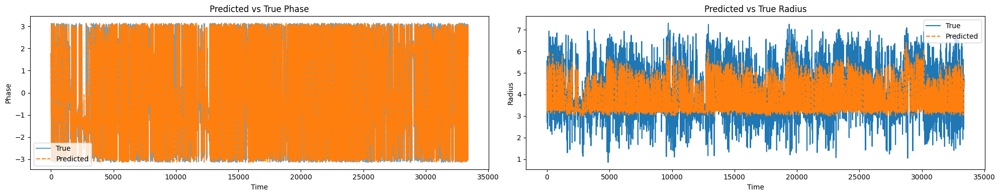

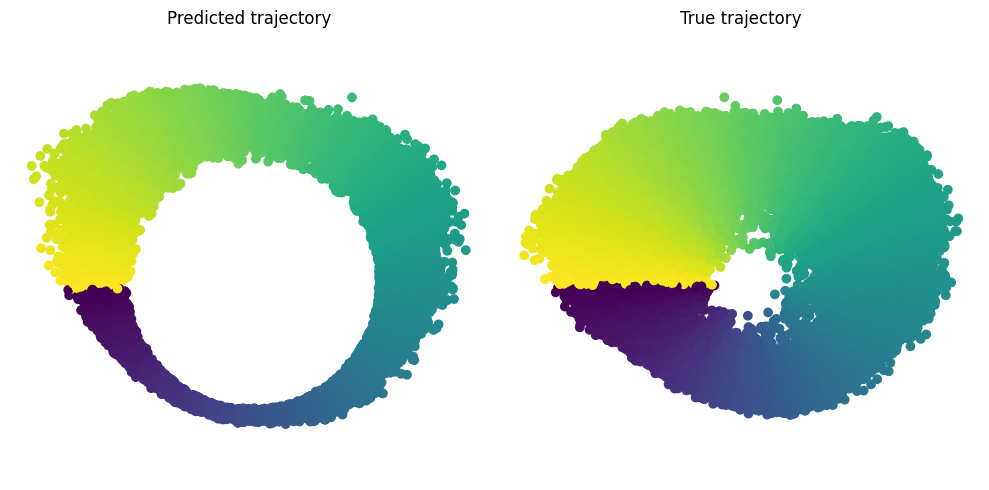

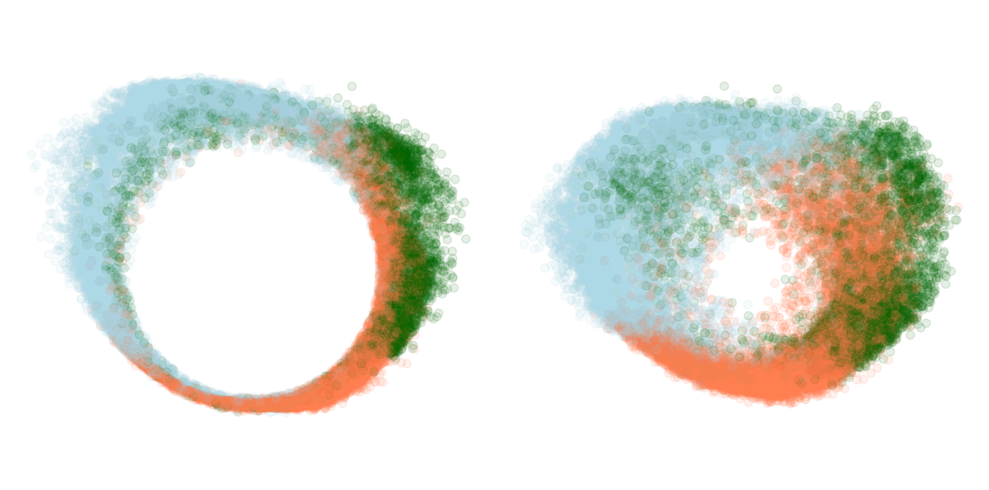

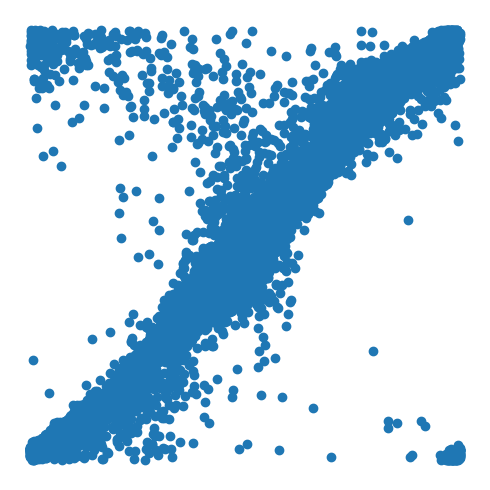

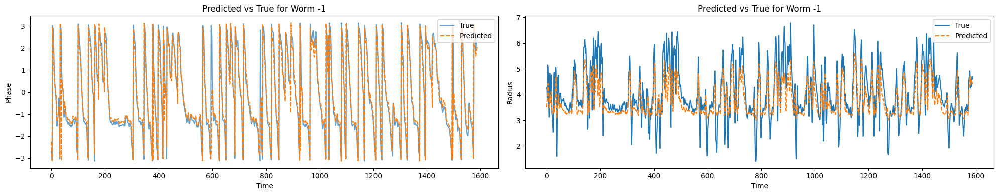

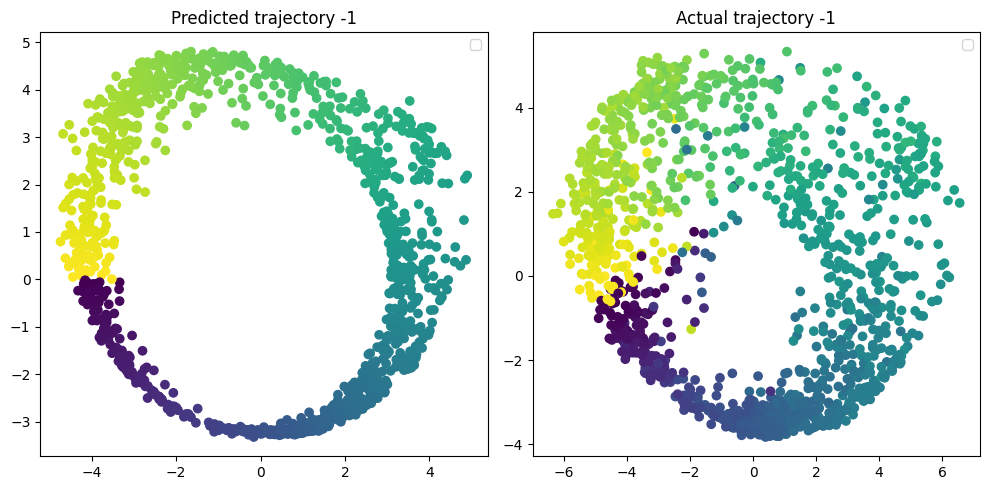

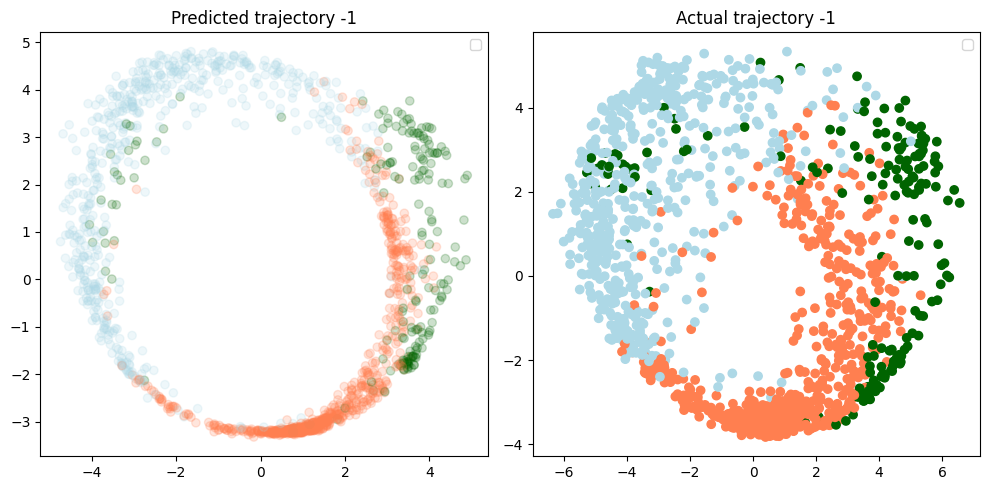

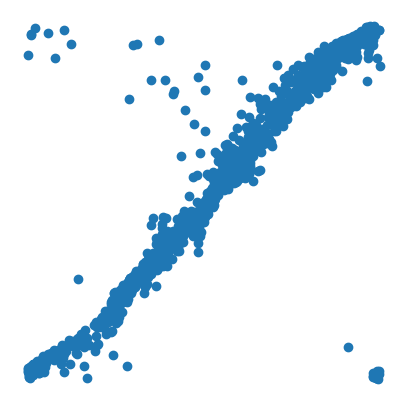

In [20]:
X_all, y_all = prepare_data(np.array([velocity, acceleration, worm_curvature, z_norm])[:,:,5:], y, T=T, holdout_idxs=[20])
X_train, X_test, y_train, y_test, input_stats = split_and_normalize(X_all, y_all, normalize=normalize)

input_dim = X_train.shape[-1]* X_train.shape[-2]
output_dim = y_train.shape[1]

model_type = 'ff'  # or 'ff'

model, train_losses, test_losses = train_model(
    X_train, y_train,
    X_test, y_test,
    input_dim=input_dim,
    output_dim=output_dim,
    model_type=model_type,
    hidden_dim=64,
    num_layers=3,
    dropout=0.5,
    learning_rate=0.001,
    num_epochs=500
)

worm_angles, worm_radii = plot_prediction(
    model=model,
    inputs=np.array([velocity, acceleration, worm_curvature, z_norm])[:,:,5:],
    y=y,
    T=T,
    y_train_mean=input_stats["y_mean"],
    y_train_std=input_stats["y_std"],
    z=np.array(z)[:,5:],
    cmap=cmap,
    normalize=normalize
)

worm_angles = [worm_angles[i*(1594-T):(1+i)*(1594-T)] for i in range(20)]
worm_radii = [worm_radii[i*(1594-T):(1+i)*(1594-T)] for i in range(20)]


# Assuming your data, model, and other relevant variables are loaded
pred_test_angles, pred_test_radii = plot_held_out_worm(model, np.array([velocity, acceleration, worm_curvature, z_norm])[:,:,5:], y, T, input_stats, new_worm_idx=-1,z=np.array(z)[:,5:],cmap=cmap, normalize=normalize)
model_beh_directed = copy.deepcopy(model)

# Phase respomse plot

/Users/friederikebuck/Downloads/worm notes/worm_code/donut_vs_rslds_perturbation_vids.py:229: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode_val, _ = mode(bin_data)
/Users/friederikebuck/Downloads/worm notes/worm_code/donut_vs_rslds_perturbation_vids.py:229: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdim

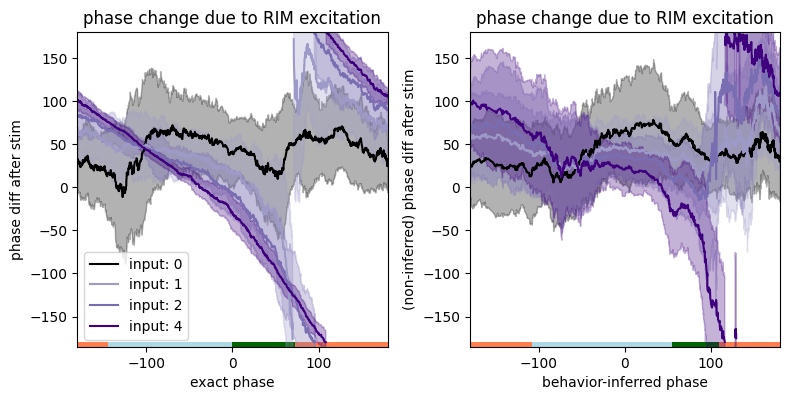

In [21]:
from donut_vs_rslds_perturbation_vids import phase_response_curve, plot_phase_resp, plot_rev_prob
t=10
inputs = np.zeros((t,new_slds.M))
input_id = input_dict["RIM"]
input_str = 1
inputs[:,input_id] = input_str


fig,ax = plt.subplots(1,2, figsize=(8,4))
colors = [plt.get_cmap("Purples")(i) for i in np.linspace(0, 1, 7)][2:]
colors[0] = (0,0,0,1)

for input_str in [0,1,2,4]:
    phase, response, final, final_beh  = phase_response_curve(new_slds, q_x[-1], input_str*inputs, pca, beh_decoder)
    plot_phase_resp(phase, response, q_z[-1], ax=ax[0], label=f"input: {input_str}", color=colors[input_str])

    plot_phase_resp((270-np.degrees(pred_test_angles))%360-180, response[5:], q_z[-1][5:], ax=ax[1], label=f"input: {input_str}", color=colors[input_str])

ax[0].set_xlabel("exact phase")
ax[0].set_ylabel("phase diff after stim")
ax[0].set_title("phase change due to RIM excitation")

ax[1].set_xlabel("behavior-inferred phase")
ax[1].set_ylabel("(non-inferred) phase diff after stim")
ax[1].set_title("phase change due to RIM excitation")

ax[0].legend()
fig.tight_layout()




# Phase reversal prob plot

TypeError: phase_response_curve() missing 1 required positional argument: 'beh_decoder'

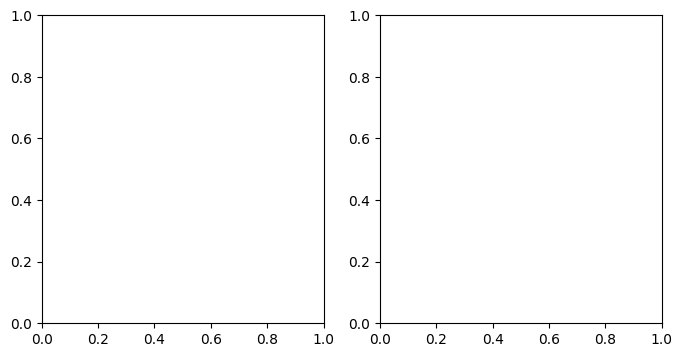

In [22]:
from donut_vs_rslds_perturbation_vids import plot_rev_prob


fig,ax = plt.subplots(1,2, figsize=(8,4))
colors = [plt.get_cmap("Purples")(i) for i in np.linspace(0, 1, 7)][2:]
colors[0] = (0,0,0,1)

for input_str in [0,1,2,4]:
    phase, response, final, final_beh  = phase_response_curve(new_slds, q_x[-1], input_str*inputs, pca)
    plot_rev_prob(phase, final_beh, q_z[-1], ax=ax[0],  label=f"input: {input_str}", color=colors[input_str])

    plot_rev_prob((270-np.degrees(pred_test_angles))%360-180, final_beh[5:], q_z[-1][5:], ax=ax[1], label=f"input: {input_str}", color=colors[input_str])

ax[0].set_xlabel("exact phase")
ax[0].set_ylabel("reversal probability")
ax[0].set_title("reversal probability  due to RIM excitation")

ax[1].set_xlabel("behavior-inferred phase")
ax[1].set_ylabel("reversal probability")
ax[1].set_title("reversal probability due to RIM excitation")

ax[0].legend()
fig.tight_layout()


worm_angles = np.array([np.radians((270-np.degrees(worm_angles[i]+np.pi))%360-180) for i in range(len(worm_angles))])
pred_test_angles = np.radians((270-np.degrees(pred_test_angles+np.pi))%360-180)

# Quantile matching

### Load it in

# Kernel regression funcs

In [ ]:
from kernel_regression_fncs import fit_and_evaluate_kernel_regression

from donut_vs_rslds_perturbation_vids import simulate_exp, plot_results
# q_y = [slds.smooth(q_x[w], Y[w]) for w in range(21)]
q_y = [Y[w] for w in range(21)]
angles_cat = np.concatenate(worm_angles)
radii_cat = np.concatenate(worm_radii)
neurons_cat = np.concatenate(np.array(q_y[:20])[:,10:])
z_cat = np.concatenate(np.array(z[:20])[:,10:])


y_est2s = []
for neuron_name in ["AVA", "RIM", "AIB"]:


    neuron_act = neurons_cat[:, neural_labels == f"F - {neuron_name}"][:,0]
    x0,x1 = angles_cat,radii_cat
    y = neuron_act

    x = np.stack((x0, x1)).T
    x = x[y!=0]
    y = y[y!=0]

    y_est2 = fit_and_evaluate_kernel_regression(x, y, method="kernel", bandwidths=(1,0.3), plot=False, kernel_type=("uniform", "gaussian"), alpha = 0.1 + 0.2*(2%5), return_est=True)
    y_est2s.append(y_est2)


# Load and adjust data

[]
exp_acc1 (709200,)
exp_acc1.shape) (189120,)

resampled_pause (189120,)


NameError: name 'smooth_trace' is not defined

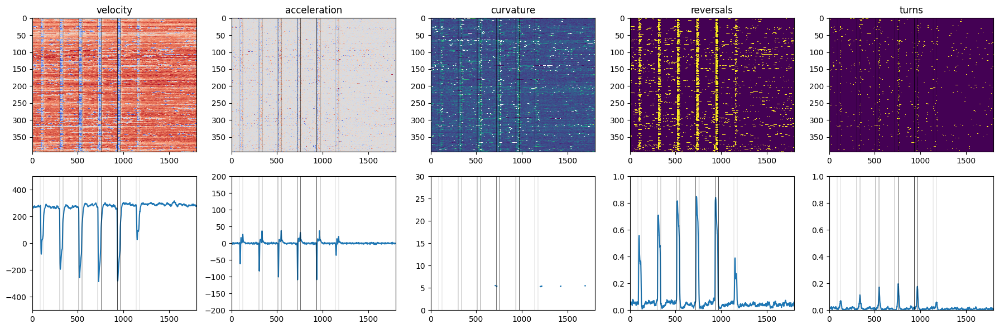

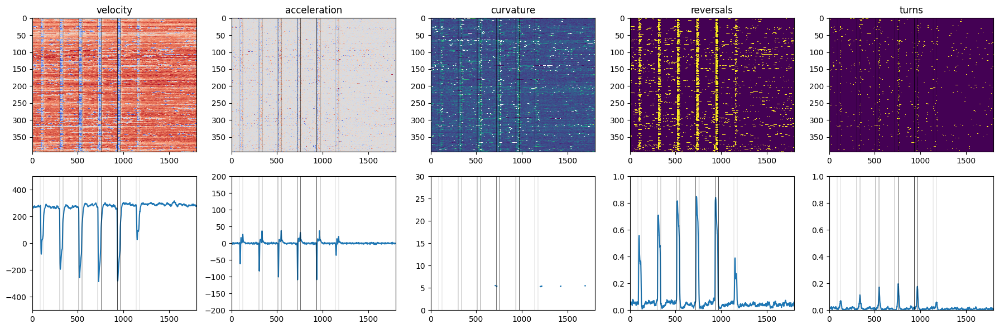

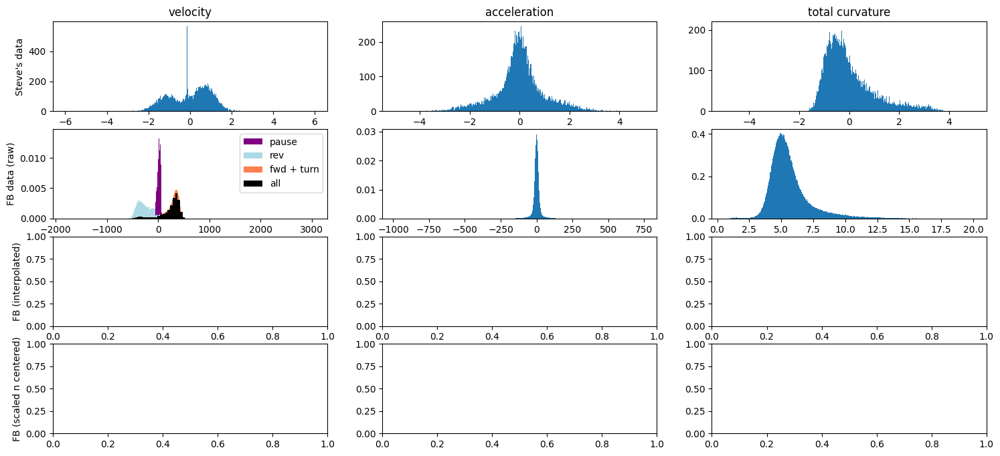

In [ ]:
from load_and_process_FB_data_fncs import load_data, reformat_data,plot_data,  analyze_data
# experiment = "duty_cycle"
# condition = "exp"
# neuron = "AVA"
# path = "/Users/friederikebuck/beh_analysis_results/csv/_Aim1_AVA_duty_cycle/"


# experiment = "duty_cycle"
# condition = "exp"
# neuron = "AIB"
# path = "/Users/friederikebuck/beh_analysis_results/csv/_AIBC-3_Aim1_AIB_duty_cycle/"


experiment = "duty_cycle"
condition = "exp"
neuron = "RIM"
path = "/Users/friederikebuck/beh_analysis_results/csv/_Aim1_RIM_duty_cycle/"


exp_vel, exp_acc, exp_curve1, exp_behaviors, pauses, turns, body_angle_mag = load_data(experiment, condition, neuron, path= path)
exp_curve = copy.deepcopy(exp_curve1)
exp_curve[exp_curve == 0] = np.nan


exp_onsets = plot_data(exp_vel, exp_acc, exp_curve, exp_behaviors, turns, experiment, fps=6)
plot_data(exp_vel, exp_acc, exp_curve, exp_behaviors, turns, experiment, fps=6)
# resampled_vel, resampled_acc, resampled_curve, resampled_rev, resampled_turn = reformat_data(exp_vel, exp_acc, exp_curve, exp_behaviors, turns, pauses, plot=True, sep_pos_neg_resample = False)
resampled_vel, resampled_acc, resampled_curve, resampled_rev, resampled_turn = reformat_data(exp_vel, exp_acc, exp_curve, exp_behaviors, turns, pauses, plot=True, sep_pos_neg_resample = True)


onsets = plot_data(resampled_vel, resampled_acc, resampled_curve, resampled_rev, resampled_turn, experiment, fps=1.6, orig = False)


# experiment = "duty_cycle"
# condition = "exp"
# neuron = "AVA"


# exp_vel, exp_acc, exp_curve, exp_behaviors, pauses, turns = load_data(experiment, condition, neuron)
# exp_onsets = plot_data(exp_vel, exp_acc, exp_curve, exp_behaviors, turns, experiment, fps=6)
# resampled_vel, resampled_acc, resampled_curve, resampled_rev, resampled_turn = reformat_data(exp_vel, exp_acc, exp_curve, exp_behaviors, turns, pauses, plot=True)
# onsets = plot_data(resampled_vel, resampled_acc, resampled_curve, resampled_rev, resampled_turn, experiment, fps=1.6, orig = False)


times = onsets
inferred_phases, final_behaviors, final_behaviors_all, inferred_phases_all, inferred_rad_all, behaviors_all, inferred_rad, initial_behaviors, initial_cts_beh, X_all_LSTM = analyze_data(resampled_vel, resampled_acc, resampled_curve, resampled_rev, resampled_turn, times, model_beh_directed, lag=16, inclusion_thresh = 2, model_type="ff", remove_revs=False)

fig,ax = plt.subplots(figsize=(4,4))
donut_x = inferred_rad_all*np.cos(inferred_phases_all)
donut_y = inferred_rad_all*np.sin(inferred_phases_all)

ax.scatter(donut_x[::10], donut_y[::10], c=behaviors_all[::10], cmap=cmap, vmin=-1, vmax=7, alpha = 0.1)



In [ ]:

def latency_to_reversal(reshaped_rev, start_time, max_latency=None):
    n_worms, T = reshaped_rev.shape
    latencies = np.full(n_worms, np.nan)

    for i in range(n_worms):
        end_time = T if max_latency is None else min(T, start_time + max_latency)
        future = reshaped_rev[i, start_time:end_time]
        reversal_indices = np.where(future)[0]
        if reversal_indices.size > 0:
            latencies[i] = reversal_indices[0]
    
    return latencies



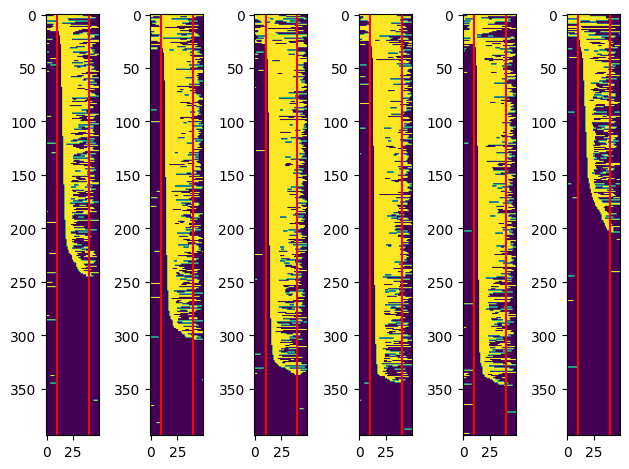

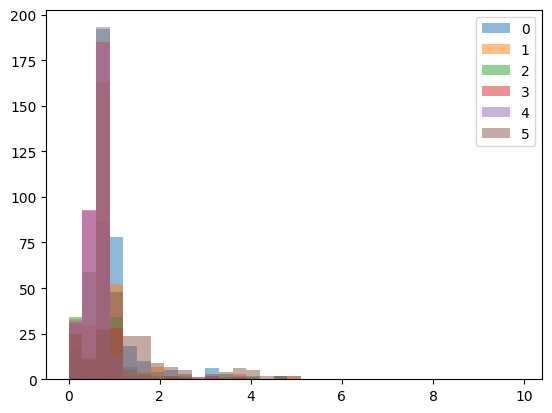

In [ ]:
if experiment == "time_titration":
    durations = [1,3,5,10]
else:
    durations = [5,5,5,5,5,5]
    if experiment == "hiscl":
        durations = [5,5]

exp_offsets = np.array([exp_onsets[i] + 6*durations[i] for i in range(len(durations))])


fig,ax = plt.subplots(1,len(durations))
fig2,ax2 = plt.subplots()

latencies = []
for i in range(len(durations)):
    latency = latency_to_reversal(exp_behaviors, exp_onsets[i], max_latency = 6*durations[i]+1)
    idx = np.argsort(latency)
    ax[i].imshow(exp_behaviors[idx, -10+exp_onsets[i]:exp_offsets[i]+10], aspect="auto")
    ax[i].axvline(10, c='r')
    ax[i].axvline(10+6*durations[i], c='r')
    ax2.hist(latency/6, bins = np.arange(0,10,.3), alpha = 0.5, label=i)
    # latency[np.isnan(latency)] = np.nanmax(latency)+1
    latencies.append(latency)
fig.tight_layout()
latencies = np.array(latencies)/6
ax2.legend()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


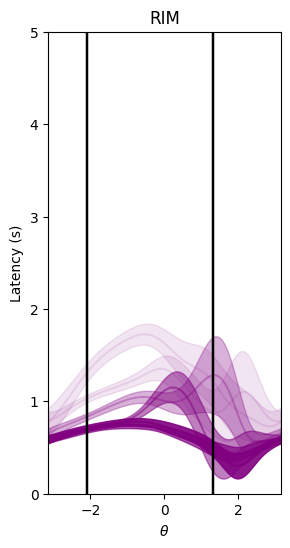

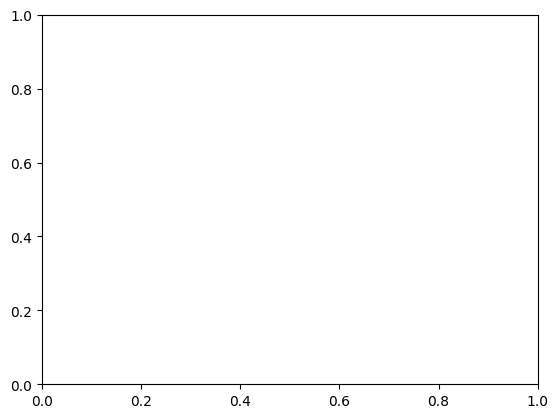

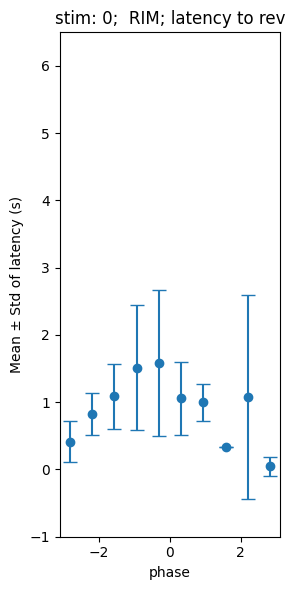

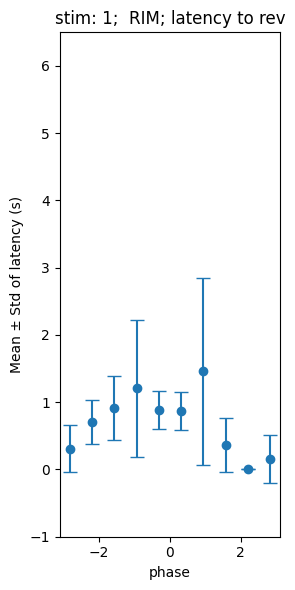

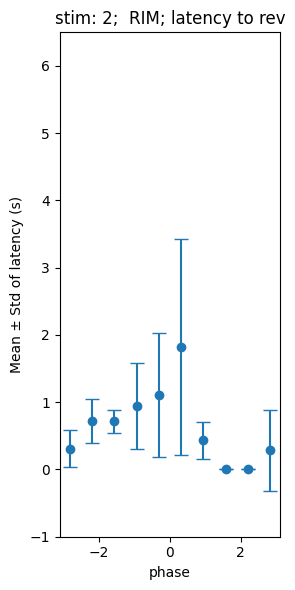

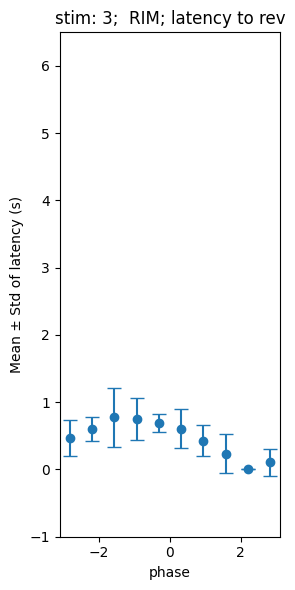

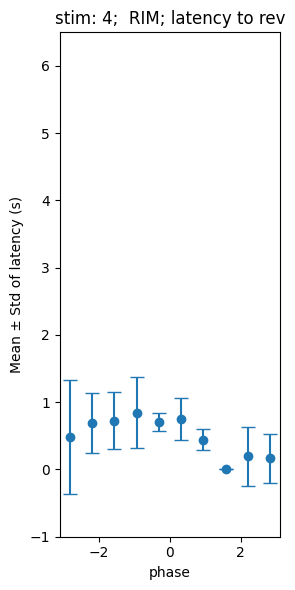

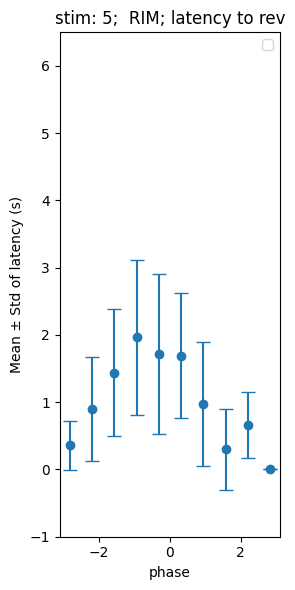

In [ ]:
# Plot

def plot_binned_counts(x,y,title_supp="",  fig = None, ax = None, n_bins = 10):
    # Define bin edges
    bin_edges = np.linspace(-1*np.pi, np.pi, n_bins + 1)

    # Digitize x values to bin indices
    bin_indices = np.digitize(x, bin_edges) - 1

    # Preallocate arrays
    means = np.zeros(n_bins)
    stds = np.zeros(n_bins)
    bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2

    # Compute mean and std per bin
    for i in range(n_bins):
        mask = bin_indices == i
        if np.any(mask):
            means[i] = np.mean(y[mask])
            stds[i] = np.std(y[mask])
        else:
            means[i] = np.nan
            stds[i] = np.nan

    ax.errorbar(bin_centers, means, yerr=stds, fmt='o', capsize=5)
    ax.set_xlabel('phase')
    ax.set_ylabel('Mean ± Std of latency (s)')
    ax.set_ylim([-1,6.5])
    ax.set_title(f'{title_supp} {neuron}; latency to rev')
    # plt.show()


fig,ax = plt.subplots(figsize=(3,6))

idxs = [[0],[1],[2],[3],[4],[5]]

cdf_fig, cdf_ax  = plt.subplots()
for i in range(len(idxs)):

    x0,x1 = np.concatenate(inferred_phases[idxs[i]]), np.concatenate(inferred_rad[idxs[i]])
    y = np.concatenate(latencies[idxs[i]])
    non_nan_ys = np.logical_not(np.isnan(y))
    x = np.stack((x0, x1)).T
    x = x[~np.isnan(y)]
    y = y[~np.isnan(y)]
    
    fig1,ax1 = plt.subplots(figsize=(3,6))
    # ax1.scatter(x0[non_nan_ys], y, label = i)
    plot_binned_counts(x0[non_nan_ys],y,title_supp = f"stim: {i}; ",fig = fig1, ax = ax1, n_bins = 10)
    
    
    y_est = fit_and_evaluate_kernel_regression(x, y, method="kernel", bandwidths=(0.3,0.3), plot=True, kernel_type=("vonmises", "gaussian"), ax=ax, alpha = 0.1 + 0.2*(i%5), return_est=True)
    ax.set_xlabel(r"$\theta$")
    ax.set_ylabel("Latency (s)")
    ax.set_ylim(0,5)
    ax.set_title(neuron)
    ax.axvline(-2.1, color='k')
    ax.axvline(1.3, color='k')
    ax.set_xlim(-np.pi, np.pi)
    
    # plot_cdf(latencies, ax )

ax1.legend()




I 0
0; 7; logisticAccuracy: 0.8859649122807017
0; 7; logisticPrecision: 0.8865666581913721
0; 7; logisticRecall: 0.8859649122807017
0; 7; logisticF1 Score: 0.8861953606836589
0;7; linear svc l1Accuracy: 0.8859649122807017
0;7; linear svc l1Precision: 0.8884803307092755
0;7; linear svc l1Recall: 0.8859649122807017
0;7; linear svc l1F1 Score: 0.8865960521742311
Best C: 10
Best CV accuracy: 0.9408352534562212
0;7; linear svc l1 c 10Accuracy: 0.8947368421052632
0;7; linear svc l1 c 10Precision: 0.8961165701978733
0;7; linear svc l1 c 10Recall: 0.8947368421052632
0;7; linear svc l1 c 10F1 Score: 0.8951436562420544


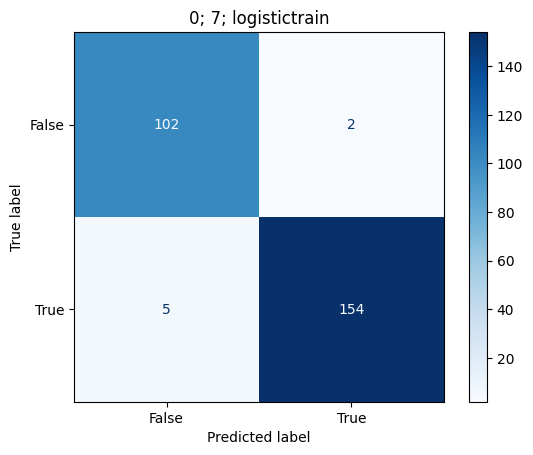

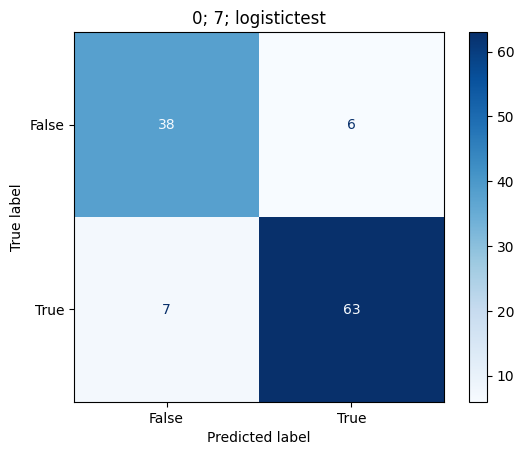

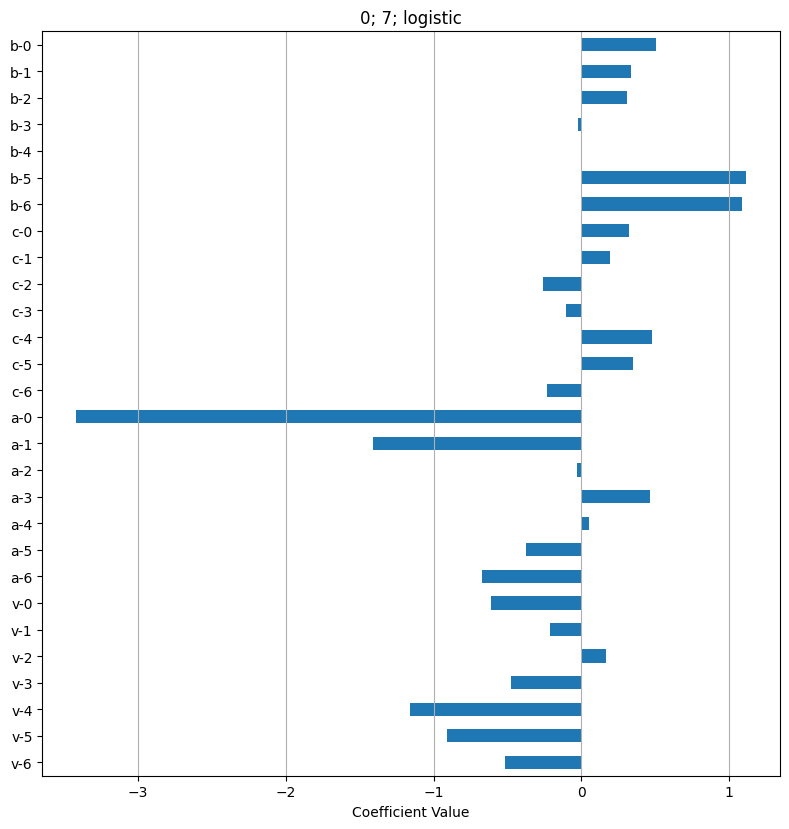

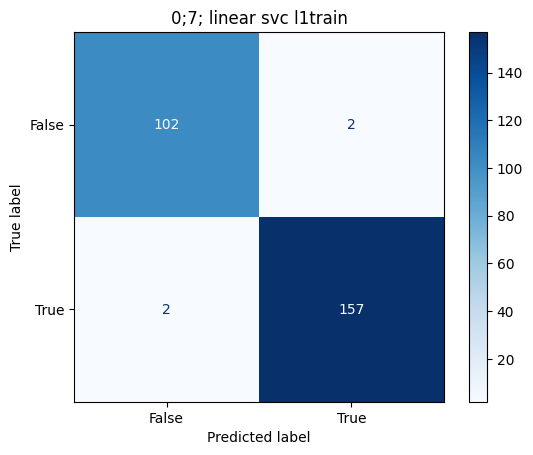

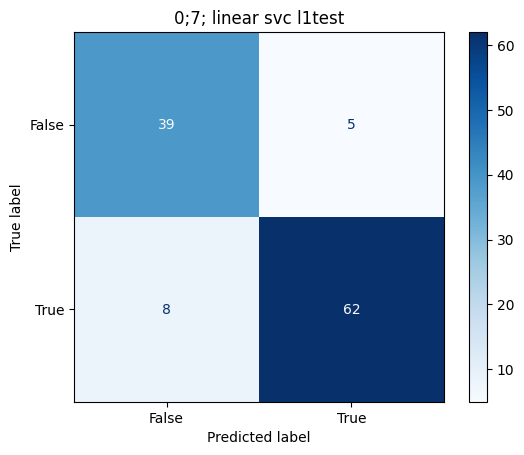

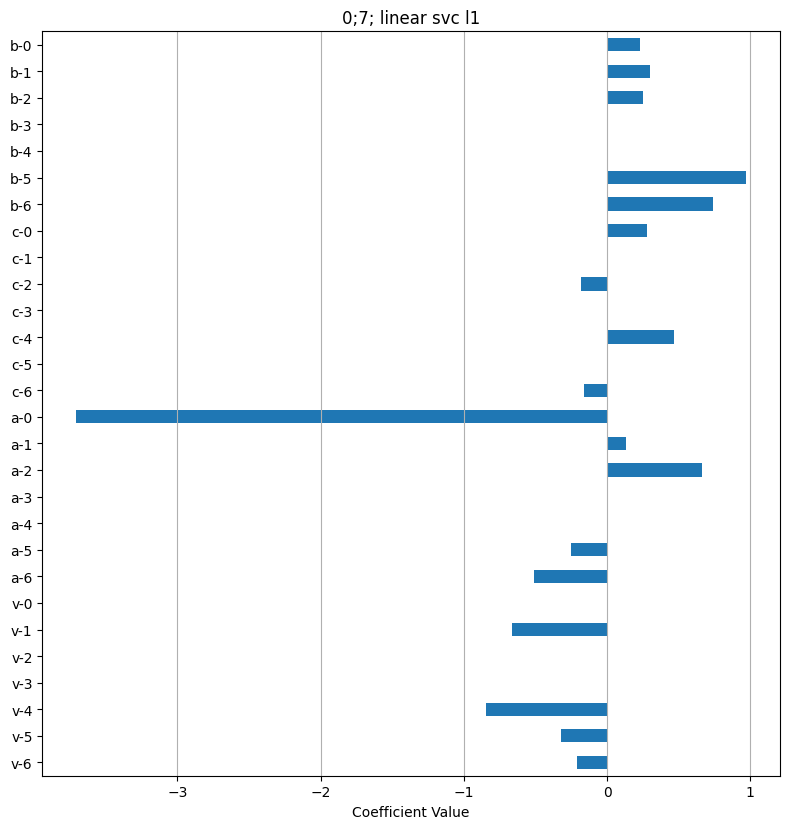

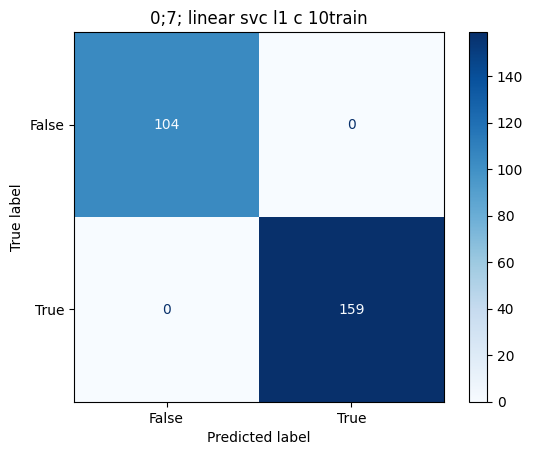

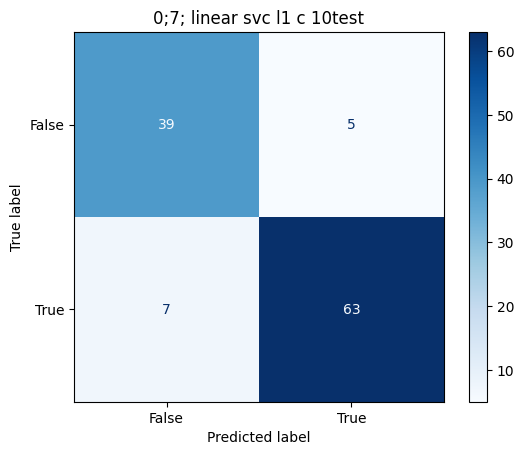

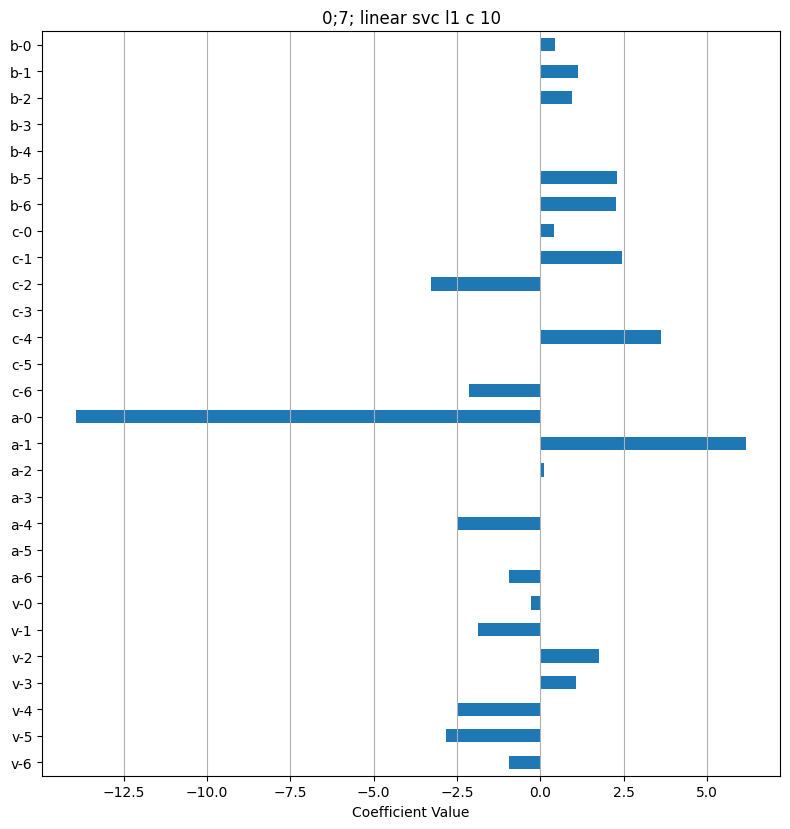

In [ ]:

###get inputs into lstm 
beh_map = [z_norm.min(), z_norm.min()/2 + z_norm.max()/2, z_norm.max()]


if experiment == "time_titration":
    durations = [1,3,5,10]
else:
    durations = [5,5,5,5,5,5]
    if experiment == "hiscl":
        durations = [5,5]
        

from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LinearRegression, Lasso, TweedieRegressor
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn import tree
import warnings
##get latency and features for each stim 
# random_state = 42
# test_size = 0.2

from predict_latency_prob_from_features_donut import * 
with warnings.catch_warnings():
    warnings.simplefilter("ignore")

    random_state = 30
    test_size = 0.3
    T=5

    feature_names_ordered = True

    resampled_onsets= onsets
    # for n_timesteps in range(1, 10, 2 ):
    for i, (resampled_onset, exp_onset) in enumerate(zip(resampled_onsets, exp_onsets)):
    # for i, (resampled_onset, exp_onset) in [list(enumerate(zip(resampled_onsets, exp_onsets)))[0]]:
        for n_timesteps in range(7, 10, 2 ):
            feature_names = np.array([[f"v-{n_timesteps-t-1}", f"a-{n_timesteps-t-1}", f"c-{n_timesteps-t-1}", f"b-{n_timesteps-t-1}"] for t in range(n_timesteps)]).flatten()
            # feature_names_ordered = np.array([[f"v-{T-t-1}", f"a-{T-t-1}", f"c-{T-t-1}", f"b-{T-t-1}"] for t in range(0,n_timesteps)]).reshape((len(feature_names), -1), order='F').flatten()
            X_stim = prep_FB_inputs(resampled_vel, resampled_acc, resampled_curve, resampled_rev, resampled_turn, z,  T = n_timesteps ) #shape (n_tracks, n_frames, n_features)
            # X_stim = [X_all_LSTM[i].numpy() for i in range(len(X_all_LSTM))]
            rev_bin = exp_behaviors

            print("I", i )
            X_stim_all =X_stim[:, resampled_onset-T, :]# X_all_LSTM[resampled_onset-T, :]
            # Get rid of already reversing guys###

            Y_latency = latency_to_reversal(rev_bin, exp_onset, max_latency = 6*durations[i]+1)/6 # nan where not 
            no_rev_at_onset = Y_latency!=0
            
            Y_prob = np.logical_not(np.isnan(Y_latency[no_rev_at_onset]))# classfy y/n did rev happen
            X_prob = copy.deepcopy(X_stim_all[no_rev_at_onset])
            
            ###    
            X_train, X_test, y_train, y_test = train_test_split(X_prob, Y_prob, test_size=test_size, random_state=random_state)
            model = LogisticRegression(max_iter=1000, random_state=random_state)#, class_weight="balanced")
            model_label = f"{i}; {n_timesteps}; logistic"
            fit_visualize_model_classifiction(model, model_label, feature_names, X_train, X_test, y_train, y_test, n_timesteps, feature_names_ordered = feature_names_ordered)

            
            
            model = LinearSVC(penalty='l1', dual=False, max_iter=10000)
            model_label = f"{i};{n_timesteps}; linear svc l1"
            fit_visualize_model_classifiction(model, model_label, feature_names, X_train, X_test, y_train, y_test, n_timesteps, feature_names_ordered = feature_names_ordered)
            # Grid of C values to search
            param_grid = {
                'C': [0.001, 0.01, 0.1, 1, 10, 100]
            }

            model = LinearSVC(penalty='l1', dual=False, max_iter=10000)
            # Grid search
            grid = GridSearchCV(model, param_grid, cv=5, scoring='balanced_accuracy')
            grid.fit(X_train, y_train)

            # Best parameters and score
            print("Best C:", grid.best_params_['C'])
            print("Best CV accuracy:", grid.best_score_)
            c = grid.best_params_['C']
            model = LinearSVC(penalty='l1', dual=False, max_iter=10000, C = c)
            model_label = f"{i};{n_timesteps}; linear svc l1 c {c}"
            fit_visualize_model_classifiction(model, model_label, feature_names, X_train, X_test, y_train, y_test, n_timesteps, feature_names_ordered = feature_names_ordered)
            break
        break
            
            # model = tree.DecisionTreeClassifier()
            # model_label = f"{i}; {n_timesteps}; tree no max depth"
            # model, y_pred = fit_visualize_model_classifiction(model, model_label, feature_names, X_train, X_test, y_train, y_test, n_timesteps, get_coeff = False, feature_names_ordered = feature_names_ordered)
            # fig, ax = plt.subplots()
            # tree.plot_tree(model, feature_names = feature_names)
            
            # model = tree.DecisionTreeClassifier(max_depth=3)
            # model_label = f"{i}; {n_timesteps}; tree max depth = 3"
            # model, y_pred = fit_visualize_model_classifiction(model, model_label, feature_names, X_train, X_test, y_train, y_test, n_timesteps,  get_coeff = False, feature_names_ordered = feature_names_ordered)
            # fig, ax = plt.subplots()
            # tree.plot_tree(model, feature_names = feature_names)
            
            # model = svm.SVC()
            # model_label = f"{i}; {n_timesteps}; SVC rbf kernel"
            # model, y_pred = fit_visualize_model_classifiction(model, model_label, feature_names, X_train, X_test, y_train, y_test, n_timesteps, get_coeff = False, feature_names_ordered = feature_names_ordered)

            
            ###########try latency 
            
            # non_nan_non_rev_is = np.argwhere(np.logical_and(np.logical_not(np.isnan(Y_latency)), Y_latency!=0)).flatten()
            # X_stim_all_latency = X_stim_all[non_nan_non_rev_is]# classfy y/n did stim happen
            # Y_latency = Y_latency[non_nan_non_rev_is]
            
            # X_train, X_test, y_train, y_test = train_test_split(X_stim_all_latency, Y_latency, test_size=test_size, random_state=random_state)

            # # model = LinearRegression()
            # # model_label= f"{i}; {n_timesteps}; lin"
            # # fit_visualize_model_regression(model, model_label, feature_names, X_train, X_test, y_train, y_test, n_timesteps, feature_names_ordered = feature_names_ordered)
            # # # model_lr.fit(X_train, y_train)
            # # # print("Linear Regression R²:", model_lr.score(X_test, y_test))
            # # # print("Coefficients:", model_lr.coef_)
            
            # alphas = np.logspace(-4, 2, 20)
            # lasso = Lasso(max_iter=10000)
            # param_grid = {'alpha': alphas}
            # grid_search_lasso = GridSearchCV(lasso, param_grid, cv=5, scoring='r2')
            # grid_search_lasso.fit(X_train, y_train)

            # best_lasso = grid_search_lasso.best_estimator_

            # print("Best alpha lasso:", grid_search_lasso.best_params_['alpha'])
            # print("Best CV R²:", grid_search_lasso.best_score_)
            # alpha = grid_search_lasso.best_params_['alpha']
            # model = Lasso(alpha=alpha)  # You can tune alpha with CV
            # model_label= f"{i};{n_timesteps}; lasso_a{np.round(alpha,2)}"
            # fit_visualize_model_regression(model, model_label, feature_names, X_train, X_test, y_train, y_test, n_timesteps,  feature_names_ordered = feature_names_ordered)
            
            
            # model_lasso.fit(X_train, y_train)
            
            # print("Lasso R²:", model_lasso.score(X_test, y_test))
            # print("Coefficients:", model_lasso.coef_)# Range of alpha values to try (log scale)
            
            # Gamma regression
            #If your latencies are tightly distributed, or variance is constant → LinearRegression or Lasso
            # If variance grows with latency (heteroscedasticity) → TweedieRegressor(power=2)
            
            # param_grid = {
            #     'alpha': np.logspace(-4, 2, 10),  # Try a wide range
            # }

            # model = TweedieRegressor(power=2, alpha=0.0, link='log')  # log link enforces positivity
            # model_label=f"{i};gamma_a0.0"
            # fit_visualize_model_regression(model, model_label, feature_names, X_train, X_test, y_train, y_test)
            # grid_search_lasso = GridSearchCV(model, param_grid, cv=5, scoring='r2')
            # grid_search_lasso.fit(X_train, y_train)
            # best_lasso = grid_search_lasso.best_estimator_

            # print("Best alpha gamma:", grid_search_lasso.best_params_['alpha'])
            # print("Best CV R²:", grid_search_lasso.best_score_)
            # alpha = grid_search_lasso.best_params_['alpha']
            # model = Lasso(alpha=alpha)  # You can tune alpha with CV
            # model_label= f"{i};gamma_a{np.round(alpha,2)}"
            # fit_visualize_model_regression(model, model_label, feature_names, X_train, X_test, y_train, y_test)
            
            
            # model_gamma.fit(X_train, y_train)
            # print("Gamma GLM R²:", model_gamma.score(X_train, y_test))
            # print("Coefficients:", model_gamma.coef_)
            
            
            
            # ###########
            # ####scaled
            # scaler = StandardScaler()
            # X_train_scaled = scaler.fit_transform(X_train)
            # X_train = X_train_scaled
            # X_test_scaled = scaler.transform(X_test)
            
            
            # model = LinearRegression()
            # model_label= f"{i};lin;scaled"
            # fit_visualize_model_regression(model, model_label, feature_names, X_train_scaled, X_test_scaled, y_train, y_test)
            # # model_lr.fit(X_train, y_train)
            # # print("Linear Regression R²:", model_lr.score(X_test, y_test))
            # # print("Coefficients:", model_lr.coef_)

            
            # alphas = np.logspace(-4, 2, 20)
            # lasso = Lasso(max_iter=10000)
            # param_grid = {'alpha': alphas}
            # grid_search_lasso = GridSearchCV(lasso, param_grid, cv=5, scoring='r2')
            # grid_search_lasso.fit(X_train, y_train)

            # best_lasso = grid_search_lasso.best_estimator_

            # # print("Best alpha:", grid_search_lasso.best_params_['alpha'])
            # # print("Best CV R²:", grid_search_lasso.best_score_)
            # alpha = grid_search_lasso.best_params_['alpha']
            # model = Lasso(alpha=alpha)  # You can tune alpha with CV
            # model_label= f"{i}; scaled;lasso_a{np.round(alpha,2)}"
            # fit_visualize_model_regression(model, model_label, feature_names,X_train_scaled, X_test_scaled, y_train, y_test)
            
            
            # # model_lasso.fit(X_train, y_train)
            
            # # print("Lasso R²:", model_lasso.score(X_test, y_test))
            # # print("Coefficients:", model_lasso.coef_)# Range of alpha values to try (log scale)
            
            # # Gamma regression
            # #If your latencies are tightly distributed, or variance is constant → LinearRegression or Lasso
            # # If variance grows with latency (heteroscedasticity) → TweedieRegressor(power=2)
            # model = TweedieRegressor(power=2, alpha=0.0, link='log')  # log link enforces positivity
            # model_label=f"{i};scaled; gamma"
            # fit_visualize_model_regression(model, model_label, feature_names,X_train_scaled, X_test_scaled, y_train, y_test)
            
            
            #try gam 
            
        



Processing i=0, n_timesteps=1


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


n_timesteps 459
n_timesteps 459
[[-1.41777492 -1.52235627  0.30135575 -1.24061441 -1.39164937 -2.18062592
  -1.75829113 -1.85035515 -1.40498996 -1.64568353 -0.95099306 -1.41714752
  -1.2152127  -1.47721326 -1.48926497 -2.12789154 -1.44037223 -1.46755636
  -1.51339746 -1.24474072 -2.41443753 -1.73172772 -1.47222817 -1.74645996
  -0.66424608 -0.33955559 -1.33707821 -1.65093458 -2.95908737 -2.66538453
  -2.48664236 -0.77335835 -0.83907592  0.57904243 -1.49729311 -1.78702807
  -1.37691772  0.07807942  2.53137469 -1.36108792 -0.22676709 -0.71600133
   2.77512765 -2.37022877 -2.17153883 -1.76925302 -0.87622541  0.01213533
  -2.7838378  -1.33630347 -1.45564735 -1.5177629  -2.22324157 -1.2466048
  -2.75387931 -1.30119312 -2.99756002 -1.07263207 -1.29351151 -1.62226021
  -1.54080343 -1.63829434 -1.44912028 -1.17902708  0.14640181 -1.39555776
  -1.21722901 -1.36269879  0.15353693 -1.18402147 -1.95693982 -1.58467674
  -1.57189631 -1.33928359 -0.97348088 -2.69459987 -2.11193514 -1.20311952
  -1.18

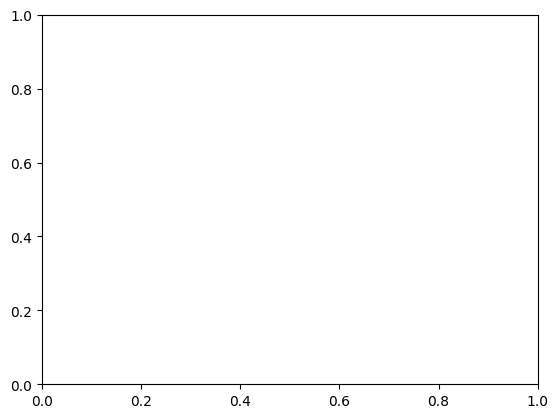

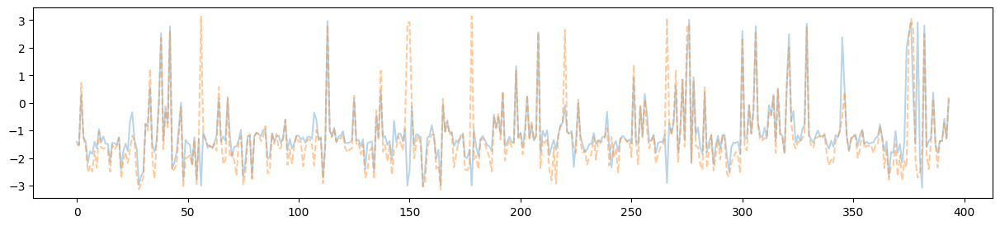

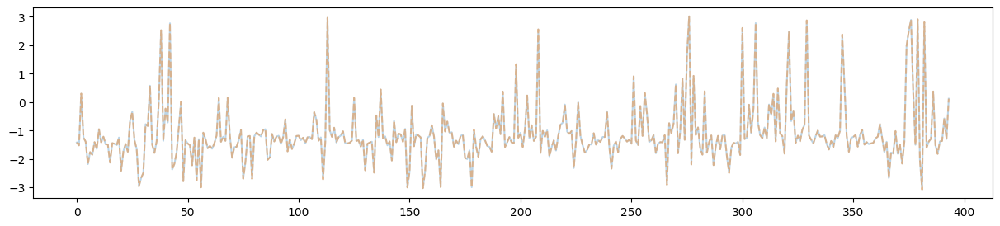

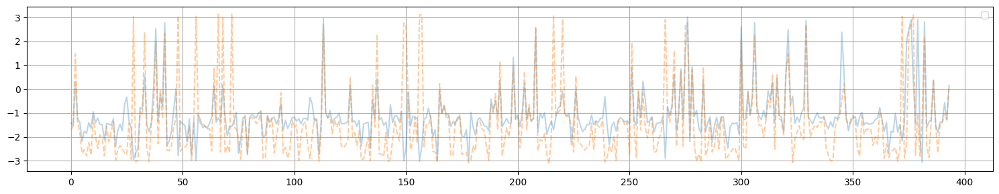

In [ ]:

###get inputs into lstm 
beh_map = [z_norm.min(), z_norm.min()/2 + z_norm.max()/2, z_norm.max()]

from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import balanced_accuracy_score
from sklearn.linear_model import Lasso
from sklearn.metrics import r2_score
import matplotlib.pyplot as plt
import numpy as np
import copy
import pickle
import matplotlib.cm as cm

import warnings
    



from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import balanced_accuracy_score
from sklearn.linear_model import Lasso
from sklearn.metrics import r2_score
import matplotlib.pyplot as plt
import numpy as np
import copy
import pickle
import matplotlib.cm as cm
n_tracks = resampled_rev.shape[0]
n_splits = 10
results_dict = {}  # Store mean/std r² per i and n_timesteps
best_models = {}   # Store best model per (i, n_timesteps)
T = 5
idxs = [[0],[1],[2],[3],[4],[5]]
fig, ax = plt.subplots()
for i, (resampled_onset, exp_onset) in enumerate(zip(resampled_onsets, exp_onsets)):
    score_means = []
    score_stds = []
    # all_r2_means = []
    all_scores_per_i = {}
    n_timesteps_list = []
    

    # for n_timesteps in range(5, 10, 2):
    for n_timesteps in range(1, 15, 3):
        print(f"\nProcessing i={i}, n_timesteps={n_timesteps}")
        # feature_names = np.array([[f"vel_t-{n_timesteps - t - 1}", f"accel_t-{n_timesteps - t - 1}",
        #                            f"curv_t-{n_timesteps - t - 1}", f"beh_t-{n_timesteps - t - 1}"]
        #                           for t in range(n_timesteps)]).flatten()

        # X_stim = prep_FB_inputs(resampled_vel, resampled_acc, resampled_curve, resampled_rev,
        #                         resampled_turn, T=n_timesteps)  # shape (n_tracks, n_frames, n_features)
        # X_stim_all, feature_names = prep_FB_inputs_features(resampled_vel, resampled_acc, resampled_curve, resampled_rev, resampled_turn,   T = T
        #         #    times, beh_map, 
        #         #    lag=16, inclusion_thresh =3, 
        #         #    remove_revs=False, 
                  
                  
                  
        #            )
        X_stim_features, feature_names = prep_FB_inputs_features_only(resampled_vel, resampled_acc, resampled_curve, resampled_rev, resampled_turn,resampled_onset,  n_timesteps  = n_timesteps)#shape (n_tracks, n_frames, n_features)
        X_donut_stim, donut_names = prep_FB_inputs_donut_only( inferred_phases_all, inferred_rad_all, resampled_onset, n_tracks)
        # X_donut_stim = np.concatenate([inferred_phases[i][:, None], inferred_rad[i][:, None]], axis =1)

        X_stim_all =  np.concatenate([X_stim_features ,  X_donut_stim], axis = 1)
        feature_names_all = np.array(feature_names.tolist()+donut_names)
        print(inferred_phases[idxs[i]])
        fig, ax = plt.subplots(figsize = (15,3))
        ax.plot(inferred_phases[idxs[i]].flatten(), alpha = 0.3)
        ax.plot(X_donut_stim[:,0], linestyle='dashed', alpha = 0.4)
        
        
        
        
        X_donut_stim, donut_names = prep_FB_inputs_donut_only( inferred_phases_all, inferred_rad_all, resampled_onset-1, n_tracks) ##is there an off by one error??
        # X_donut_stim = np.concatenate([inferred_phases[idxs[i]], inferred_rad[idxs[i]]])

        X_stim_all =  np.concatenate([X_stim_features ,  X_donut_stim], axis = 1)
        feature_names_all = np.array(feature_names.tolist()+donut_names)
        print(inferred_phases[idxs[i]])
        fig, ax = plt.subplots(figsize = (15,3))
        ax.plot(inferred_phases[idxs[i]].flatten(), alpha = 0.3)
        ax.plot(X_donut_stim[:,0], linestyle='dashed', alpha = 0.4)
        
        X_donut_stim, donut_names = prep_FB_inputs_donut_only( inferred_phases_all, inferred_rad_all, resampled_onset+1, n_tracks)
        # X_donut_stim = np.concatenate([inferred_phases[idxs[i]], inferred_rad[idxs[i]]])

        X_stim_all =  np.concatenate([X_stim_features ,  X_donut_stim], axis = 1)
        feature_names_all = np.array(feature_names.tolist()+donut_names)
        print(inferred_phases[idxs[i]])
        fig, ax = plt.subplots(figsize = (15,3))
        ax.plot(inferred_phases[idxs[i]].flatten(), alpha = 0.3)
        ax.plot(X_donut_stim[:,0], linestyle='dashed', alpha = 0.4)
        
        
        break
    break

ax.legend()
plt.grid(True)
plt.tight_layout()
# plt.savefig(f"r2_plot_i{i}.png")
# plt.close()


In [ ]:
with warnings.catch_warnings():
        
    # ##get inputs into lstm 
    # beh_map = [z_norm.min(), z_norm.min()/2 + z_norm.max()/2, z_norm.max()]

    warnings.simplefilter("ignore")
    include_beh = False
    n_tracks = resampled_rev.shape[0]
    n_splits = 10
    results_dict = {}  # Store mean/std r² per i and n_timesteps
    best_models = {}   # Store best model per (i, n_timesteps)
    lstm_lag = 5
    idxs = [[0],[1],[2],[3],[4],[5]]
    fig, ax = plt.subplots()
    for i, (resampled_onset, exp_onset) in enumerate(zip(resampled_onsets, exp_onsets)):
        score_means = []
        score_stds = []
        # all_r2_means = []
        all_scores_per_i = {}
        n_timesteps_list = []
        onset = resampled_onset-1

        for n_timesteps in range(1, 15, 3):
        # for n_timesteps in range(1, 15, 1):
            print(f"\nProcessing i={i}, n_timesteps={n_timesteps}")

            # X_stim_all, feature_names_all = prep_FB_inputs_features_only(resampled_vel, resampled_acc, resampled_curve, resampled_rev, resampled_turn, onset, n_timesteps,   lstm_lag = lstm_lag)#shape (n_tracks, n_frames, n_features)
            X_stim_all, feature_names_all = prep_FB_inputs_features_only(resampled_vel, resampled_acc, resampled_curve, resampled_rev, resampled_turn, onset, n_timesteps,   lstm_lag = lstm_lag, include_beh = include_beh)#shape (n_tracks, n_frames, n_features)

            
            Y_latency = latency_to_reversal(rev_bin, exp_onset, max_latency = 6*durations[i]+1)/6 # nan where not 
            no_rev_at_onset = Y_latency!=0
            Y_prob = np.logical_not(np.isnan(Y_latency[no_rev_at_onset]))# classfy y/n did rev happen
            X_prob = copy.deepcopy(X_stim_all[no_rev_at_onset])
            
            ###    
            # X_train, X_test, y_train, y_test = train_test_split(X_prob, Y_prob, test_size=test_size, random_state=random_state)
            balanced_accuracy_scores = []
            models = []

            for split_idx in range(n_splits):
                # X_train, X_test, y_train, y_test = train_test_split(
                #     X_stim_all_latency, Y_latency_valid, test_size=test_size, random_state=split_idx)
                
                X_train, X_test, y_train, y_test = train_test_split(X_prob, Y_prob, test_size=test_size, random_state=split_idx)
                
                param_grid = {
                    'C': [0.001, 0.01, 0.1, 1, 10, 100]
                }

                model = LinearSVC(penalty='l1', dual=False, max_iter=10000)
                # Grid search
                grid = GridSearchCV(model, param_grid, cv=5, scoring='balanced_accuracy')
                grid.fit(X_train, y_train)
                c = grid.best_params_['C']
                best_model = grid.best_estimator_
                
                y_pred = best_model.predict(X_test)
                score =balanced_accuracy_score(y_test, y_pred)  

                balanced_accuracy_scores.append(score)
                # models.append(best_model)
                models.append((best_model,X_train, X_test, y_train, y_test, c))

            accuracy_mean = np.mean(balanced_accuracy_scores)
            accuracy_std = np.std(balanced_accuracy_scores)
            best_model_idx = np.argmax(balanced_accuracy_scores)
            best_model_overall = models[best_model_idx]

            # Save results
            n_timesteps_list.append(n_timesteps)
            # all_r2_means.append(r2s)
            all_scores_per_i[(i, n_timesteps)] = balanced_accuracy_scores
            score_means.append(accuracy_mean)
            score_stds.append(accuracy_std)
            results_dict[(i, n_timesteps)] = (accuracy_mean, accuracy_std)
            best_models[(i, n_timesteps)] = best_model_overall


        # cmap1 = cm.get_cmap('tab10', len(resampled_onsets))
        ax.errorbar(n_timesteps_list, score_means, yerr=score_stds, #color=cmap1(i),
                    fmt='-o', capsize=5, label = f"stim {i}")

        ax.set_title(f"{neuron}; features only; Reversal prediction;\n Mean ± STD balanced accuracy")
        ax.set_xlabel("max time delay (frames)")
        ax.set_ylabel("balanced accuracy")
    ax.legend()
    plt.grid(True)
    plt.tight_layout()
    # plt.savefig(f"r2_plot_i{i}.png")
    # plt.close()

n_timesteps = 10
include_beh = False
if include_beh: 
    feature_names = np.array([[f"vel_t-{n_timesteps - t - 1}", f"accel_t-{n_timesteps - t - 1}",
                                f"curv_t-{n_timesteps - t - 1}", f"beh_t-{n_timesteps - t - 1}"]
                                for t in range(n_timesteps)]).flatten()
else: 
    feature_names = np.array([[f"vel_t-{n_timesteps - t - 1}", f"accel_t-{n_timesteps - t - 1}",
                            f"curv_t-{n_timesteps - t - 1}"]
                            for t in range(n_timesteps)]).flatten()
for i in range(len(resampled_onsets)):
    model,X_train, X_test, y_train, y_test, c  = best_models[(i, n_timesteps)] 

    model_label= f"{neuron} stim: {i}; linear SVC; Features only "#; lasso_a{np.round(alpha,2)}"
    visualize_model_classification(model, model_label, feature_names, X_train, X_test, y_train, y_test, n_timesteps,  feature_names_ordered = False, coeffs = model.coef_[0])#, xlim = [-1,1])
    
plt.show()

    




Processing i=0, n_timesteps=1

Processing i=0, n_timesteps=4

Processing i=0, n_timesteps=7

Processing i=0, n_timesteps=10

Processing i=0, n_timesteps=13

Processing i=1, n_timesteps=1

Processing i=1, n_timesteps=4

Processing i=1, n_timesteps=7

Processing i=1, n_timesteps=10

Processing i=1, n_timesteps=13

Processing i=2, n_timesteps=1

Processing i=2, n_timesteps=4

Processing i=2, n_timesteps=7

Processing i=2, n_timesteps=10

Processing i=2, n_timesteps=13

Processing i=3, n_timesteps=1

Processing i=3, n_timesteps=4

Processing i=3, n_timesteps=7

Processing i=3, n_timesteps=10

Processing i=3, n_timesteps=13

Processing i=4, n_timesteps=1

Processing i=4, n_timesteps=4

Processing i=4, n_timesteps=7

Processing i=4, n_timesteps=10

Processing i=4, n_timesteps=13

Processing i=5, n_timesteps=1

Processing i=5, n_timesteps=4

Processing i=5, n_timesteps=7

Processing i=5, n_timesteps=10

Processing i=5, n_timesteps=13
RIM stim: 0; linear SVC; Features only Accuracy: 0.9824561

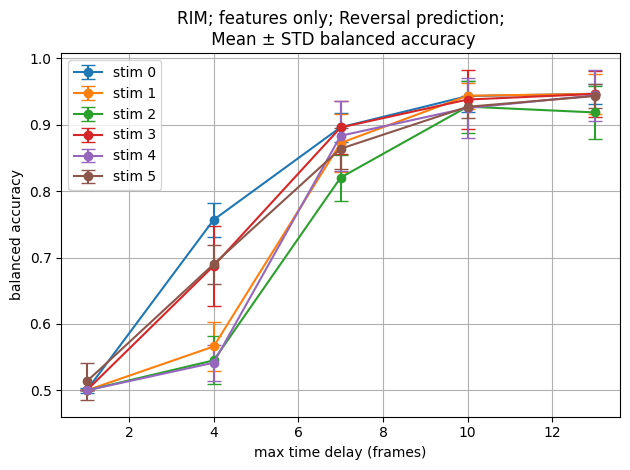

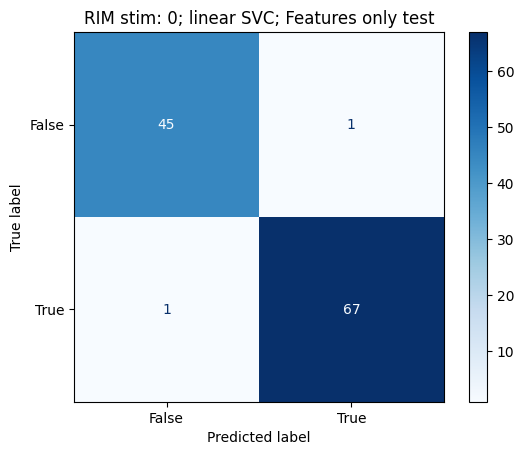

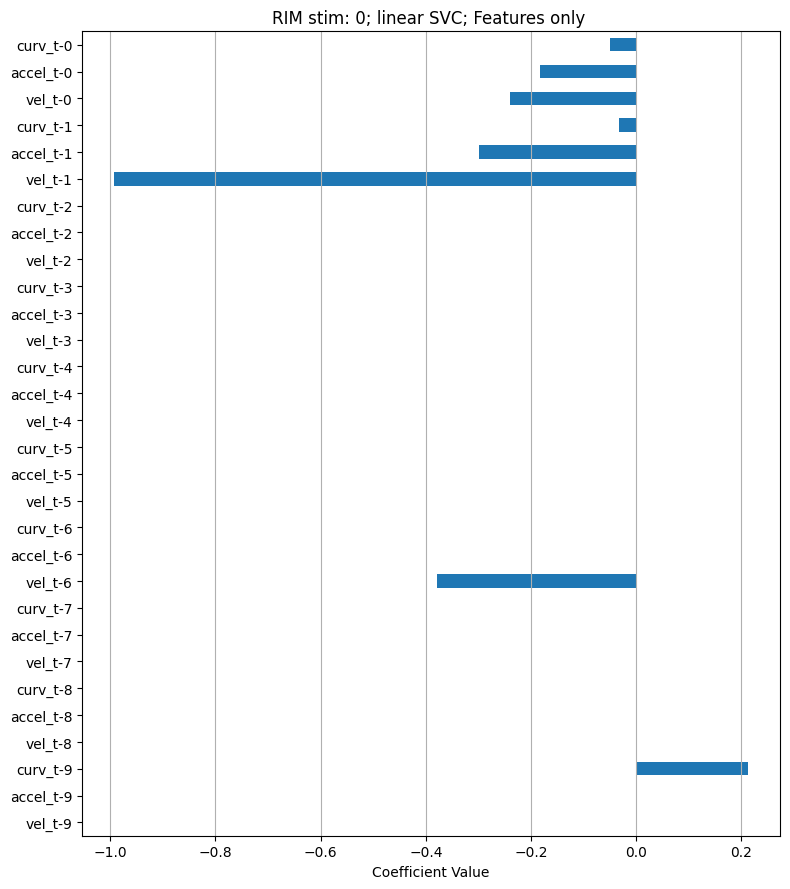

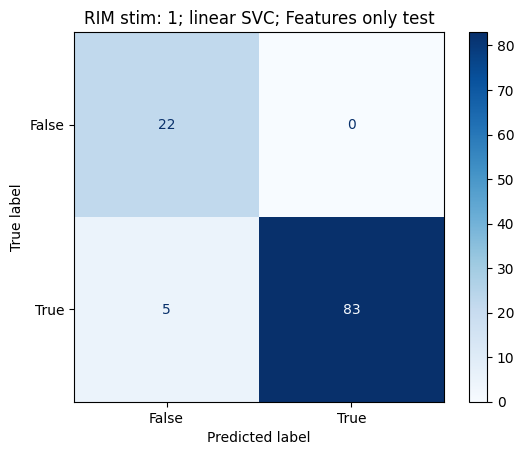

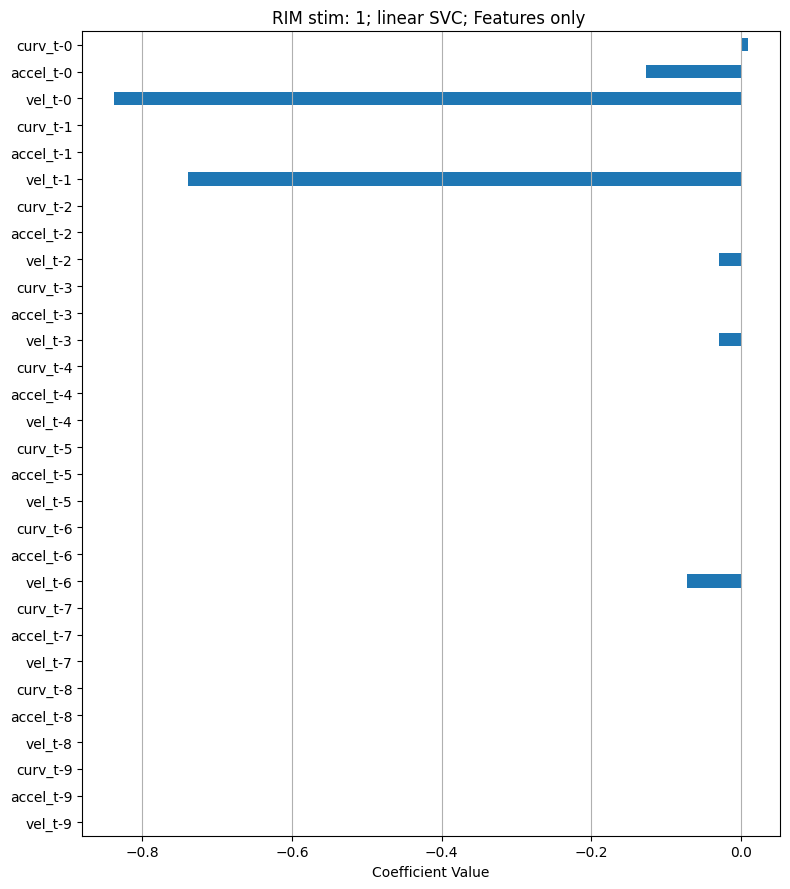

...

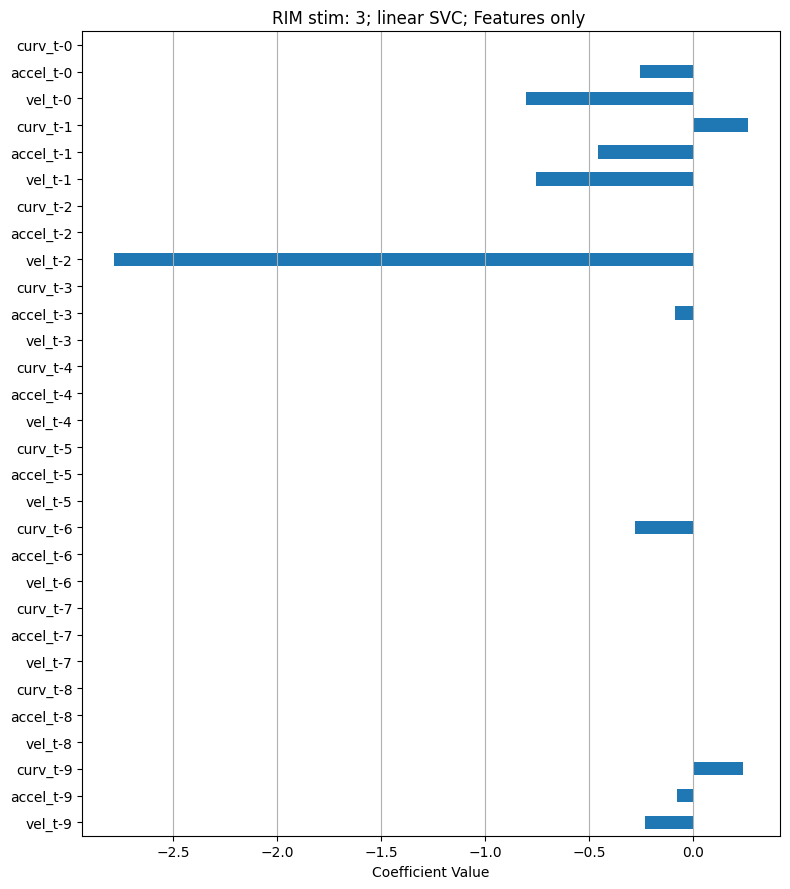

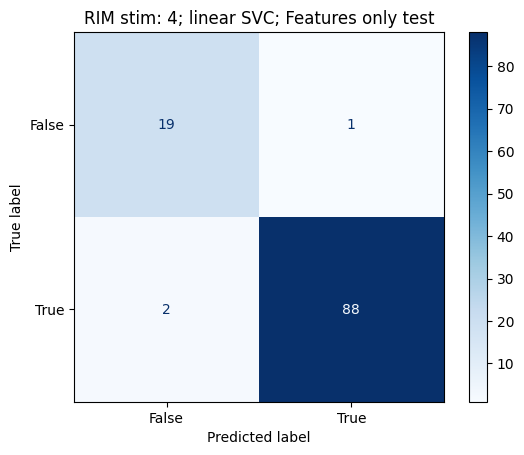

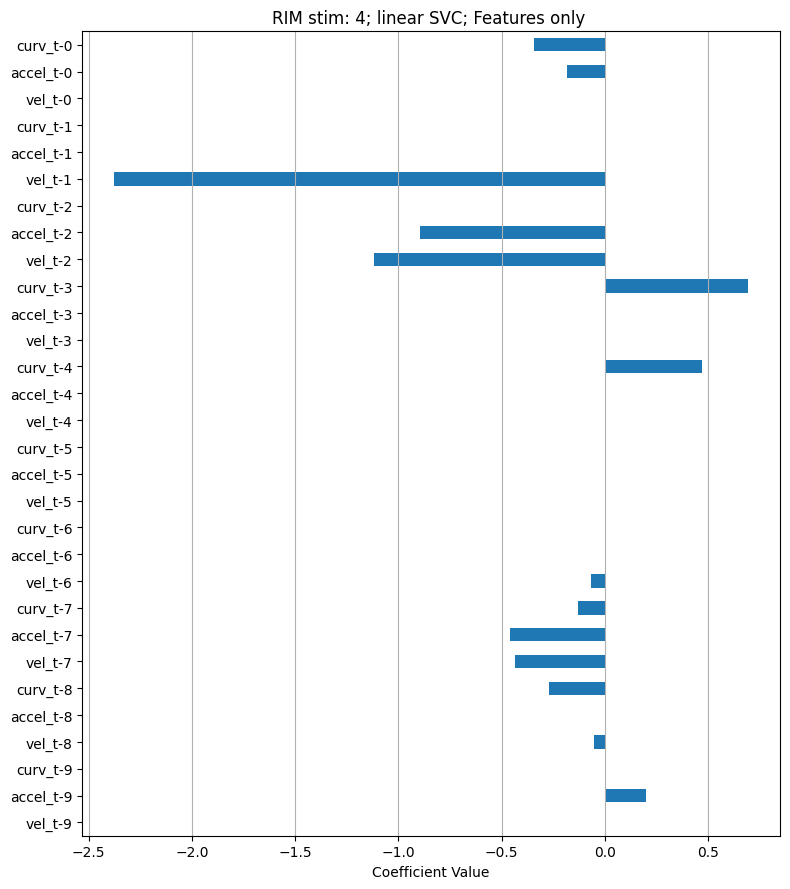

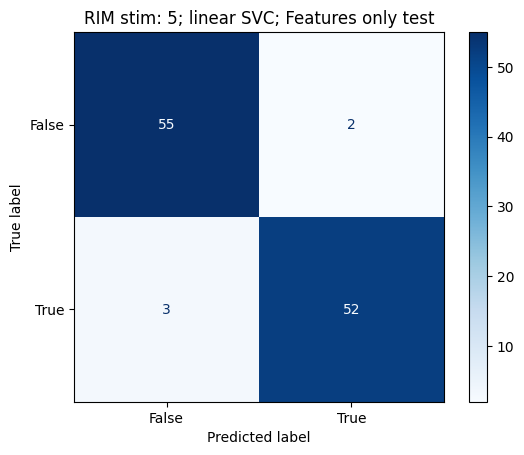

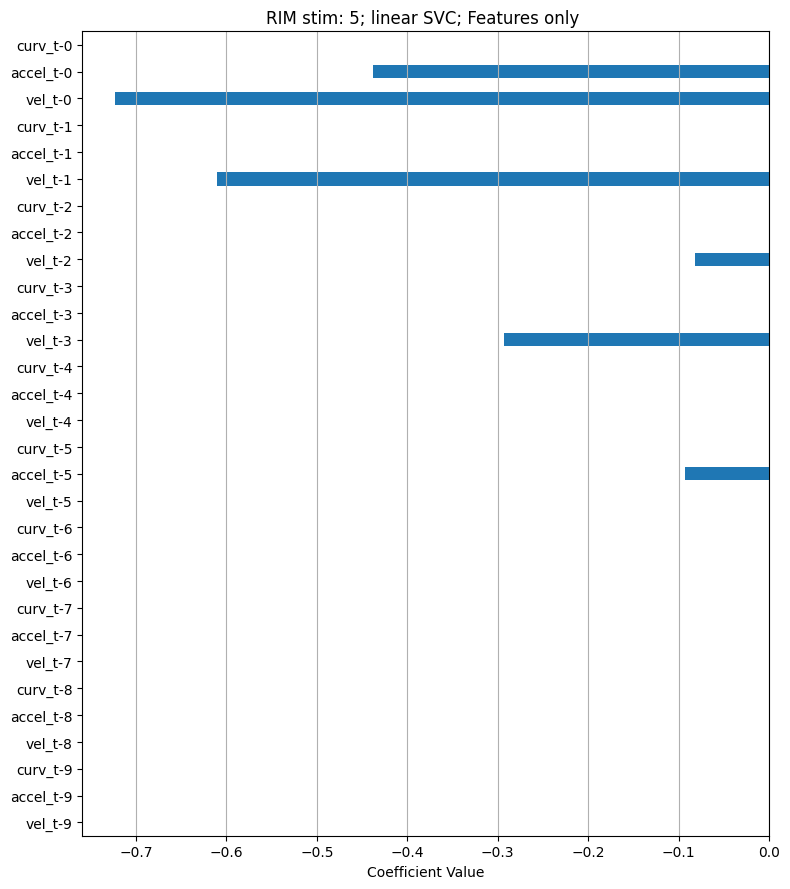

In [ ]:


with warnings.catch_warnings():
        
    # ##get inputs into lstm 
    # beh_map = [z_norm.min(), z_norm.min()/2 + z_norm.max()/2, z_norm.max()]

    warnings.simplefilter("ignore")
    include_beh = False
    n_tracks = resampled_rev.shape[0]
    n_splits = 10
    results_dict = {}  # Store mean/std r² per i and n_timesteps
    best_models = {}   # Store best model per (i, n_timesteps)
    lstm_lag = 5
    idxs = [[0],[1],[2],[3],[4],[5]]
    fig, ax = plt.subplots()
    fps = 1.6
    for i, (resampled_onset, exp_onset) in enumerate(zip(resampled_onsets, exp_onsets)):
        score_means = []
        score_stds = []
        # all_r2_means = []
        all_scores_per_i = {}
        n_timesteps_list = []
        onset = resampled_onset-1

        for n_timesteps in range(1, 15, 3):
        # for n_timesteps in range(1, 15, 1):
            print(f"\nProcessing i={i}, n_timesteps={n_timesteps}")

            X_stim_all, feature_names_all = prep_FB_inputs_features_only(resampled_vel, resampled_acc, resampled_curve, resampled_rev, resampled_turn, onset, n_timesteps,   lstm_lag = lstm_lag, include_beh = include_beh)#shape (n_tracks, n_frames, n_features)

            
            Y_latency = latency_to_reversal(rev_bin, exp_onset, max_latency = 6*durations[i]+1)/6 # nan where not 
            no_rev_at_onset = Y_latency!=0
            Y_prob = np.logical_not(np.isnan(Y_latency[no_rev_at_onset]))# classfy y/n did rev happen
            X_prob = copy.deepcopy(X_stim_all[no_rev_at_onset])
            
            ###    
            # X_train, X_test, y_train, y_test = train_test_split(X_prob, Y_prob, test_size=test_size, random_state=random_state)
            balanced_accuracy_scores = []
            models = []

            for split_idx in range(n_splits):
                # X_train, X_test, y_train, y_test = train_test_split(
                #     X_stim_all_latency, Y_latency_valid, test_size=test_size, random_state=split_idx)
                
                X_train, X_test, y_train, y_test = train_test_split(X_prob, Y_prob, test_size=test_size, random_state=split_idx)
                
                param_grid = {
                    'C': [0.001, 0.01, 0.1, 1, 10, 100]
                }

                model = LinearSVC(penalty='l1', dual=False, max_iter=10000)
                # Grid search
                grid = GridSearchCV(model, param_grid, cv=5, scoring='balanced_accuracy')
                grid.fit(X_train, y_train)
                c = grid.best_params_['C']
                best_model = grid.best_estimator_
                
                y_pred = best_model.predict(X_test)
                score =balanced_accuracy_score(y_test, y_pred)  

                balanced_accuracy_scores.append(score)
                # models.append(best_model)
                models.append((best_model,X_train, X_test, y_train, y_test, c))

            accuracy_mean = np.mean(balanced_accuracy_scores)
            accuracy_std = np.std(balanced_accuracy_scores)
            best_model_idx = np.argmax(balanced_accuracy_scores)
            best_model_overall = models[best_model_idx]

            # Save results
            n_timesteps_list.append(n_timesteps/fps)
            all_scores_per_i[(i, n_timesteps)] = balanced_accuracy_scores
            score_means.append(accuracy_mean)
            score_stds.append(accuracy_std)
            results_dict[(i, n_timesteps)] = (accuracy_mean, accuracy_std)
            best_models[(i, n_timesteps)] = best_model_overall


        # cmap1 = cm.get_cmap('tab10', len(resampled_onsets))
        ax.errorbar(n_timesteps_list, score_means, yerr=score_stds, #color=cmap1(i),
                    fmt='-o', capsize=5, label = f"stim {i}")
        

        ax.set_title(f"{neuron}; features only; Reversal prediction;\n Mean ± STD balanced accuracy")
        ax.set_xlabel("max time delay (frames) - 1.6fps")
        ax.set_ylabel("balanced accuracy")
    ax.legend()
    plt.grid(True)
    plt.tight_layout()
    # plt.savefig(f"r2_plot_i{i}.png")
    # plt.close()

# n_timesteps = 10
# include_beh = False
# if include_beh: 
#     feature_names = np.array([[f"vel_t-{n_timesteps - t - 1}", f"accel_t-{n_timesteps - t - 1}",
#                                 f"curv_t-{n_timesteps - t - 1}", f"beh_t-{n_timesteps - t - 1}"]
#                                 for t in range(n_timesteps)]).flatten()
# else: 
#     feature_names = np.array([[f"vel_t-{n_timesteps - t - 1}", f"accel_t-{n_timesteps - t - 1}",
#                             f"curv_t-{n_timesteps - t - 1}"]
#                             for t in range(n_timesteps)]).flatten()
# for i in range(len(resampled_onsets)):
#     model,X_train, X_test, y_train, y_test, c  = best_models[(i, n_timesteps)] 

#     model_label= f"{neuron} stim: {i}; linear SVC; Features only "#; lasso_a{np.round(alpha,2)}"
#     visualize_model_classification(model, model_label, feature_names, X_train, X_test, y_train, y_test, n_timesteps,  feature_names_ordered = False, coeffs = model.coef_[0])#, xlim = [-1,1])
    
# plt.show()
n_timesteps = 10
include_beh = False
feature_names = np.array([[f"vel_t-{(n_timesteps - t - 1)/fps}", f"accel_t-{(n_timesteps - t - 1)/fps}",
                        f"curv_t-{(n_timesteps - t - 1)/fps}"]
                        for t in range(n_timesteps)]).flatten()
for i in range(len(resampled_onsets)):
    model,X_train, X_test, y_train, y_test, c  = best_models[(i, n_timesteps)] 

    model_label= f"{neuron} stim: {i}; linear SVC; Features only "#; lasso_a{np.round(alpha,2)}"
    visualize_model_classification(model, model_label, feature_names, X_train, X_test, y_train, y_test, n_timesteps,  feature_names_ordered = False, coeffs = model.coef_[0])#, xlim = [-1,1])
    
plt.show()

    



In [24]:
from predict_latency_prob_from_features_donut import  prep_FB_inputs_features_only #replace_outliers_neg_post_seperate,
exp_shape = exp_acc.shape
exp_acc1 = replace_outliers_neg_post_seperate(exp_acc.flatten(), threshold = 5).reshape(exp_shape)
exp_curve1 = replace_outliers_neg_post_seperate(exp_curve.flatten()).reshape(exp_shape)
exp_vel1 = replace_outliers_neg_post_seperate(exp_vel.flatten(), threshold = 2).reshape(exp_shape)

exp_rev = exp_behaviors
exp_pause = pauses
exp_turn = turns
with warnings.catch_warnings():
        
    # ##get inputs into lstm 
    # beh_map = [z_norm.min(), z_norm.min()/2 + z_norm.max()/2, z_norm.max()]

    warnings.simplefilter("ignore")
    include_beh = False
    n_tracks = resampled_rev.shape[0]
    n_splits = 10
    results_dict = {}  # Store mean/std r² per i and n_timesteps
    best_models = {}   # Store best model per (i, n_timesteps)
    # exp_lstm_lag = 0
    idxs = [[0],[1],[2],[3],[4],[5]]
    fig, ax = plt.subplots()
    for i, (resampled_onset, exp_onset) in enumerate(zip(resampled_onsets, exp_onsets)):
        score_means = []
        score_stds = []
        # all_r2_means = []
        all_scores_per_i = {}
        n_timesteps_list = []
        onset = resampled_onset-1

        for n_timesteps in range(1, 15, 3):
        # for n_timesteps in range(1, 15, 1):
            print(f"\nProcessing i={i}, n_timesteps={n_timesteps}")

            # X_stim_all, feature_names_all = prep_FB_inputs_features_only(resampled_vel, resampled_acc, resampled_curve, resampled_rev, resampled_turn, onset, n_timesteps,   lstm_lag = lstm_lag)#shape (n_tracks, n_frames, n_features)
            X_stim_all, feature_names_all = prep_FB_inputs_features_only(exp_vel1, exp_acc1, exp_curve1, exp_rev, exp_turn, exp_onset, n_timesteps, z, 
                                                                         lstm_lag = 0, include_beh = include_beh)#shape (n_tracks, n_frames, n_features)

            
            Y_latency = latency_to_reversal(rev_bin, exp_onset, max_latency = 6*durations[i]+1)/6 # nan where not 
            no_rev_at_onset = Y_latency!=0
            Y_prob = np.logical_not(np.isnan(Y_latency[no_rev_at_onset]))# classfy y/n did rev happen
            X_prob = copy.deepcopy(X_stim_all[no_rev_at_onset])
            
            ###    
            # X_train, X_test, y_train, y_test = train_test_split(X_prob, Y_prob, test_size=test_size, random_state=random_state)
            balanced_accuracy_scores = []
            models = []

            for split_idx in range(n_splits):
                # X_train, X_test, y_train, y_test = train_test_split(
                #     X_stim_all_latency, Y_latency_valid, test_size=test_size, random_state=split_idx)
                
                X_train, X_test, y_train, y_test = train_test_split(X_prob, Y_prob, test_size=test_size, random_state=split_idx)
                
                param_grid = {
                    'C': [0.001, 0.01, 0.1, 1, 10, 100]
                }

                model = LinearSVC(penalty='l1', dual=False, max_iter=10000)
                # Grid search
                grid = GridSearchCV(model, param_grid, cv=5, scoring='balanced_accuracy')
                grid.fit(X_train, y_train)
                c = grid.best_params_['C']
                best_model = grid.best_estimator_
                
                y_pred = best_model.predict(X_test)
                score =balanced_accuracy_score(y_test, y_pred)  

                balanced_accuracy_scores.append(score)
                # models.append(best_model)
                models.append((best_model,X_train, X_test, y_train, y_test, c))

            accuracy_mean = np.mean(balanced_accuracy_scores)
            accuracy_std = np.std(balanced_accuracy_scores)
            best_model_idx = np.argmax(balanced_accuracy_scores)
            best_model_overall = models[best_model_idx]

            # Save results
            n_timesteps_list.append(n_timesteps)
            # all_r2_means.append(r2s)
            all_scores_per_i[(i, n_timesteps)] = balanced_accuracy_scores
            score_means.append(accuracy_mean)
            score_stds.append(accuracy_std)
            results_dict[(i, n_timesteps)] = (accuracy_mean, accuracy_std)
            best_models[(i, n_timesteps)] = best_model_overall


        # cmap1 = cm.get_cmap('tab10', len(resampled_onsets))
        ax.errorbar(n_timesteps_list, score_means, yerr=score_stds, #color=cmap1(i),
                    fmt='-o', capsize=5, label = f"stim {i}")

        ax.set_title(f"{neuron}; features only; Reversal prediction;\n Mean ± STD balanced accuracy")
        ax.set_xlabel("max time delay (frames - 6fps )")
        ax.set_ylabel("balanced accuracy")
    ax.legend()
    plt.grid(True)
    plt.tight_layout()
    # plt.savefig(f"r2_plot_i{i}.png")
    # plt.close()

# n_timesteps = 10
# include_beh = False
# if include_beh: 
#     feature_names = np.array([[f"vel_t-{n_timesteps - t - 1}", f"accel_t-{n_timesteps - t - 1}",
#                                 f"curv_t-{n_timesteps - t - 1}", f"beh_t-{n_timesteps - t - 1}"]
#                                 for t in range(n_timesteps)]).flatten()
# else: 
#     feature_names = np.array([[f"vel_t-{n_timesteps - t - 1}", f"accel_t-{n_timesteps - t - 1}",
#                             f"curv_t-{n_timesteps - t - 1}"]
#                             for t in range(n_timesteps)]).flatten()
# for i in range(len(resampled_onsets)):
#     model,X_train, X_test, y_train, y_test, c  = best_models[(i, n_timesteps)] 

#     model_label= f"{neuron} stim: {i}; linear SVC; Features only "#; lasso_a{np.round(alpha,2)}"
#     visualize_model_classification(model, model_label, feature_names, X_train, X_test, y_train, y_test, n_timesteps,  feature_names_ordered = False, coeffs = model.coef_[0])#, xlim = [-1,1])
    
# plt.show()
n_timesteps = 10
include_beh = False

feature_names = np.array([[f"vel_t-{(n_timesteps - t - 1)/fps}", f"accel_t-{(n_timesteps - t - 1)/fps}",
                        f"curv_t-{(n_timesteps - t - 1)/fps}"]
                        for t in range(n_timesteps)]).flatten()
for i in range(len(resampled_onsets)):
    model,X_train, X_test, y_train, y_test, c  = best_models[(i, n_timesteps)] 

    model_label= f"{neuron} stim: {i}; linear SVC; Features only "#; lasso_a{np.round(alpha,2)}"
    visualize_model_classification(model, model_label, feature_names, X_train, X_test, y_train, y_test, n_timesteps,  feature_names_ordered = False, coeffs = model.coef_[0])#, xlim = [-1,1])
    
plt.show()

    

NameError: name 'exp_acc' is not defined


Processing i=5, n_timesteps=2

Processing i=5, n_timesteps=6

Processing i=5, n_timesteps=10

Processing i=5, n_timesteps=14


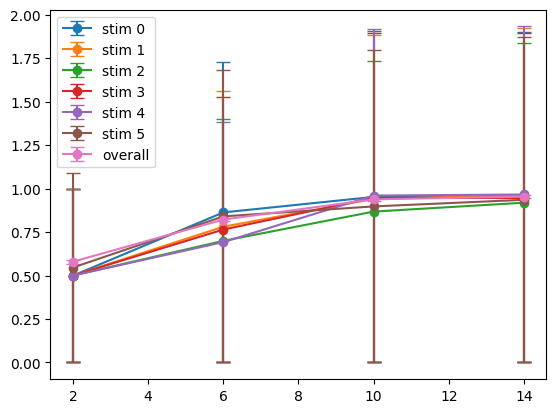

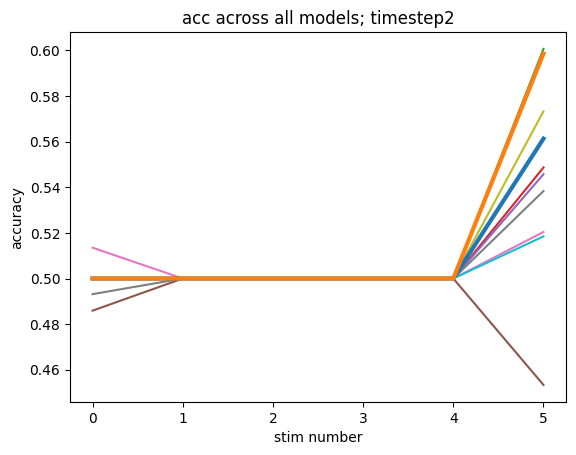

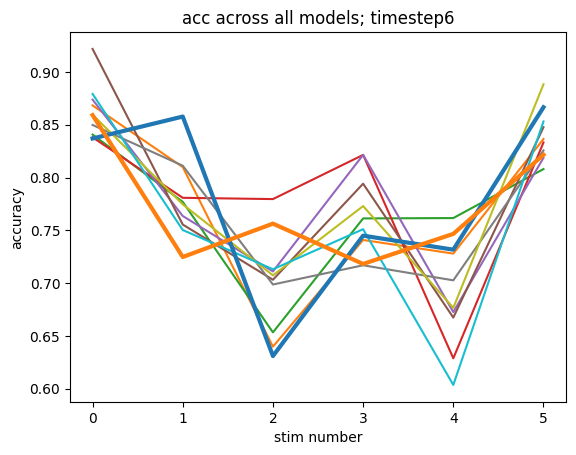

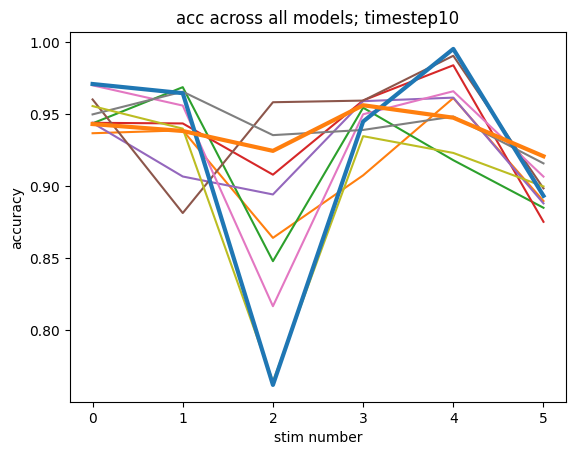

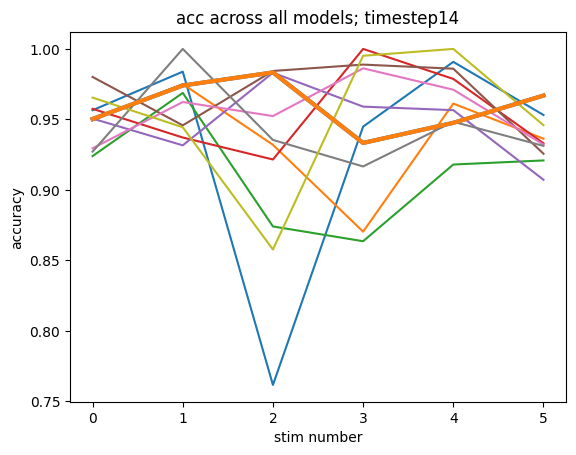

In [ ]:

import warnings
from sklearn import metrics
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    n_tracks = resampled_rev.shape[0]
    test_size = 0.3
    n_splits = 10
    results_dict = {}  # Store mean/std r² per i and n_timesteps
    best_models = {}   # Store best model per (i, n_timesteps)
    lstm_lag = 5
    idxs = [[0],[1],[2],[3],[4],[5]]


    results_dict_score_overall = {}
    best_models_score_overall ={}
    results_dict_auc_overall ={}
    best_models_auc_overall = {}
    
    results_dict_score_stim ={}
    best_models_score_stim = {}
    best_models_auc_stim = {}
    
    results_dict_auc_stim={}
    
    t_to_all_data = {}
    t_to_all_models = {}
    t_to_all_stim_scores ={}
    t_to_overall_aucs = {}
    t_to_best_model_using_min_idx_score ={}
    
    n_timesteps_list = []
    t_to_best_model_idx_auc = {}
    t_to_best_model_idx_score = {}
    for n_timesteps in range(2, 15, 4):#range(1, 15, 4):
        print(f"\nProcessing i={i}, n_timesteps={n_timesteps}")

        all_data = []
        n_stim = len(resampled_onsets)
        stim_i_to_score_means = {i:[] for i in range(n_stim)}
        stim_i_to_score_stds = {i:[] for i in range(n_stim)}
        
        stim_i_to_Xs = {}
        stim_i_to_Ys = {}
        
        ##########prep data 
        for i, (resampled_onset, exp_onset) in enumerate(zip(resampled_onsets, exp_onsets)):
            onset = resampled_onset-1
            X_stim_all, feature_names = prep_FB_inputs_features_only(resampled_vel, resampled_acc, resampled_curve, resampled_rev, resampled_turn, onset, n_timesteps, z,  lstm_lag = lstm_lag, include_beh = False)#shape (n_tracks, n_frames, n_features)
            Y_latency = latency_to_reversal(rev_bin, exp_onset, max_latency = 6*durations[i]+1)/6 # nan where not 
            no_rev_at_onset = Y_latency!=0
            Y_prob = np.logical_not(np.isnan(Y_latency[no_rev_at_onset]))# classfy y/n did rev happen
            X_prob = copy.deepcopy(X_stim_all[no_rev_at_onset])
            stim_i_to_Xs[i] = X_prob
            stim_i_to_Ys[i] = Y_prob
       
        all_stim_X_stim_features, all_stim_Y, feature_names_all = combine_FB_features_across_stim(stim_i_to_Xs, stim_i_to_Ys,  feature_names)
            
            
        ###    
        # X_train, X_test, y_train, y_test = train_test_split(all_stim_X_stim_features, all_stim_Y,  test_size=test_size, random_state=random_state)
        overall_scores = []
        overall_aucs = []
        all_stim_aucs = []
        all_stim_scores =[]# np.zeros((n_splits,n_stim))
        
        best_model_idx = []
        models = [] # n_splits
        ######split data and fit model on split 
        for split_idx in range(n_splits):
            X_train, X_test, y_train, y_test = train_test_split(all_stim_X_stim_features, all_stim_Y,  test_size=test_size, random_state=split_idx)
            all_data.append((X_train, X_test, y_train, y_test))
            
            param_grid = {
                'C': [0.001, 0.01, 0.1, 1, 10, 100]
            }

            model = LinearSVC(penalty='l1', dual=False, max_iter=10000)
            # Grid search
            grid = GridSearchCV(model, param_grid, cv=5, scoring='balanced_accuracy')
            grid.fit(X_train, y_train)
            c = grid.best_params_['C']
            best_model = grid.best_estimator_

            #get stim_i for each row in test data
            stim_bin_test = X_test[:, -1*n_stim:]
            stim_i_test = np.argmax(stim_bin_test, axis = 1)
            # print(np.all(np.sum(stim_bin_test, axis = 1)==1))
            stim_scores = [] #model specfic for each stim 
            stim_aucs = []
            for j in range(n_stim):
                
                X_test_stim = X_test[stim_i_test == j, :]
                y_test_stim = y_test[stim_i_test == j]
                
                y_pred = best_model.predict(X_test_stim)
                
                
                fpr, tpr, thresholds = metrics.roc_curve(y_test_stim, y_pred, pos_label=2)
                stim_auc = metrics.auc(fpr, tpr)
                stim_score = balanced_accuracy_score(y_test_stim, y_pred)  
                stim_scores.append(stim_score)
                stim_aucs.append(stim_auc)
            all_stim_scores.append(stim_scores)
            all_stim_aucs.append(stim_aucs)
            
            y_pred = best_model.predict(X_test)
             
            
            fpr, tpr, thresholds = metrics.roc_curve(y_test, y_pred, pos_label=2)
            overall_auc = metrics.auc(fpr, tpr)
            overall_score = balanced_accuracy_score(y_test, y_pred) 
            
            overall_scores.append(overall_score)
            overall_aucs.append(overall_auc)
            models.append((best_model, c))
            
            
            # overall_balanced_accuracy_scores.append(tuple(all_scores))
            # overall_aucs.append(tuple(all_aucs))
            # balanced_accuracy_scores.append(all_scores)
            # aucs.append(all_aucs)
            
                
        all_stim_scores = np.array(all_stim_scores)#n_splits,n_stim
        all_stim_aucs = np.array(all_stim_aucs)
        
        
        ###overall scores
        accuracy_mean_overall = np.mean(overall_scores)
        accuracy_std_overall= np.std(overall_scores)
        
        best_model_idx_score_overall = np.argmax(overall_scores)
        # np.argmin(overall_scores)
        best_model_score_overall, _ = models[best_model_idx_score_overall]
        t_to_best_model_idx_score[n_timesteps] = best_model_idx_score_overall
        
        results_dict_score_overall[n_timesteps] = (accuracy_mean_overall, accuracy_std_overall)
        best_models_score_overall[ n_timesteps] = best_model_score_overall

        
        ###overall aucs 
        auc_mean_overall = np.mean(overall_aucs)
        auc_std_overall = np.std(overall_aucs)
        
        best_model_idx_auc_overall = np.argmax(overall_aucs)
        best_model_auc_overall, _ = models[best_model_idx_auc_overall]
        t_to_best_model_idx_auc[n_timesteps] = best_model_idx_auc_overall
        
        results_dict_auc_overall[n_timesteps] = (accuracy_mean_overall, accuracy_std_overall)
        best_models_auc_overall[ n_timesteps] = best_model_score_overall
        t_to_all_models[ n_timesteps] = models

        #####stim scores
        accuracy_mean_stim_specific = np.mean(all_stim_scores, axis =0)
        accuracy_std_stim_specific = np.std(all_stim_scores, axis =0)

        
        best_model_idx_score_stim_min = np.argmax(np.min(all_stim_scores, axis = 1)) # has lowest min on all stim 
        best_model_score_stim_min, _ = models[best_model_idx_score_stim_min]
        t_to_best_model_using_min_idx_score[n_timesteps] = best_model_idx_score_stim_min
        

        results_dict_score_stim[n_timesteps] = (accuracy_mean_stim_specific, accuracy_std_stim_specific)
        best_models_score_stim[ n_timesteps] = best_model_score_stim_min
        
        #####stim aucs
        auc_mean_stim_specific = np.mean(all_stim_aucs, axis = 0)
        auc_std_stim_specific = np.std(all_stim_aucs, axis = 0)
        
        
        best_model_idx_auc_stim_min = np.argmax(np.min(all_stim_aucs, axis = 1)) # has lowest min on all stim 
        best_model_auc_stim_min, _ = models[best_model_idx_auc_stim_min]
        
        
        t_to_all_stim_scores[n_timesteps] = all_stim_scores
        t_to_overall_aucs[n_timesteps] = all_stim_aucs
        
        results_dict_auc_stim[n_timesteps] = (auc_mean_stim_specific, auc_std_stim_specific)
        best_models_auc_stim[ n_timesteps] = best_model_auc_stim_min
        t_to_all_data[n_timesteps] = all_data
        

        n_timesteps_list.append(n_timesteps)

    ####plot overall meand sand std overall and for each stim  
    fig, ax = plt.subplots()
    accuracy_mean_overall_over_t =[]
    accuracy_std_overall_over_t = []
    stim_acc_mean_over_t = []
    stim_acc_std_over_t = []
    for n_timesteps in n_timesteps_list:

        accuracy_mean_overall, accuracy_std_overall = results_dict_score_overall[n_timesteps]
        accuracy_mean_overall_over_t.append(accuracy_mean_overall)
        accuracy_std_overall_over_t.append(accuracy_std_overall)
        accuracy_mean_stim_specific, accuracy_std_stim_specific = results_dict_score_stim[n_timesteps]
        stim_acc_mean_over_t.append(accuracy_mean_stim_specific)
        stim_acc_std_over_t.append(accuracy_mean_stim_specific)
    stim_acc_mean_over_t = np.array(stim_acc_mean_over_t)
    stim_acc_std_over_t = np.array(stim_acc_std_over_t)
    for j in range(n_stim):
        ax.errorbar(n_timesteps_list, stim_acc_mean_over_t[:,j], yerr=stim_acc_std_over_t[:,j], fmt='-o', capsize=5, label = f"stim {j}")#color=cmap1(i),
        
    ax.errorbar(n_timesteps_list, accuracy_mean_overall_over_t, yerr=accuracy_std_overall_over_t, #color=cmap1(i),
    fmt='-o', capsize=5, label = f"overall")
    ax.legend()
        
    #  ####for best overall mdoel plto how it did overall and on each stim 
    # fig, ax = plt.subplots()
    
    # for j in range(n_stim):
    #     all_scores = []
    #     for n_timesteps in n_timesteps_list:
    #         all_data = t_to_all_data[n_timesteps]
            
    #         best_model_score_overall = best_models_score_overall[ n_timesteps]
       
    #         for X_train, X_test, y_train, y_test in all_data:
    #             stim_bin_test = X_test[:, -1*n_stim:]
    #             stim_i_test = np.argmax(stim_bin_test, axis = 1)
    #             X_test_stim = X_test[stim_i_test == j, :]
    #             y_test_stim = y_test[stim_i_test == j, :]

    #             y_pred = best_model_score_overall.predict(X_test)
    #             score = balanced_accuracy_score(y_test, y_pred) 
    #             all_scores.append(score)
    #     ax.plot(n_timesteps_list, all_scores, label = f"stim {j}")
    # ax.set_xlabel("timestep")
    # ax.set_ylabel("acc")

    # # all_scores = []
    # # for n_timesteps in n_timesteps_list:
    # #     X_train, X_test, y_train, y_test = t_to_all_data[n_timesteps]
            

    # #     best_model_score_overall = best_models_score_overall[ n_timesteps]
    # #     y_pred = best_model_score_overall.predict(X_test)
    # #     score = balanced_accuracy_score(y_test, y_pred) 
    # #     all_scores.append(score)
    # #     ax.plot(n_timesteps_list, all_scores, label = "overall")
    # ax.legend()
    
    ####plot best over stim how it does overall - score for each T overall 
    # fig, ax = plt.subplots()
    
    # for j in range(n_stim):
    #     all_scores = []
    #     for n_timesteps in n_timesteps_list:
    #         X_train, X_test, y_train, y_test = t_to_all_data[n_timesteps]
    #         best_model_score_overall = best_model_score_stim_min[ n_timesteps]
       
        
    #         X_test_stim = X_test[stim_i_test == j, :]
    #         y_test_stim = y_test[stim_i_test == j, :]
            
    #         y_pred = best_model_score_overall.predict(X_test)
    #         score = balanced_accuracy_score(y_test, y_pred) 
    #         all_scores.append(score)
    #     ax.plot(n_timesteps_list, all_scores, label = f"stim {j}")
    # all_scores = []
    # for n_timesteps in n_timesteps_list:
    #     X_train, X_test, y_train, y_test = t_to_all_data[n_timesteps]
            

    #     best_model_score_overall = best_model_score_stim_min[ n_timesteps]
    #     y_pred = best_model_score_overall.predict(X_test)
    #     score = balanced_accuracy_score(y_test, y_pred) 
    #     all_scores.append(score)
    #     ax.plot(n_timesteps_list, all_scores, label = "overall")
    # ax.legend()
    
    ####plot score overall score on each stim (each line a model)
    for n_timesteps in n_timesteps_list:
        all_stim_scores = t_to_all_stim_scores[n_timesteps]
        
        fig, ax = plt.subplots()
        for k in range(n_splits): 
            ax.plot(np.arange(n_stim), all_stim_scores[k])
        ax.set_title(f"acc across all models; timestep{n_timesteps}")
        ax.set_xlabel("stim number")
        ax.set_ylabel("accuracy")
        idx = t_to_best_model_idx_score[n_timesteps]
        ax.plot(np.arange(n_stim), all_stim_scores[idx], linewidth = 3, label = "best")
        
        idx = t_to_best_model_using_min_idx_score[n_timesteps]
        ax.plot(np.arange(n_stim), all_stim_scores[idx], linewidth = 3, label = "best using min")
        
        # fig, ax = plt.subplots()
        # all_stim_aucs = t_to_overall_aucs[n_timesteps] #check shape 
        # for k in range(n_splits): 
        #     ax.plot(np.arange(n_stim), all_stim_aucs[k])
        # ax.set_title(f"auc across all models; timestep{n_timesteps}")
        # ax.set_xlabel("stim number")
        # ax.set_ylabel("auc")

            
    

    


In [ ]:
print(feature_names_all.shape)
# print(X_train.shape)

(39,)


In [ ]:
# print(feature_names_all)
# n_timesteps = 10
# feature_names = np.array([[f"vel_t-{n_timesteps - t - 1}", f"accel_t-{n_timesteps - t - 1}",
#                             f"curv_t-{n_timesteps - t - 1}", f"beh_t-{n_timesteps - t - 1}"]
#                             for t in range(n_timesteps)]).flatten()
# for i in range(len(resampled_onsets)):
#     model,X_train, X_test, y_train, y_test, c  = best_models[(i, n_timesteps)] 
#     print(model.coef_[0].shape)
#     print(feature_names.shape)
#     model_label= f"{neuron} stim: {i}; linear SVC; Features only "#; lasso_a{np.round(alpha,2)}"
#     visualize_model_classification(model, model_label, feature_names, X_train, X_test, y_train, y_test, n_timesteps,  feature_names_ordered = True, coeffs = model.coef_[0])#, xlim = [-1,1])
    
# plt.show()





Processing i=0, n_timesteps=1
n_timesteps 459
n_timesteps 459

Processing i=0, n_timesteps=4
n_timesteps 459
n_timesteps 459

Processing i=0, n_timesteps=7
n_timesteps 459
n_timesteps 459

Processing i=0, n_timesteps=10
n_timesteps 459
n_timesteps 459

Processing i=0, n_timesteps=13
n_timesteps 459
n_timesteps 459

Processing i=1, n_timesteps=1
n_timesteps 459
n_timesteps 459

Processing i=1, n_timesteps=4
n_timesteps 459
n_timesteps 459

Processing i=1, n_timesteps=7
n_timesteps 459
n_timesteps 459

Processing i=1, n_timesteps=10
n_timesteps 459
n_timesteps 459

Processing i=1, n_timesteps=13
n_timesteps 459
n_timesteps 459

Processing i=2, n_timesteps=1
n_timesteps 459
n_timesteps 459

Processing i=2, n_timesteps=4
n_timesteps 459
n_timesteps 459

Processing i=2, n_timesteps=7
n_timesteps 459
n_timesteps 459

Processing i=2, n_timesteps=10
n_timesteps 459
n_timesteps 459

Processing i=2, n_timesteps=13
n_timesteps 459
n_timesteps 459

Processing i=3, n_timesteps=1
n_timesteps 459
n_

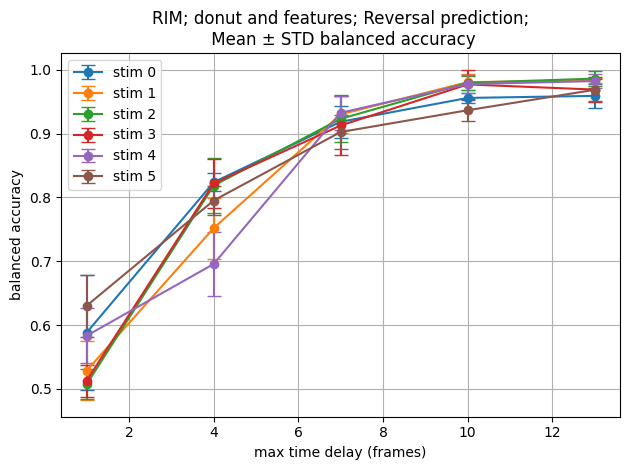

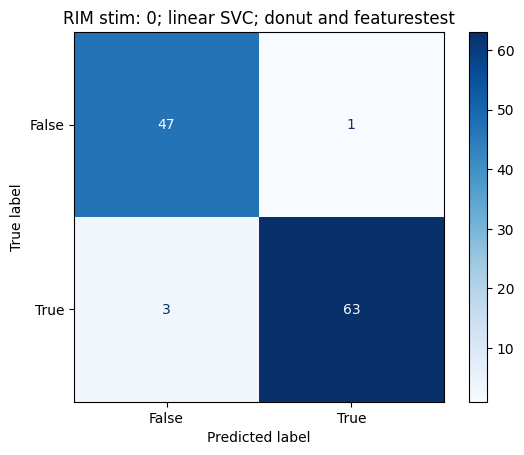

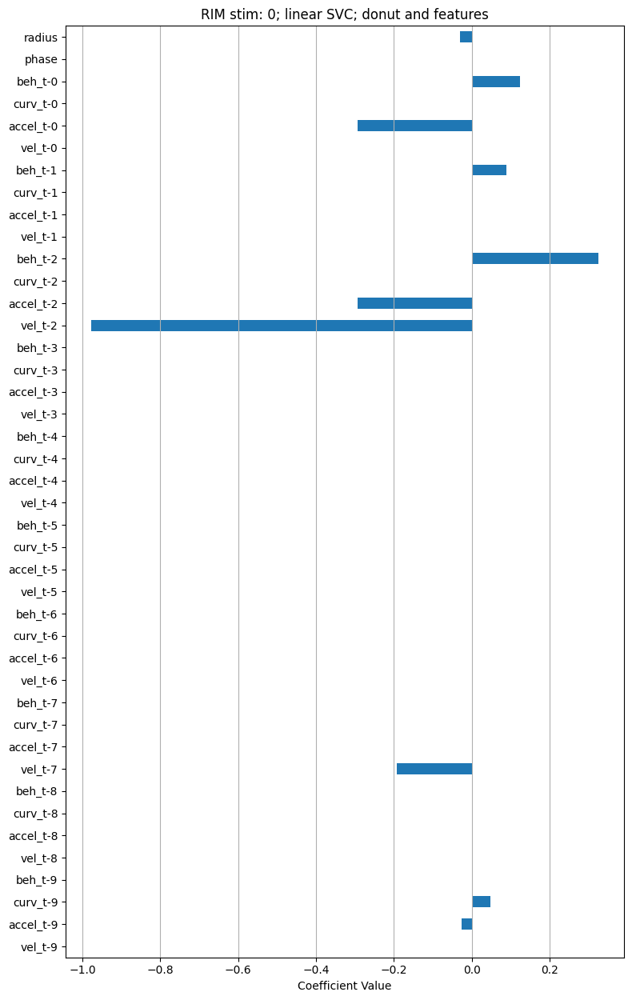

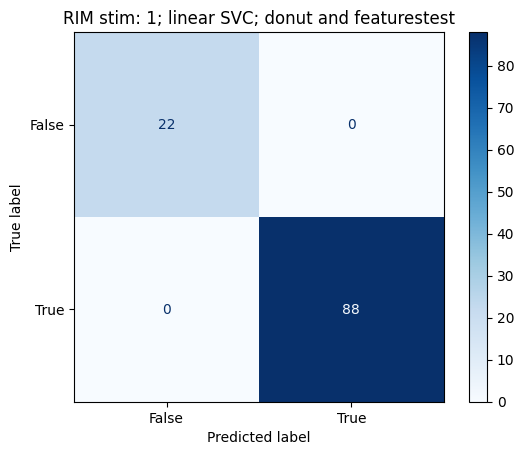

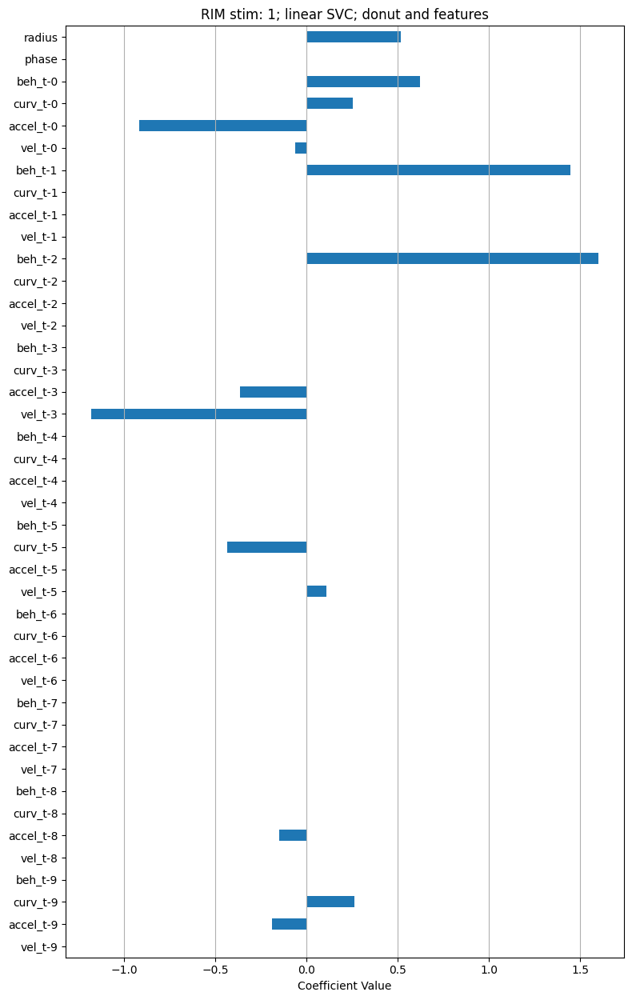

...

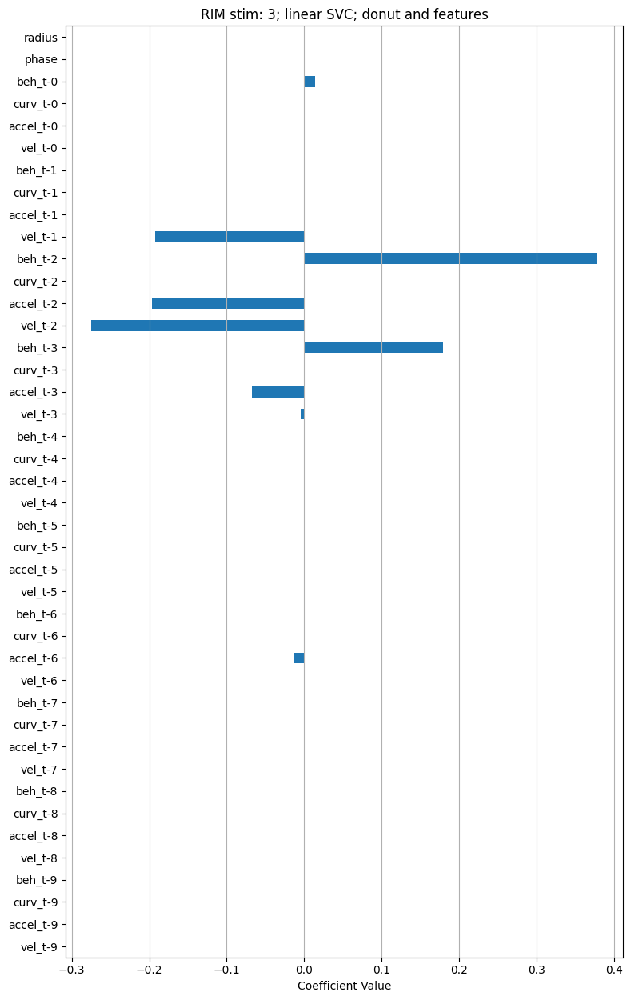

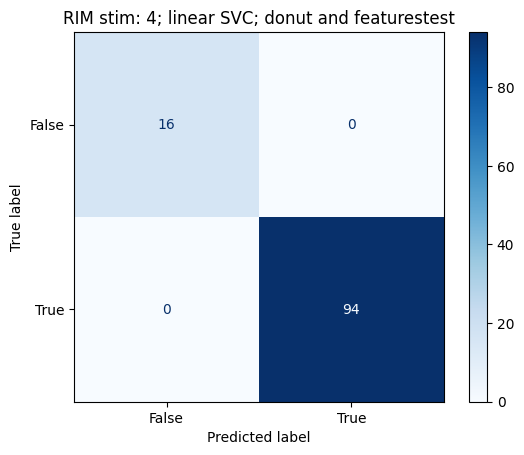

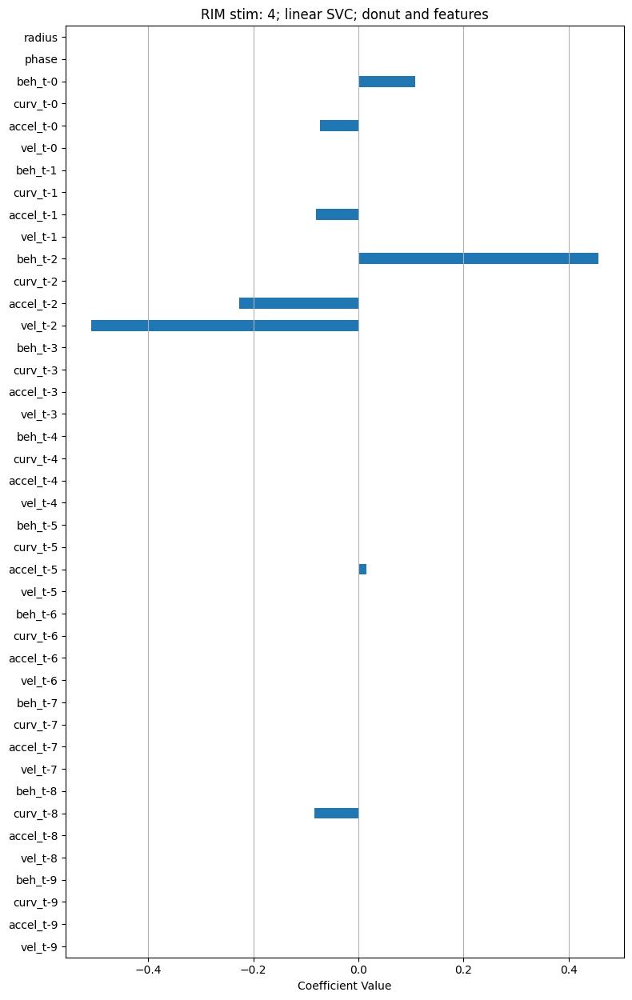

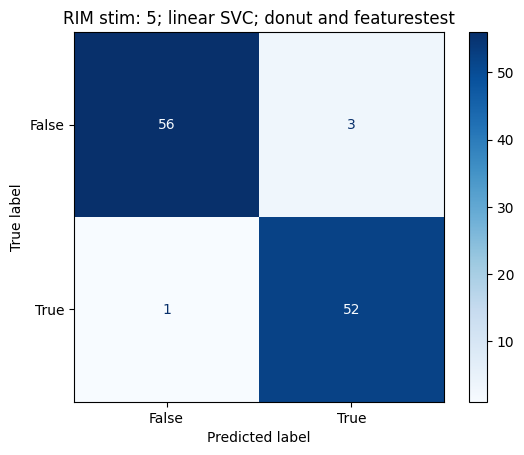

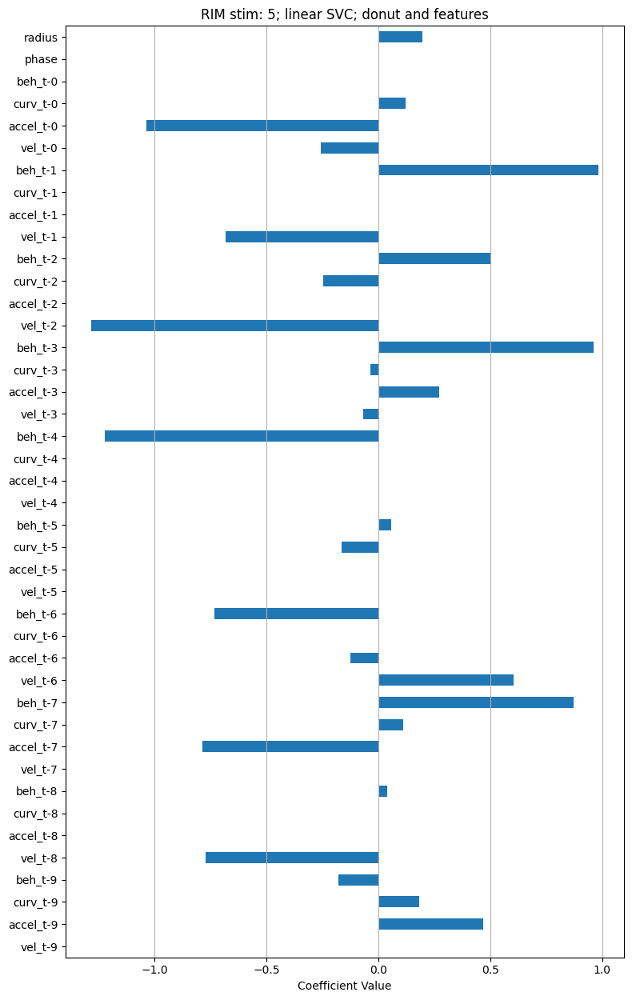

In [ ]:

from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import balanced_accuracy_score
from sklearn.linear_model import Lasso
from sklearn.metrics import r2_score
import matplotlib.pyplot as plt
import numpy as np
import copy
import pickle
import matplotlib.cm as cm

import warnings

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    n_tracks = resampled_rev.shape[0]
    n_splits = 10
    results_dict = {}  # Store mean/std r² per i and n_timesteps
    best_models = {}   # Store best model per (i, n_timesteps)
    lstm_lag = 5
    idxs = [[0],[1],[2],[3],[4],[5]]
    fig, ax = plt.subplots()
    for i, (resampled_onset, exp_onset) in enumerate(zip(resampled_onsets, exp_onsets)):
        score_means = []
        score_stds = []
        # all_r2_means = []
        all_scores_per_i = {}
        n_timesteps_list = []
        onset = resampled_onset-1

        for n_timesteps in range(1, 15, 3):
        # for n_timesteps in range(1, 15, 1):
            print(f"\nProcessing i={i}, n_timesteps={n_timesteps}")

            X_stim_all, feature_names_all =  prep_FB_inputs_feature_and_donut(resampled_vel, resampled_acc, resampled_curve, resampled_rev, resampled_turn, inferred_phases_all, inferred_rad_all,resampled_onset, n_tracks,   n_timesteps,z, lstm_lag = 5)

            
            Y_latency = latency_to_reversal(rev_bin, exp_onset, max_latency = 6*durations[i]+1)/6 # nan where not 
            no_rev_at_onset = Y_latency!=0
            Y_prob = np.logical_not(np.isnan(Y_latency[no_rev_at_onset]))# classfy y/n did rev happen
            X_prob = copy.deepcopy(X_stim_all[no_rev_at_onset])
            
            ###    
            # X_train, X_test, y_train, y_test = train_test_split(X_prob, Y_prob, test_size=test_size, random_state=random_state)
            balanced_accuracy_scores = []
            models = []

            for split_idx in range(n_splits):
                # X_train, X_test, y_train, y_test = train_test_split(
                #     X_stim_all_latency, Y_latency_valid, test_size=test_size, random_state=split_idx)
                
                X_train, X_test, y_train, y_test = train_test_split(X_prob, Y_prob, test_size=test_size, random_state=split_idx)
                
                param_grid = {
                    'C': [0.001, 0.01, 0.1, 1, 10, 100]
                }

                model = LinearSVC(penalty='l1', dual=False, max_iter=10000)
                # Grid search
                grid = GridSearchCV(model, param_grid, cv=5, scoring='balanced_accuracy')
                grid.fit(X_train, y_train)
                c = grid.best_params_['C']
                best_model = grid.best_estimator_
                
                y_pred = best_model.predict(X_test)
                score =balanced_accuracy_score(y_test, y_pred)  

                balanced_accuracy_scores.append(score)
                # models.append(best_model)
                models.append((best_model,X_train, X_test, y_train, y_test, c))

            accuracy_mean = np.mean(balanced_accuracy_scores)
            accuracy_std = np.std(balanced_accuracy_scores)
            best_model_idx = np.argmax(balanced_accuracy_scores)
            best_model_overall = models[best_model_idx]

            # Save results
            n_timesteps_list.append(n_timesteps)
            # all_r2_means.append(r2s)
            all_scores_per_i[(i, n_timesteps)] = balanced_accuracy_scores
            score_means.append(accuracy_mean)
            score_stds.append(accuracy_std)
            results_dict[(i, n_timesteps)] = (accuracy_mean, accuracy_std)
            best_models[(i, n_timesteps)] = best_model_overall


        # cmap1 = cm.get_cmap('tab10', len(resampled_onsets))
        ax.errorbar(n_timesteps_list, score_means, yerr=score_stds, #color=cmap1(i),
                    fmt='-o', capsize=5, label = f"stim {i}")

        ax.set_title(f"{neuron}; donut and features; Reversal prediction;\n Mean ± STD balanced accuracy")
        ax.set_xlabel("max time delay (frames)")
        ax.set_ylabel("balanced accuracy")
    ax.legend()
    plt.grid(True)
    plt.tight_layout()
    # plt.savefig(f"r2_plot_i{i}.png")
    # plt.close()
n_timesteps = 10
# feature_names = np.array([[f"vel_t-{n_timesteps - t - 1}", f"accel_t-{n_timesteps - t - 1}",
#                             f"curv_t-{n_timesteps - t - 1}", f"beh_t-{n_timesteps - t - 1}"]
#                             for t in range(n_timesteps)]).flatten()
for i in range(len(resampled_onsets)):
    model,X_train, X_test, y_train, y_test, c  = best_models[(i, n_timesteps)] 
    
    
    X_stim_features, feature_names = prep_FB_inputs_features_only(resampled_vel, resampled_acc, resampled_curve, resampled_rev, resampled_turn, resampled_onset,   n_timesteps, lstm_lag = lstm_lag)#shape (n_tracks, n_frames, n_features)
    X_donut_stim, donut_names = prep_FB_inputs_donut_only( inferred_phases_all, inferred_rad_all, resampled_onset, n_tracks)
    X_stim_all =  np.concatenate([X_stim_features ,  X_donut_stim], axis = 1)
    feature_names_all = np.array(feature_names.tolist()+donut_names)

    model_label= f"{neuron} stim: {i}; linear SVC; donut and features"#; lasso_a{np.round(alpha,2)}"
    visualize_model_classification(model, model_label, feature_names_all, X_train, X_test, y_train, y_test, n_timesteps,  feature_names_ordered = False, coeffs = model.coef_[0])#, xlim = [-1,1])
    
plt.show()

    

In [ ]:
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    n_tracks = resampled_rev.shape[0]
    n_splits = 10
    results_dict = {}  # Store mean/std r² per i and n_timesteps
    best_models = {}   # Store best model per (i, n_timesteps)
    all_scores_per_i = {}
    all_auc_per_i = {}
    lstm_lag = 5
    idxs = [[0],[1],[2],[3],[4],[5]]
    # fig, ax = plt.subplots()
    for i, (resampled_onset, exp_onset) in enumerate(zip(resampled_onsets, exp_onsets)):
        score_means = []
        score_stds = []
        # all_r2_means = []

        n_timesteps_list = []
        onset = resampled_onset-1

        
        # for n_timesteps in range(1, 15, 1):
        n_timesteps = 0
        print(f"\nProcessing i={i}, n_timesteps={n_timesteps}")

        # X_stim_all, feature_names_all = prep_FB_inputs_features_only(resampled_vel, resampled_acc, resampled_curve, resampled_rev, resampled_turn, onset, n_timesteps,   lstm_lag = lstm_lag)#shape (n_tracks, n_frames, n_features)
        # X_stim_all, feature_names_all = 
        # (resampled_vel, resampled_acc, resampled_curve, resampled_rev, resampled_turn, onset, n_timesteps,   lstm_lag = lstm_lag)#shape (n_tracks, n_frames, n_features)
        X_stim_all, feature_names_all = prep_FB_inputs_donut_only( inferred_phases_all, inferred_rad_all, onset, n_tracks)
        
        Y_latency = latency_to_reversal(rev_bin, exp_onset, max_latency = 6*durations[i]+1)/6 # nan where not 
        no_rev_at_onset = Y_latency!=0
        Y_prob = np.logical_not(np.isnan(Y_latency[no_rev_at_onset]))# classfy y/n did rev happen
        X_prob = copy.deepcopy(X_stim_all[no_rev_at_onset])
        
        ###    
        # X_train, X_test, y_train, y_test = train_test_split(X_prob, Y_prob, test_size=test_size, random_state=random_state)
        balanced_accuracy_scores = []
        aucs = []
        models = []

        for split_idx in range(n_splits):
            # X_train, X_test, y_train, y_test = train_test_split(
            #     X_stim_all_latency, Y_latency_valid, test_size=test_size, random_state=split_idx)
            
            X_train, X_test, y_train, y_test = train_test_split(X_prob, Y_prob, test_size=test_size, random_state=split_idx)
            
            param_grid = {
                'C': [0.001, 0.01, 0.1, 1, 10, 100]
            }

            model = LinearSVC(penalty='l1', dual=False, max_iter=10000)
            # Grid search
            grid = GridSearchCV(model, param_grid, cv=5, scoring='balanced_accuracy')
            grid.fit(X_train, y_train)
            c = grid.best_params_['C']
            best_model = grid.best_estimator_
            
            y_pred = best_model.predict(X_test)
            score = balanced_accuracy_score(y_test, y_pred)  

            balanced_accuracy_scores.append(score)
            # y_proba = model.predict_proba(X_test)[:, 1]
            y_proba = best_model.decision_function(X_test)
            aucs.append(roc_auc_score(y_test, y_proba)  )
            
            # models.append(best_model)
            models.append((best_model,X_train, X_test, y_train, y_test, c))

        accuracy_mean = np.mean(balanced_accuracy_scores)
        accuracy_std = np.std(balanced_accuracy_scores)
        best_model_idx = np.argmax(balanced_accuracy_scores)
        best_model_overall = models[best_model_idx]
        

        # Save results
        n_timesteps_list.append(n_timesteps)
        # all_r2_means.append(r2s)
        all_scores_per_i[(i, n_timesteps)] = balanced_accuracy_scores
        all_auc_per_i[(i, n_timesteps)] = aucs
        score_means.append(accuracy_mean)
        score_stds.append(accuracy_std)
        results_dict[(i, n_timesteps)] = (accuracy_mean, accuracy_std)
        best_models[(i, n_timesteps)] = best_model_overall


        # # cmap1 = cm.get_cmap('tab10', len(resampled_onsets))
        # ax.errorbar(n_timesteps_list, score_means, yerr=score_stds, #color=cmap1(i),
        #             fmt='-o', capsize=5, label = f"stim {i}")


        # ax.set_title(f"{neuron}; donut only; Reversal prediction;\n Mean ± STD balanced accuracy")
        # ax.set_xlabel("max time delay (frames)")
        # ax.set_ylabel("balanced accuracy")
    #
    # ax.legend()
    n_timesteps = 0
    fig_bar, ax_bar = plt.subplots(figsize=(8, 4))
    x_vals = list(range(len(resampled_onsets)))  # i values
    for i in range(len(resampled_onsets)):
        # Collect bar plot data
        
        # bar_heights = [results_dict[(i, n_timesteps)][0] for i in x_vals]  # mean balanced accuracy
        # bar_errors = [results_dict[(i, n_timesteps)][1] for i in x_vals]  # std 
        bar_heights = [np.mean(all_scores_per_i[(i, n_timesteps)]) for i in x_vals]  # mean balanced accuracy
        bar_errors = [np.std(all_scores_per_i[(i, n_timesteps)]) for i in x_vals]  # std 

    # Create bar plot
        ax_bar.bar(x_vals, bar_heights, yerr=bar_errors, capsize=5, color='skyblue', edgecolor='k')
    ax_bar.set_xticks(x_vals)
    ax_bar.set_xticklabels([f"stim {i}" for i in x_vals])
    ax_bar.set_ylabel("Mean Balanced Accuracy")
    ax_bar.set_title(f"{neuron}; donut only; Reversal prediction\nBar plot of balanced accuracy ± STD")
    ax_bar.set_ylim(0, 1)
    ax_bar.grid(True, axis='y')

    
    
    fig_bar, ax_bar = plt.subplots(figsize=(8, 4))
    x_vals = list(range(len(resampled_onsets)))  # i values
    # Collect bar plot data
    for i in range(len(resampled_onsets)):
       
        bar_heights = [np.mean(all_auc_per_i[(i, n_timesteps)]) for i in x_vals]  # mean balanced accuracy
        bar_errors = [np.std(all_auc_per_i[(i, n_timesteps)]) for i in x_vals]  # std 

        # Create bar plot
        ax_bar.bar(x_vals, bar_heights, yerr=bar_errors, capsize=5, color='skyblue', edgecolor='k')
    ax_bar.set_xticks(x_vals)
    ax_bar.set_xticklabels([f"stim {i}" for i in x_vals])
    ax_bar.set_ylabel("Mean auc")
    ax_bar.set_title(f"{neuron}; donut only; Reversal prediction\nBar plot of auc ± STD")
    ax_bar.set_ylim(0, 1)
    ax_bar.grid(True, axis='y')
    plt.grid(True)
    plt.tight_layout()
        # plt.savefig(f"r2_plot_i{i}.png")
        # plt.close()



n_timesteps = 0
# feature_names = np.array([[f"vel_t-{n_timesteps - t - 1}", f"accel_t-{n_timesteps - t - 1}",
#                             f"curv_t-{n_timesteps - t - 1}", f"beh_t-{n_timesteps - t - 1}"]
#                             for t in range(n_timesteps)]).flatten()
for i in range(len(resampled_onsets)):
    model,X_train, X_test, y_train, y_test, c  = best_models[(i, n_timesteps)] 

    model_label= f"{neuron} stim: {i}; linear SVC;\ndonut only "#; lasso_a{np.round(alpha,2)}"
    visualize_model_classification(model, model_label, feature_names_all, X_train, X_test, y_train, y_test, n_timesteps,  feature_names_ordered = False, coeffs = model.coef_[0])#, xlim = [-1,1])
    
plt.show()


Processing i=0, n_timesteps=0
n_timesteps 459
n_timesteps 459


KeyboardInterrupt: 


Processing i=0, n_timesteps=1
n_timesteps 459
n_timesteps 459

Processing i=0, n_timesteps=2
n_timesteps 459
n_timesteps 459

Processing i=0, n_timesteps=3
n_timesteps 459
n_timesteps 459

Processing i=0, n_timesteps=4
n_timesteps 459
n_timesteps 459

Processing i=0, n_timesteps=5
n_timesteps 459
n_timesteps 459

Processing i=0, n_timesteps=6
n_timesteps 459
n_timesteps 459

Processing i=0, n_timesteps=7
n_timesteps 459
n_timesteps 459

Processing i=0, n_timesteps=8
n_timesteps 459
n_timesteps 459

Processing i=0, n_timesteps=9
n_timesteps 459
n_timesteps 459

Processing i=0, n_timesteps=10
n_timesteps 459
n_timesteps 459

Processing i=0, n_timesteps=11
n_timesteps 459
n_timesteps 459

Processing i=0, n_timesteps=12
n_timesteps 459
n_timesteps 459

Processing i=0, n_timesteps=13
n_timesteps 459
n_timesteps 459

Processing i=0, n_timesteps=14
n_timesteps 459
n_timesteps 459


KeyError: (1, 14)

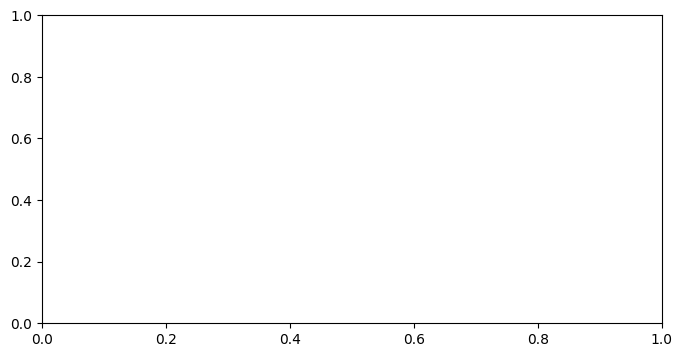

In [ ]:
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    n_tracks = resampled_rev.shape[0]
    n_splits = 10
    results_dict = {}  # Store mean/std r² per i and n_timesteps
    best_models = {}   # Store best model per (i, n_timesteps)
    all_scores_per_i = {}
    all_auc_per_i = {}
    lstm_lag = 5
    idxs = [[0],[1],[2],[3],[4],[5]]
    # fig, ax = plt.subplots()
    for i, (resampled_onset, exp_onset) in enumerate(zip(resampled_onsets, exp_onsets)):
        score_means = []
        score_stds = []
        # all_r2_means = []

        n_timesteps_list = []
        onset = resampled_onset-1

        
        for n_timesteps in range(1, 15, 4):
            # n_timesteps = 0
            print(f"\nProcessing i={i}, n_timesteps={n_timesteps}")

            # X_stim_all, feature_names_all = prep_FB_inputs_features_only(resampled_vel, resampled_acc, resampled_curve, resampled_rev, resampled_turn, onset, n_timesteps,   lstm_lag = lstm_lag)#shape (n_tracks, n_frames, n_features)
            # X_stim_all, feature_names_all = prep_FB_inputs_features_only(resampled_vel, resampled_acc, resampled_curve, resampled_rev, resampled_turn, onset, n_timesteps,   lstm_lag = lstm_lag)#shape (n_tracks, n_frames, n_features)
            X_stim_all, feature_names_all = prep_FB_inputs_donut_only( inferred_phases_all, inferred_rad_all, onset, n_tracks)
            
            Y_latency = latency_to_reversal(rev_bin, exp_onset, max_latency = 6*durations[i]+1)/6 # nan where not 
            no_rev_at_onset = Y_latency!=0
            Y_prob = np.logical_not(np.isnan(Y_latency[no_rev_at_onset]))# classfy y/n did rev happen
            X_prob = copy.deepcopy(X_stim_all[no_rev_at_onset])
            
            ###    
            # X_train, X_test, y_train, y_test = train_test_split(X_prob, Y_prob, test_size=test_size, random_state=random_state)
            balanced_accuracy_scores = []
            aucs = []
            models = []

            for split_idx in range(n_splits):
                # X_train, X_test, y_train, y_test = train_test_split(
                #     X_stim_all_latency, Y_latency_valid, test_size=test_size, random_state=split_idx)
                
                X_train, X_test, y_train, y_test = train_test_split(X_prob, Y_prob, test_size=test_size, random_state=split_idx)
                


                best_model = LogisticRegression(penalty='l2', solver='liblinear')
                best_model.fit(X_train, y_train)
                
                y_pred = best_model.predict(X_test)
                score = balanced_accuracy_score(y_test, y_pred)  
                # score = accuracy_score(y_test, y_pred)  

                balanced_accuracy_scores.append(score)
                y_proba = best_model.predict_proba(X_test)[:, 1]
                
                # y_proba = best_model.decision_function(X_test)
                aucs.append(roc_auc_score(y_test, y_proba)  )
                # print("balanced_accuracy_scores", balanced_accuracy_scores)
                # print(aucs)
                # models.append(best_model)
                models.append((best_model,X_train, X_test, y_train, y_test, c))

            accuracy_mean = np.mean(balanced_accuracy_scores)
            accuracy_std = np.std(balanced_accuracy_scores)
            best_model_idx = np.argmax(balanced_accuracy_scores)
            best_model_overall = models[best_model_idx]
            

            # Save results
            n_timesteps_list.append(n_timesteps)
            # all_r2_means.append(r2s)
            all_scores_per_i[(i, n_timesteps)] = balanced_accuracy_scores
            all_auc_per_i[(i, n_timesteps)] = aucs
            score_means.append(accuracy_mean)
            score_stds.append(accuracy_std)
            results_dict[(i, n_timesteps)] = (accuracy_mean, accuracy_std)
            best_models[(i, n_timesteps)] = best_model_overall


            # # cmap1 = cm.get_cmap('tab10', len(resampled_onsets))
            # ax.errorbar(n_timesteps_list, score_means, yerr=score_stds, #color=cmap1(i),
            #             fmt='-o', capsize=5, label = f"stim {i}")


            # ax.set_title(f"{neuron}; donut only; Reversal prediction;\n Mean ± STD balanced accuracy")
            # ax.set_xlabel("max time delay (frames)")
            # ax.set_ylabel("balanced accuracy")
        #
        # ax.legend()
        # n_timesteps = 0
        fig_bar, ax_bar = plt.subplots(figsize=(8, 4))
        x_vals = list(range(len(resampled_onsets)))  # i values
        for i in range(len(resampled_onsets)):
            # Collect bar plot data
            
            # bar_heights = [results_dict[(i, n_timesteps)][0] for i in x_vals]  # mean balanced accuracy
            # bar_errors = [results_dict[(i, n_timesteps)][1] for i in x_vals]  # std 
            bar_heights = [np.mean(all_scores_per_i[(i, n_timesteps)]) for i in x_vals]  # mean balanced accuracy
            bar_errors = [np.std(all_scores_per_i[(i, n_timesteps)]) for i in x_vals]  # std 

        # Create bar plot
            ax_bar.bar(x_vals, bar_heights, yerr=bar_errors, capsize=5, color='skyblue', edgecolor='k')
        ax_bar.set_xticks(x_vals)
        ax_bar.set_xticklabels([f"stim {i}" for i in x_vals])
        ax_bar.set_ylabel("Mean Balanced Accuracy")
        ax_bar.set_title(f"{neuron}; donut only; Reversal prediction\nBar plot of balanced accuracy ± STD")
        ax_bar.set_ylim(0, 1)
        ax_bar.grid(True, axis='y')

        
        
        fig_bar, ax_bar = plt.subplots(figsize=(8, 4))
        x_vals = list(range(len(resampled_onsets)))  # i values
        # Collect bar plot data
        for i in range(len(resampled_onsets)):
        
            bar_heights = [np.mean(all_auc_per_i[(i, n_timesteps)]) for i in x_vals]  # mean balanced accuracy
            bar_errors = [np.std(all_auc_per_i[(i, n_timesteps)]) for i in x_vals]  # std 

            # Create bar plot
            ax_bar.bar(x_vals, bar_heights, yerr=bar_errors, capsize=5, color='skyblue', edgecolor='k')
        ax_bar.set_xticks(x_vals)
        ax_bar.set_xticklabels([f"stim {i}" for i in x_vals])
        ax_bar.set_ylabel("Mean auc")
        ax_bar.set_title(f"{neuron}; {n_timesteps}; donut only; Reversal prediction\nBar plot of auc ± STD")
        ax_bar.set_ylim(0, 1)
        ax_bar.grid(True, axis='y')
        plt.grid(True)
        plt.tight_layout()
        # plt.savefig(f"r2_plot_i{i}.png")
        # plt.close()



# n_timesteps = 0
# # feature_names = np.array([[f"vel_t-{n_timesteps - t - 1}", f"accel_t-{n_timesteps - t - 1}",
# #                             f"curv_t-{n_timesteps - t - 1}", f"beh_t-{n_timesteps - t - 1}"]
# #                             for t in range(n_timesteps)]).flatten()
# for i in range(len(resampled_onsets)):
#     model,X_train, X_test, y_train, y_test, c  = best_models[(i, n_timesteps)] 

#     model_label= f"{neuron} stim: {i}; linear SVC;\ndonut only "#; lasso_a{np.round(alpha,2)}"
#     visualize_model_classification(model, model_label, feature_names_all, X_train, X_test, y_train, y_test, n_timesteps,  feature_names_ordered = False, coeffs = model.coef_[0])#, xlim = [-1,1])
    
# plt.show()

In [ ]:






# import warnings

# with warnings.catch_warnings():
#     warnings.simplefilter("ignore")
#     n_tracks = resampled_rev.shape[0]
#     n_splits = 10
#     results_dict = {}  # Store mean/std r² per i and n_timesteps
#     best_models = {}   # Store best model per (i, n_timesteps)
#     T = 5
#     idxs = [[0],[1],[2],[3],[4],[5]]
#     fig, ax = plt.subplots()
#     for i, (resampled_onset, exp_onset) in enumerate(zip(resampled_onsets, exp_onsets)):
#         onset = resampled_onset-1
#         score_means = []
#         score_stds = []
#         # all_r2_means = []
#         all_scores_per_i = {}
#         n_timesteps_list = []
        

#         # for n_timesteps in range(5, 10, 2):
#         for n_timesteps in range(1, 15, 1):
#             print(f"\nProcessing i={i}, n_timesteps={n_timesteps}")
#             # feature_names = np.array([[f"vel_t-{n_timesteps - t - 1}", f"accel_t-{n_timesteps - t - 1}",
#             #                            f"curv_t-{n_timesteps - t - 1}", f"beh_t-{n_timesteps - t - 1}"]
#             #                           for t in range(n_timesteps)]).flatten()

#             # X_stim = prep_FB_inputs(resampled_vel, resampled_acc, resampled_curve, resampled_rev,
#             #                         resampled_turn, T=n_timesteps)  # shape (n_tracks, n_frames, n_features)
#             # X_stim_all, feature_names = prep_FB_inputs_features(resampled_vel, resampled_acc, resampled_curve, resampled_rev, resampled_turn,   T = T
#             #         #    times, beh_map, 
#             #         #    lag=16, inclusion_thresh =3, 
#             #         #    remove_revs=False, 
                    
                    
                    
#             #            )
#             X_stim_features, feature_names = prep_FB_inputs_features_only(resampled_vel, resampled_acc, resampled_curve, resampled_rev, resampled_turn,onset,   T = T)#shape (n_tracks, n_frames, n_features)
#             X_donut_stim, donut_names = prep_FB_inputs_donut_only( inferred_phases_all, inferred_rad_all, onset, n_tracks)
#             # X_donut_stim = np.concatenate([inferred_phases[i][:, None], inferred_rad[i][:, None]], axis =1)

#             X_stim_all =  np.concatenate([X_stim_features ,  X_donut_stim], axis = 1)
#             feature_names_all = np.array(feature_names.tolist()+donut_names)
#             # print(inferred_phases[idxs[i]])
#             # fig, ax = plt.subplots(figsize = (15,3))
#             # ax.plot(inferred_phases[idxs[i]].flatten(), alpha = 0.3)
#             # ax.plot(X_donut_stim[:,0], linestyle='dashed', alpha = 0.4)
            
            

#             #  X_stim_all = X_stim[:, resampled_onset - T, :]
#             rev_bin = exp_behaviors
        
            
#             Y_latency = latency_to_reversal(rev_bin, exp_onset, max_latency = 6*durations[i]+1)/6 # nan where not 
#             no_rev_at_onset = Y_latency!=0
#             Y_prob = np.logical_not(np.isnan(Y_latency[no_rev_at_onset]))# classfy y/n did rev happen
#             X_prob = copy.deepcopy(X_stim_all[no_rev_at_onset])
            
#             ###    
#             # X_train, X_test, y_train, y_test = train_test_split(X_prob, Y_prob, test_size=test_size, random_state=random_state)
#             balanced_accuracy_scores = []
#             models = []

#             for split_idx in range(n_splits):
#                 # X_train, X_test, y_train, y_test = train_test_split(
#                 #     X_stim_all_latency, Y_latency_valid, test_size=test_size, random_state=split_idx)
                
#                 X_train, X_test, y_train, y_test = train_test_split(X_prob, Y_prob, test_size=test_size, random_state=split_idx)
                
#                 param_grid = {
#                     'C': [0.001, 0.01, 0.1, 1, 10, 100]
#                 }

#                 model = LinearSVC(penalty='l1', dual=False, max_iter=10000)
#                 # Grid search
#                 grid = GridSearchCV(model, param_grid, cv=5, scoring='balanced_accuracy')
#                 grid.fit(X_train, y_train)
#                 c = grid.best_params_['C']
#                 best_model = grid.best_estimator_
                
#                 y_pred = best_model.predict(X_test)
#                 score =balanced_accuracy_score(y_test, y_pred)  

#                 balanced_accuracy_scores.append(score)
#                 # models.append(best_model)
#                 models.append((best_model,X_train, X_test, y_train, y_test, c))

#             accuracy_mean = np.mean(balanced_accuracy_scores)
#             accuracy_std = np.std(balanced_accuracy_scores)
#             best_model_idx = np.argmax(balanced_accuracy_scores)
#             best_model_overall = models[best_model_idx]

#             # Save results
#             n_timesteps_list.append(n_timesteps)
#             # all_r2_means.append(r2s)
#             all_scores_per_i[(i, n_timesteps)] = balanced_accuracy_scores
#             score_means.append(accuracy_mean)
#             score_stds.append(accuracy_std)
#             results_dict[(i, n_timesteps)] = (accuracy_mean, accuracy_std)
#             best_models[(i, n_timesteps)] = best_model_overall


#         # cmap1 = cm.get_cmap('tab10', len(resampled_onsets))
#         ax.errorbar(n_timesteps_list, score_means, yerr=score_stds, #color=cmap1(i),
#                     fmt='-o', capsize=5, label = f"stim {i}")

#         ax.set_title(f"{neuron}; Reversal prediction; Mean ± STD balanced accuracy")
#         ax.set_xlabel("max time delay (frames)")
#         ax.set_ylabel("balanced accuracy")
#     ax.legend()
#     plt.grid(True)
#     plt.tight_layout()
#     # plt.savefig(f"r2_plot_i{i}.png")

In [ ]:
# def resample_fps(feature_arr, target_fps,  original_fps):
#     # Resample using linear interpolation
#     indices = np.arange(len(feature_arr))
#     new_indices = np.linspace(0, len(feature_arr) - 1, int(len(feature_arr) * (target_fps / original_fps)))
#     resampled_values = np.interp(new_indices, indices, feature_arr)
#     return resampled_values

# def resample_2d(inferred_phases_all_shifted, target_fps,  original_fps):
#     n_tracks = inferred_phases_all_shifted.shape[0]
#     resampled_tracks = []
#     for track_i in range(n_tracks):
#         resampled = resample_fps(inferred_phases_all_shifted[track_i, :], target_fps,  original_fps)
#         resampled_tracks.append(resampled[None,:])

#     inferred_phases_all_shifted_high_fps = np.concatenate(resampled_tracks, axis= 0 )
#     return inferred_phases_all_shifted_high_fps


# def feature_all_to_resampled(inferred_phases_all):
   
#     inferred_phases_all = inferred_phases_all.reshape(n_tracks, -1)
   
#     n_timesteps = inferred_phases_all.shape[1]
#     print("n_timesteps", n_timesteps)
#     # inferred_phases_all_shifted = np.zeros((n_tracks,n_timesteps+5+8))+np.nan #ask Bennet about the 8 extra time steps missing
#     # inferred_phases_all_shifted[:, 5:-8] = inferred_phases_all
    
#     inferred_phases_all_shifted = np.zeros((n_tracks,n_timesteps+5+8+8))+np.nan #ask Bennet about the 8 extra time steps missing
#     inferred_phases_all_shifted[:, 5:-16] = inferred_phases_all
#     return inferred_phases_all_shifted

# def flatten_and_remove_nans(resampled_features):
    
#     # return resampled_features[:, 5:-8].flatten()
#     return resampled_features.flatten()


# n_tracks  = resampled_vel.shape[0]

# phase_resampled = feature_all_to_resampled(inferred_phases_all)
# radii_resampled = feature_all_to_resampled(inferred_rad_all) 

# print(phase_resampled.shape)
# print(radii_resampled.shape)

n_timesteps 459
n_timesteps 459
(347, 480)
(347, 480)


In [ ]:

def visualize_model_regression(model, model_label, feature_names, X_train, X_test, y_train, y_test,n_time_steps, feature_names_ordered = None, xlim = None):
    model_real = copy.deepcopy(model)
    # model_real.fit(X_train, y_train)
    # # print(f"{model_label} Linear Regression R²:", model_real.score(X_test, y_test))
    # # plot_results(model_real, model_label, feature_names, X_train, X_test, y_train, y_test, n_time_steps, feature_names_ordered = feature_names_ordered, compare_to_suffle = compare_to_suffle  )
    # # print("Coefficients:", model.coef_)
    # # model_label= f"{i};lin"
    # model_shuffle = copy.deepcopy(model)
    # model_shuffle.fit(X_train, np.random.permutation(y_train))
    # # plot_results(model_shuffle, model_label, feature_names, X_train, X_test, y_train, y_test, n_time_steps, feature_names_ordered = feature_names_ordered, compare_to_suffle = compare_to_suffle  )
    
    
    y_pred_real = model_real.predict(X_test)
    fig, axs = plt.subplots(1,2)
    ax = axs[0]
    ax.scatter(y_test, y_pred_real, alpha=0.7)
    ax.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2)
    ax.set_xlabel("Test Actual Latency")
    ax.set_ylabel("Test Predicted Latency")
    ax.set_title( f"{model_label}; R²:{np.round(model_real.score(X_test, y_test),2)}")
    
    # y_pred_shuffled = model_shuffle.predict(X_test)
    # ax = axs[1]
    # ax.scatter(y_test, y_pred_shuffled, alpha=0.7)
    ax.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2)
    ax.set_xlabel("Test Actual Latency")
    ax.set_ylabel("Test Predicted Latency")
    # test_r2 = model_shuffle.score(X_test, y_test)
    
    # ax.set_title( f"{model_label}; shuffled; R²:{np.round(test_r2,2)}")
    plt.tight_layout()
    y_pred_real = model_real.predict(X_train)
    # fig, ax = plt.subplots()
    ax = axs[1]
    ax.scatter(y_train, y_pred_real, alpha=0.7)
    ax.plot([y_train.min(), y_train.max()], [y_train.min(), y_train.max()], 'k--', lw=2)
    ax.set_xlabel("Train Actual Latency")
    ax.set_ylabel("Train Predicted Latency")
    test_r2 = model_real.score(X_train, y_train)
    ax.set_title( f"{model_label}; R²:{np.round(test_r2,2)}")
    
    # y_pred_shuffled = model_shuffle.predict(X_train)
    # ax = axs[1]
    # ax.scatter(y_train, y_pred_shuffled, alpha=0.7)
    # ax.plot([y_train.min(), y_train.max()], [y_train.min(), y_train.max()], 'k--', lw=2)
    ax.set_xlabel("Train Actual Latency")
    ax.set_ylabel("Train Predicted Latency")
    # ax.set_title( f"{model_label}; shuffled; R²:{np.round(model_shuffle.score(X_train, y_train),2)}")
    plt.tight_layout()
    
    
    
    
    
#     plot_coeffs(model_real, feature_names, model_label,n_time_steps,   feature_names_ordered = feature_names_ordered, xlim = xlim)
    
#     return test_r2 

    
    
    
# n_timesteps = 7
# feature_names = np.array([[f"vel_t-{n_timesteps - t - 1}", f"accel_t-{n_timesteps - t - 1}",
#                             f"curv_t-{n_timesteps - t - 1}", f"beh_t-{n_timesteps - t - 1}"]
#                             for t in range(n_timesteps)]).flatten()
# for i in range(len(resampled_onsets)):
#     model,X_train, X_test, y_train, y_test = best_models[(i, n_timesteps)] 
    
#     # print("Best alpha lasso:", grid_search_lasso.best_params_['alpha'])
#     # print("Best CV R²:", grid_search_lasso.best_score_)
#     # alpha = grid_search_lasso.best_params_['alpha']
#     # model = Lasso(alpha=alpha)  # You can tune alpha with CV
#     model_label= f"{neuron}; stim: {i}; SVC"#{np.round(alpha,2)}"#; lasso_a{np.round(alpha,2)}"
#     visualize_model_regression(model, model_label, feature_names, X_train, X_test, y_train, y_test, n_timesteps,  feature_names_ordered = True, xlim = [-1,1])

In [ ]:



# from sklearn.model_selection import train_test_split, GridSearchCV
# from sklearn.linear_model import Lasso
# from sklearn.metrics import r2_score
# import matplotlib.pyplot as plt
# import numpy as np
# import copy
# import pickle
# import matplotlib.cm as cm

    
    
    
#     plot_coeffs(model_real, feature_names, model_label,n_time_steps,   feature_names_ordered = feature_names_ordered, xlim = xlim)
    
#     return test_r2 

    

# def resample_fps(feature_arr, target_fps,  original_fps):
#     # Resample using linear interpolation
#     indices = np.arange(len(feature_arr))
#     new_indices = np.linspace(0, len(feature_arr) - 1, int(len(feature_arr) * (target_fps / original_fps)))
#     resampled_values = np.interp(new_indices, indices, feature_arr)
#     return resampled_values

# def resample_2d(inferred_phases_all_shifted, target_fps,  original_fps):
#     n_tracks = inferred_phases_all_shifted.shape[0]
#     resampled_tracks = []
#     for track_i in range(n_tracks):
#         resampled = resample_fps(inferred_phases_all_shifted[track_i, :], target_fps,  original_fps)
#         resampled_tracks.append(resampled[None,:])

#     inferred_phases_all_shifted_high_fps = np.concatenate(resampled_tracks, axis= 0 )
#     return inferred_phases_all_shifted_high_fps


# def feature_all_to_resampled(inferred_phases_all, n_tracks):
   
#     inferred_phases_all = inferred_phases_all.reshape(n_tracks, -1)
   
#     n_timesteps = inferred_phases_all.shape[1]
#     print("n_timesteps", n_timesteps)
#     # inferred_phases_all_shifted = np.zeros((n_tracks,n_timesteps+5+8))+np.nan #ask Bennet about the 8 extra time steps missing
#     # inferred_phases_all_shifted[:, 5:-8] = inferred_phases_all
    
#     inferred_phases_all_shifted = np.zeros((n_tracks,n_timesteps+5+8+8))+np.nan #ask Bennet about the 8 extra time steps missing
#     inferred_phases_all_shifted[:, 5:-16] = inferred_phases_all
#     return inferred_phases_all_shifted

# def flatten_and_remove_nans(resampled_features):
    
#     # return resampled_features[:, 5:-8].flatten()
#     return resampled_features.flatten()

# n_tracks  = resampled_vel.shape[0]
# phase_resampled = feature_all_to_resampled(inferred_phases_all)
# radii_resampled = feature_all_to_resampled(inferred_rad_all) 


# n_splits = 10
# results_dict = {}  # Store mean/std r² per i and n_timesteps
# best_models = {}   # Store best model per (i, n_timesteps)
# T = 5
# fig, ax = plt.subplots()
# for i, (resampled_onset, exp_onset) in enumerate(zip(resampled_onsets, exp_onsets)):
#     r2_means = []
#     r2_stds = []
#     # all_r2_means = []
#     all_r2s_per_i = {}
#     n_timesteps_list = []
    

#     # for n_timesteps in range(5, 10, 2):
#     for n_timesteps in range(1, 15, 1):
#         print(f"\nProcessing i={i}, n_timesteps={n_timesteps}")
#         feature_names = np.array([[f"vel_t-{n_timesteps - t - 1}", f"accel_t-{n_timesteps - t - 1}",
#                                    f"curv_t-{n_timesteps - t - 1}", f"beh_t-{n_timesteps - t - 1}"]
#                                   for t in range(n_timesteps)]).flatten()

#         X_features = prep_FB_inputs_features(resampled_vel, resampled_acc, resampled_curve, resampled_rev,
#                                 resampled_turn, T=n_timesteps)  # shape (n_tracks, n_frames, n_features)
#         X_donut = np.concatenate(resampled_phase[:, :, None] ,  resampled_radii[:, :, None], axis = 2)
#         X_donut_stim = X_donut[:, resampled_onset,:]
#         rev_bin = exp_behaviors
#         X_stim_features = X_features[:, resampled_onset - T, :]
#         X_stim_all =  np.concatenate(X_stim_features[:, :, None] ,  X_donut_stim[:, :, None], axis = 2)
        

#         Y_latency = latency_to_reversal(rev_bin, exp_onset, max_latency=6 * durations[i] + 1) / 6
#         valid_indices = np.argwhere((~np.isnan(Y_latency)) & (Y_latency != 0)).flatten() #non_nan_non_rev_is = np.argwhere(np.logical_and(np.logical_not(np.isnan(Y_latency)), Y_latency!=0)).flatten()
#         X_stim_all_latency = X_stim_all[valid_indices]
#         Y_latency_valid = Y_latency[valid_indices]

#         r2s = []
#         models = []

#         for split_idx in range(n_splits):
#             X_train, X_test, y_train, y_test = train_test_split(
#                 X_stim_all_latency, Y_latency_valid, test_size=test_size, random_state=split_idx)

#             alphas = np.logspace(-4, 2, 20)
#             lasso = Lasso(max_iter=10000)
#             grid_search = GridSearchCV(lasso, {'alpha': alphas}, cv=5, scoring='r2')
#             grid_search.fit(X_train, y_train)

#             best_model = grid_search.best_estimator_
#             y_pred = best_model.predict(X_test)
#             r2 = r2_score(y_test, y_pred)

#             r2s.append(r2)
#             # models.append(best_model)
#             models.append((best_model,X_train, X_test, y_train, y_test))

#         r2_mean = np.mean(r2s)
#         r2_std = np.std(r2s)
#         best_model_idx = np.argmax(r2s)
#         best_model_overall = models[best_model_idx]

#         # Save results
#         n_timesteps_list.append(n_timesteps)
#         # all_r2_means.append(r2s)
#         all_r2s_per_i[(i, n_timesteps)] = r2s
#         r2_means.append(r2_mean)
#         r2_stds.append(r2_std)
#         results_dict[(i, n_timesteps)] = (r2_mean, r2_std)
#         best_models[(i, n_timesteps)] = best_model_overall

#         # # Optional: Save model to disk
#         # with open(f"best_model_i{i}_T{n_timesteps}.pkl", "wb") as f:
#         #     pickle.dump(best_model_overall, f)

#         print(f"Best split R²: {r2s[best_model_idx]:.3f}, Mean R²: {r2_mean:.3f} ± {r2_std:.3f}")


#     # cmap1 = cm.get_cmap('tab10', len(resampled_onsets))
#     ax.errorbar(n_timesteps_list, r2_means, yerr=r2_stds, #color=cmap1(i),
#                 fmt='-o', capsize=5, label = f"stim {i}")
#     # for x, n_t in enumerate(n_timesteps_list):
#     #     r2s = all_r2s_per_i[(i, n_t)]
#     #     plt.scatter([n_t]*len(r2s), r2s, color='gray', alpha=0.6, s=30, label='Split R²' if x == 0 else None)
#     # for x, n_t in enumerate(n_timesteps_list): # plot jsut max 
#     #     r2s = all_r2s_per_i[(i, n_t)]
#     #     ax.scatter(n_t, max(r2s), color=cmap1(i), alpha=0.6, s=30, marker='^', facecolors='none', edgecolors=color, label='Split R²' if x == 0 else None)
#     ax.set_title(f"{neuron}; Latency prediction; Mean ± STD R²")
#     ax.set_xlabel("max time delay (frames)")
#     ax.set_ylabel("R²")
# ax.legend()
# plt.grid(True)
# plt.tight_layout()
# # plt.savefig(f"r2_plot_i{i}.png")
# # plt.close()



    
    
# n_timesteps = 7
# feature_names = np.array([[f"vel_t-{n_timesteps - t - 1}", f"accel_t-{n_timesteps - t - 1}",
#                             f"curv_t-{n_timesteps - t - 1}", f"beh_t-{n_timesteps - t - 1}"]
#                             for t in range(n_timesteps)]).flatten()
# for i in range(len(resampled_onsets)):
#     model,X_train, X_test, y_train, y_test = best_models[(i, n_timesteps)] 
    
#     # print("Best alpha lasso:", grid_search_lasso.best_params_['alpha'])
#     # print("Best CV R²:", grid_search_lasso.best_score_)
#     # alpha = grid_search_lasso.best_params_['alpha']
#     # model = Lasso(alpha=alpha)  # You can tune alpha with CV
#     model_label= f"{neuron}; stim: {i}; \nlasso"#_a{np.round(alpha,2)}"#; lasso_a{np.round(alpha,2)}"
#     visualize_model_regression(model, model_label, feature_names, X_train, X_test, y_train, y_test, n_timesteps,  feature_names_ordered = True, xlim = [-1,1])

TypeError: feature_all_to_resampled() missing 1 required positional argument: 'n_tracks'


Processing i=0, n_timesteps=1
Best split R²: -0.000, Mean R²: -0.035 ± 0.040

Processing i=0, n_timesteps=4
Best split R²: 0.213, Mean R²: 0.007 ± 0.202

Processing i=0, n_timesteps=7
Best split R²: 0.690, Mean R²: 0.532 ± 0.105

Processing i=0, n_timesteps=10
Best split R²: 0.827, Mean R²: 0.733 ± 0.076

Processing i=0, n_timesteps=13
Best split R²: 0.828, Mean R²: 0.732 ± 0.075

Processing i=1, n_timesteps=1
Best split R²: -0.000, Mean R²: -0.027 ± 0.033

Processing i=1, n_timesteps=4
Best split R²: 0.193, Mean R²: 0.063 ± 0.082

Processing i=1, n_timesteps=7
Best split R²: 0.504, Mean R²: 0.341 ± 0.137

Processing i=1, n_timesteps=10
Best split R²: 0.590, Mean R²: 0.406 ± 0.156

Processing i=1, n_timesteps=13
Best split R²: 0.602, Mean R²: 0.423 ± 0.158

Processing i=2, n_timesteps=1
Best split R²: 0.030, Mean R²: -0.037 ± 0.067

Processing i=2, n_timesteps=4
Best split R²: 0.097, Mean R²: -0.023 ± 0.117

Processing i=2, n_timesteps=7
Best split R²: 0.525, Mean R²: 0.333 ± 0.094

P

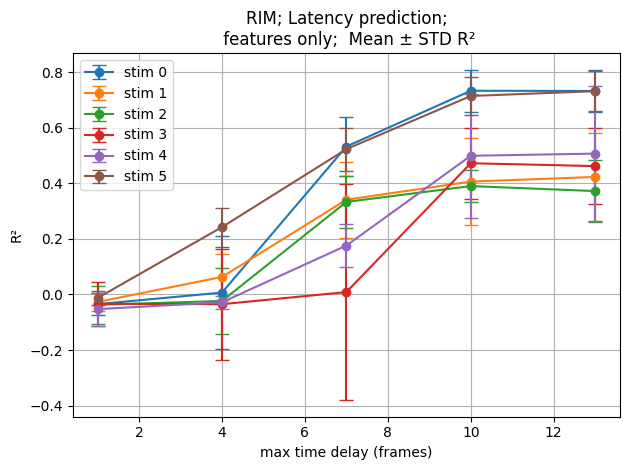

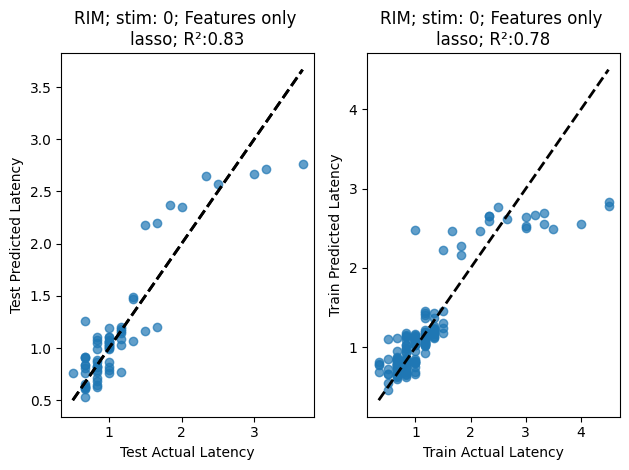

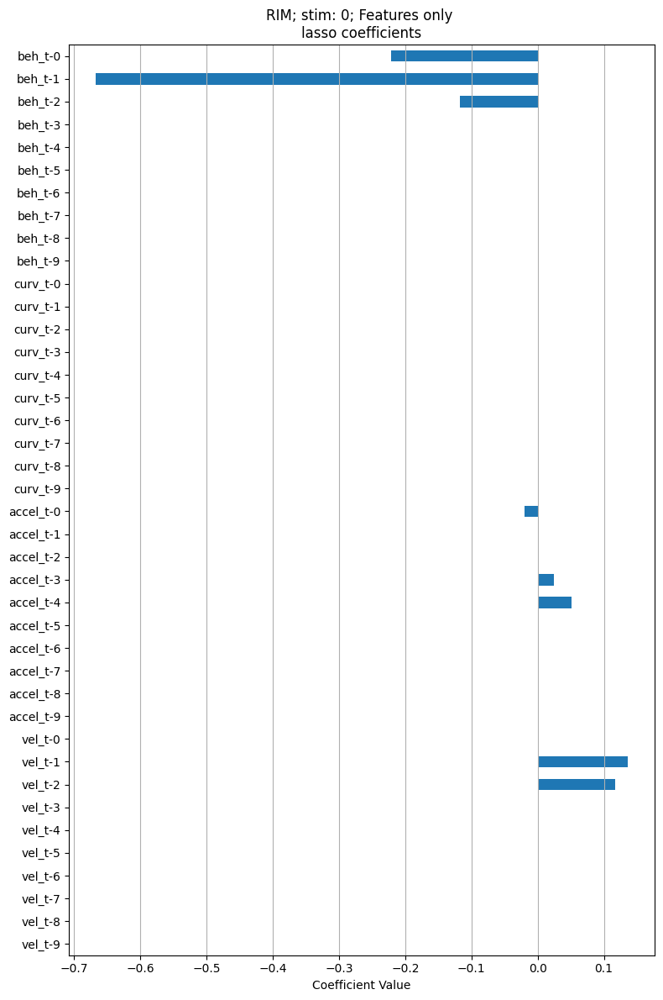

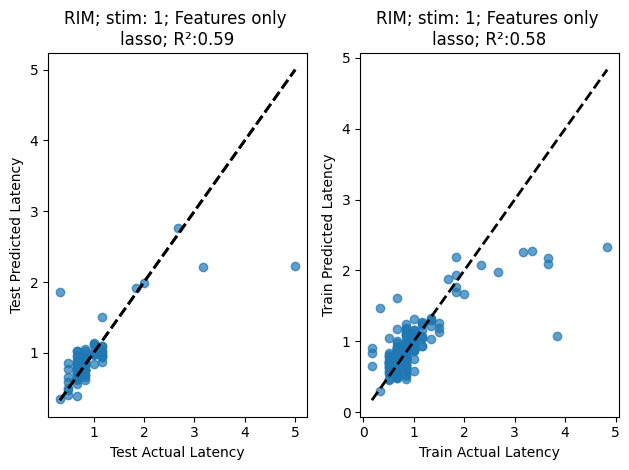

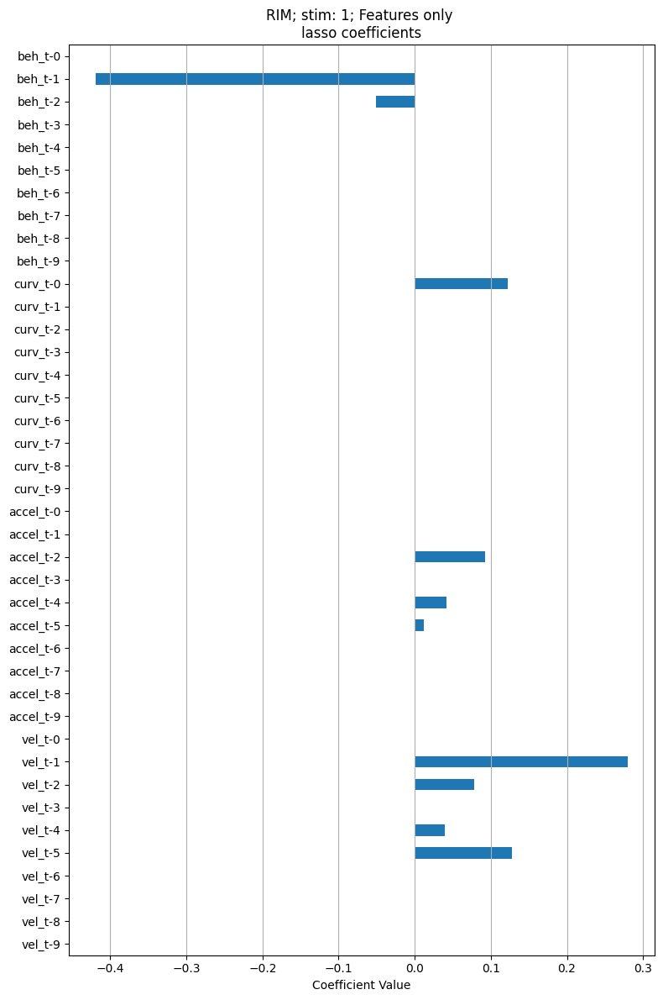

...

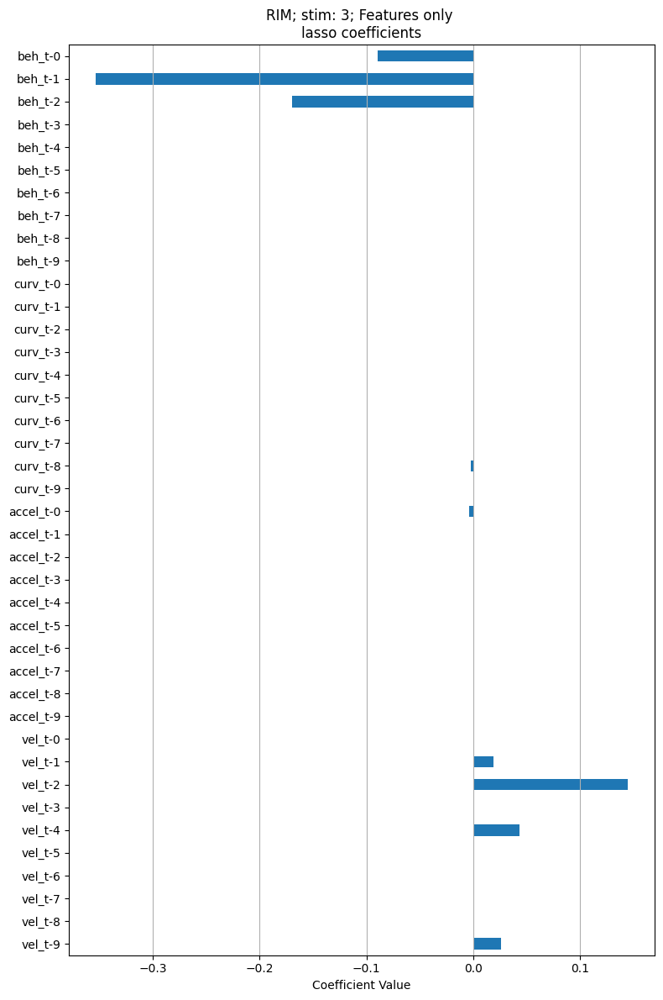

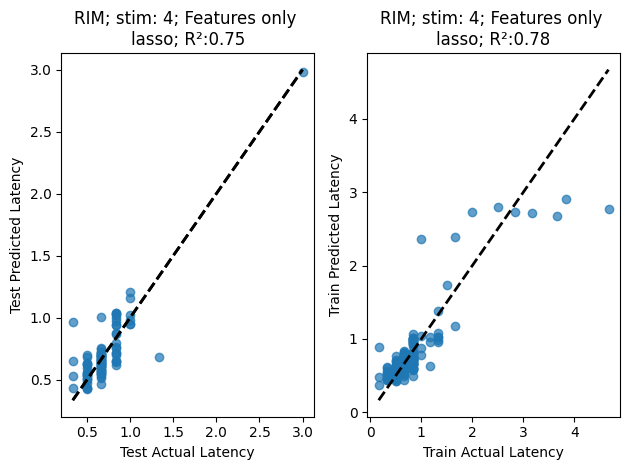

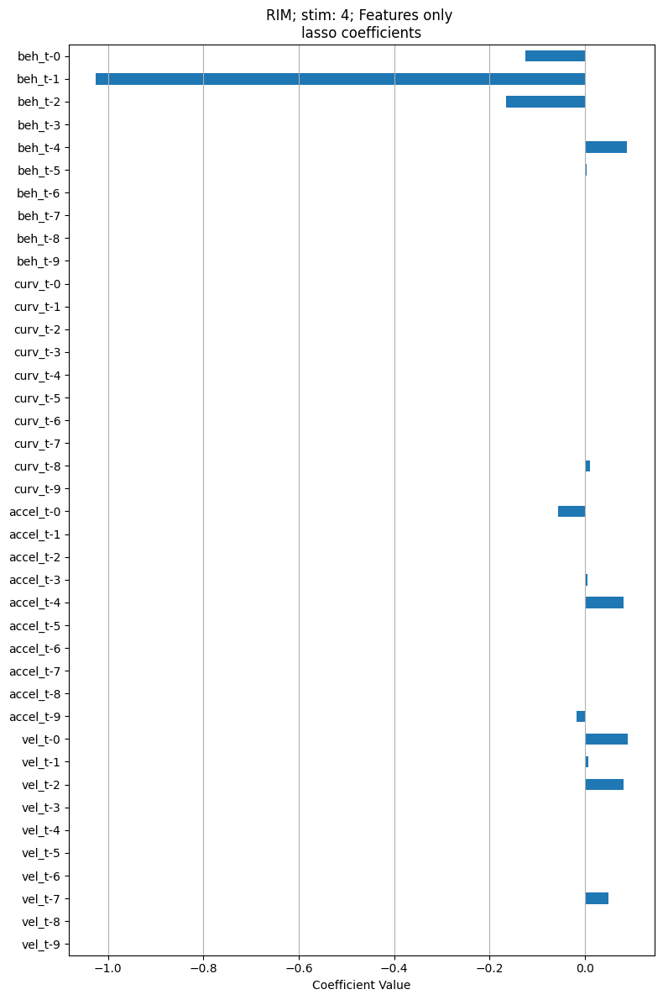

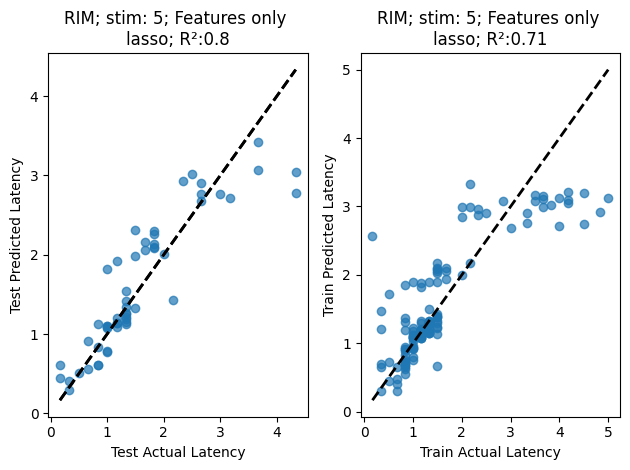

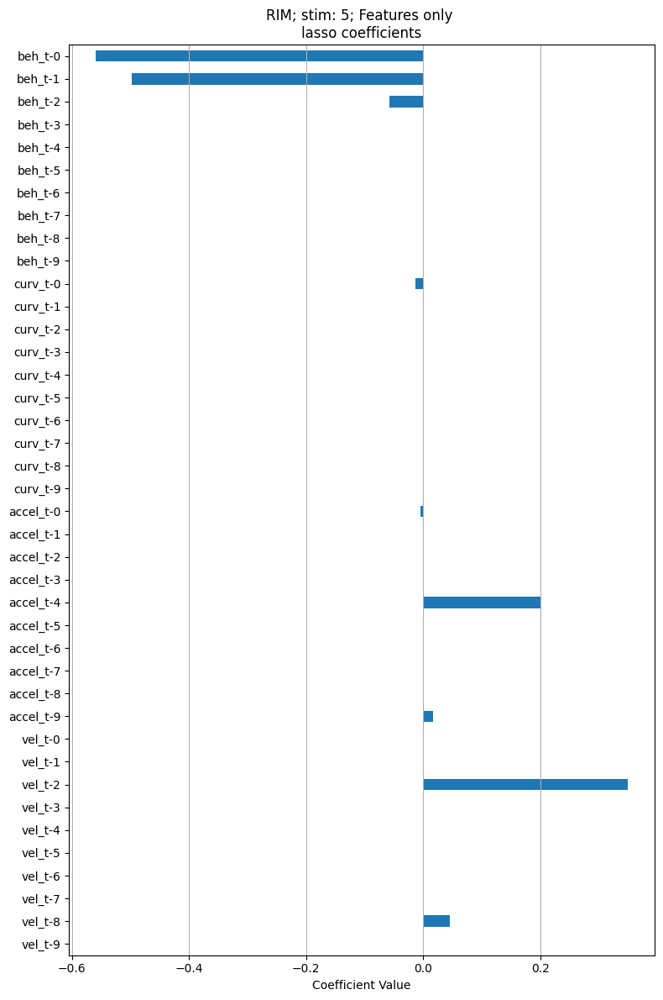

In [ ]:

def visualize_model_regression(model, model_label, feature_names, X_train, X_test, y_train, y_test,n_time_steps, feature_names_ordered = None, xlim = None, coeffs = None):
    model_real = copy.deepcopy(model)
    # model_real.fit(X_train, y_train)
    # # print(f"{model_label} Linear Regression R²:", model_real.score(X_test, y_test))
    # # plot_results(model_real, model_label, feature_names, X_train, X_test, y_train, y_test, n_time_steps, feature_names_ordered = feature_names_ordered, compare_to_suffle = compare_to_suffle  )
    # # print("Coefficients:", model.coef_)
    # # model_label= f"{i};lin"
    # model_shuffle = copy.deepcopy(model)
    # model_shuffle.fit(X_train, np.random.permutation(y_train))
    # # plot_results(model_shuffle, model_label, feature_names, X_train, X_test, y_train, y_test, n_time_steps, feature_names_ordered = feature_names_ordered, compare_to_suffle = compare_to_suffle  )
    
    
    y_pred_real = model_real.predict(X_test)
    fig, axs = plt.subplots(1,2)
    ax = axs[0]
    ax.scatter(y_test, y_pred_real, alpha=0.7)
    ax.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2)
    ax.set_xlabel("Test Actual Latency")
    ax.set_ylabel("Test Predicted Latency")
    ax.set_title( f"{model_label}; R²:{np.round(model_real.score(X_test, y_test),2)}")
    
    # y_pred_shuffled = model_shuffle.predict(X_test)
    # ax = axs[1]
    # ax.scatter(y_test, y_pred_shuffled, alpha=0.7)
    ax.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2)
    ax.set_xlabel("Test Actual Latency")
    ax.set_ylabel("Test Predicted Latency")
    # test_r2 = model_shuffle.score(X_test, y_test)
    
    # ax.set_title( f"{model_label}; shuffled; R²:{np.round(test_r2,2)}")
    plt.tight_layout()
    y_pred_real = model_real.predict(X_train)
    # fig, ax = plt.subplots()
    ax = axs[1]
    ax.scatter(y_train, y_pred_real, alpha=0.7)
    ax.plot([y_train.min(), y_train.max()], [y_train.min(), y_train.max()], 'k--', lw=2)
    ax.set_xlabel("Train Actual Latency")
    ax.set_ylabel("Train Predicted Latency")
    test_r2 = model_real.score(X_train, y_train)
    ax.set_title( f"{model_label}; R²:{np.round(test_r2,2)}")
    
    # y_pred_shuffled = model_shuffle.predict(X_train)
    # ax = axs[1]
    # ax.scatter(y_train, y_pred_shuffled, alpha=0.7)
    # ax.plot([y_train.min(), y_train.max()], [y_train.min(), y_train.max()], 'k--', lw=2)
    ax.set_xlabel("Train Actual Latency")
    ax.set_ylabel("Train Predicted Latency")
    # ax.set_title( f"{model_label}; shuffled; R²:{np.round(model_shuffle.score(X_train, y_train),2)}")
    plt.tight_layout()
    
    fig, ax = plot_coeffs(model, feature_names, model_label, n_time_steps, feature_names_ordered = feature_names_ordered, xlim = xlim, coeffs = coeffs)
    
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    n_tracks  = resampled_vel.shape[0]
    # phase_resampled = feature_all_to_resampled(inferred_phases_all)
    # radii_resampled = feature_all_to_resampled(inferred_rad_all) 


    n_splits = 10
    results_dict = {}  # Store mean/std r² per i and n_timesteps
    best_models = {}   # Store best model per (i, n_timesteps)
    T = 5
    lstm_lag = 5
    fig, ax = plt.subplots()
    for i, (resampled_onset, exp_onset) in enumerate(zip(resampled_onsets, exp_onsets)):
        r2_means = []
        r2_stds = []
        # all_r2_means = []
        all_r2s_per_i = {}
        n_timesteps_list = []
        onset = resampled_onset-1

        # for n_timesteps in range(5, 10, 2):
        # for n_timesteps in range(1, 15, 1):
        for n_timesteps in range(1, 15, 3):
            print(f"\nProcessing i={i}, n_timesteps={n_timesteps}")
            feature_names = np.array([[f"vel_t-{n_timesteps - t - 1}", f"accel_t-{n_timesteps - t - 1}",
                                    f"curv_t-{n_timesteps - t - 1}", f"beh_t-{n_timesteps - t - 1}"]
                                    for t in range(n_timesteps)]).flatten()

            # X_features = prep_FB_inputs_features(resampled_vel, resampled_acc, resampled_curve, resampled_rev,
            #                         resampled_turn, T=n_timesteps)  # shape (n_tracks, n_frames, n_features)
            # X_donut = np.concatenate(resampled_phase[:, :, None] ,  resampled_radii[:, :, None], axis = 2)
            # X_donut_stim = X_donut[:, resampled_onset,:]
            # rev_bin = exp_behaviors
            # X_stim_features = X_features[:, resampled_onset - T, :]
            # X_stim_all =  np.concatenate(X_stim_features[:, :, None] ,  X_donut_stim[:, :, None], axis = 2)
            
            X_stim_all, feature_names_all = prep_FB_inputs_features_only(resampled_vel, resampled_acc, resampled_curve, resampled_rev, resampled_turn, onset, n_timesteps,   lstm_lag = lstm_lag)#shape (n_tracks, n_frames, n_features)


            Y_latency = latency_to_reversal(rev_bin, exp_onset, max_latency=6 * durations[i] + 1) / 6
            valid_indices = np.argwhere((~np.isnan(Y_latency)) & (Y_latency != 0)).flatten() #non_nan_non_rev_is = np.argwhere(np.logical_and(np.logical_not(np.isnan(Y_latency)), Y_latency!=0)).flatten()
            X_stim_all_latency = X_stim_all[valid_indices]
            Y_latency_valid = Y_latency[valid_indices]

            r2s = []
            models = []

            for split_idx in range(n_splits):
                X_train, X_test, y_train, y_test = train_test_split(
                    X_stim_all_latency, Y_latency_valid, test_size=test_size, random_state=split_idx)

                alphas = np.logspace(-4, 2, 20)
                lasso = Lasso(max_iter=10000)
                grid_search = GridSearchCV(lasso, {'alpha': alphas}, cv=5, scoring='r2')
                grid_search.fit(X_train, y_train)

                best_model = grid_search.best_estimator_
                y_pred = best_model.predict(X_test)
                r2 = r2_score(y_test, y_pred)

                r2s.append(r2)
                # models.append(best_model)
                models.append((best_model,X_train, X_test, y_train, y_test))

            r2_mean = np.mean(r2s)
            r2_std = np.std(r2s)
            best_model_idx = np.argmax(r2s)
            best_model_overall = models[best_model_idx]

            # Save results
            n_timesteps_list.append(n_timesteps)
            # all_r2_means.append(r2s)
            all_r2s_per_i[(i, n_timesteps)] = r2s
            r2_means.append(r2_mean)
            r2_stds.append(r2_std)
            results_dict[(i, n_timesteps)] = (r2_mean, r2_std)
            best_models[(i, n_timesteps)] = best_model_overall

            # # Optional: Save model to disk
            # with open(f"best_model_i{i}_T{n_timesteps}.pkl", "wb") as f:
            #     pickle.dump(best_model_overall, f)

            print(f"Best split R²: {r2s[best_model_idx]:.3f}, Mean R²: {r2_mean:.3f} ± {r2_std:.3f}")


        # cmap1 = cm.get_cmap('tab10', len(resampled_onsets))
        ax.errorbar(n_timesteps_list, r2_means, yerr=r2_stds, #color=cmap1(i),
                    fmt='-o', capsize=5, label = f"stim {i}")
        # for x, n_t in enumerate(n_timesteps_list):
        #     r2s = all_r2s_per_i[(i, n_t)]
        #     plt.scatter([n_t]*len(r2s), r2s, color='gray', alpha=0.6, s=30, label='Split R²' if x == 0 else None)
        # for x, n_t in enumerate(n_timesteps_list): # plot jsut max 
        #     r2s = all_r2s_per_i[(i, n_t)]
        #     ax.scatter(n_t, max(r2s), color=cmap1(i), alpha=0.6, s=30, marker='^', facecolors='none', edgecolors=color, label='Split R²' if x == 0 else None)
        ax.set_title(f"{neuron}; Latency prediction;\n features only;  Mean ± STD R²")
        ax.set_xlabel("max time delay (frames)")
        ax.set_ylabel("R²")
    ax.legend()
    plt.grid(True)
    plt.tight_layout()
    # plt.savefig(f"r2_plot_i{i}.png")
    # plt.close()



        
        
    n_timesteps = 10
    feature_names = np.array([[f"vel_t-{n_timesteps - t - 1}", f"accel_t-{n_timesteps - t - 1}",
                                f"curv_t-{n_timesteps - t - 1}", f"beh_t-{n_timesteps - t - 1}"]
                                for t in range(n_timesteps)]).flatten()
    for i in range(len(resampled_onsets)):
        model,X_train, X_test, y_train, y_test = best_models[(i, n_timesteps)] 
        
        # print("Best alpha lasso:", grid_search_lasso.best_params_['alpha'])
        # print("Best CV R²:", grid_search_lasso.best_score_)
        # alpha = grid_search_lasso.best_params_['alpha']
        # model = Lasso(alpha=alpha)  # You can tune alpha with CV
        model_label= f"{neuron}; stim: {i}; Features only \nlasso"#_a{np.round(alpha,2)}"#; lasso_a{np.round(alpha,2)}"
        visualize_model_regression(model, model_label, feature_names, X_train, X_test, y_train, y_test, n_timesteps,  feature_names_ordered = True)#, xlim = [-2,1])


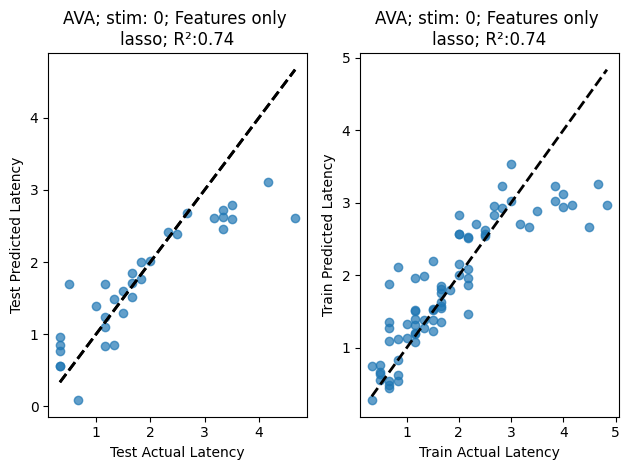

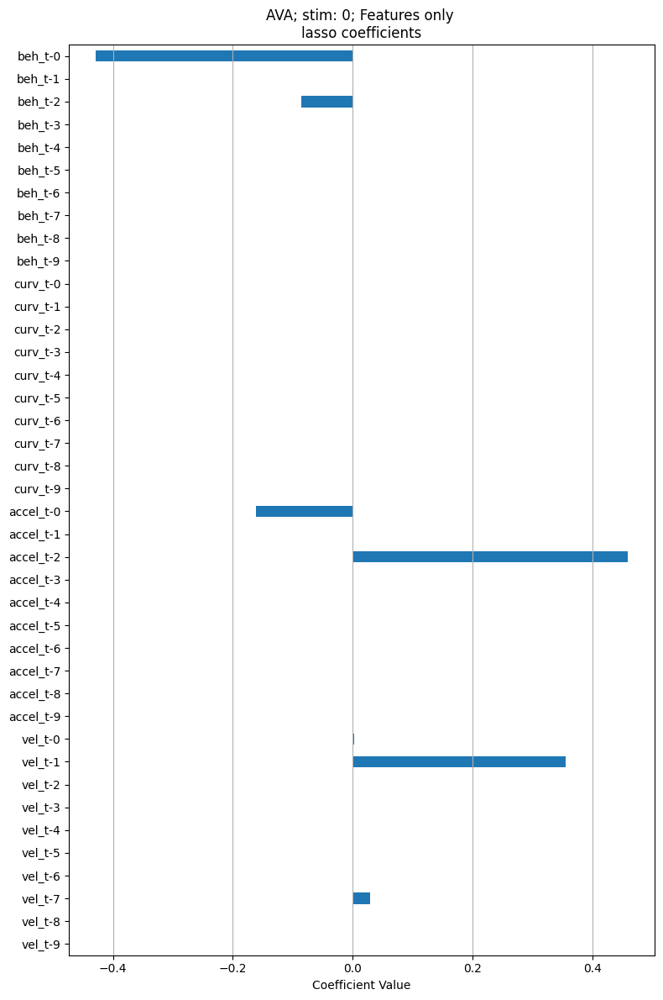

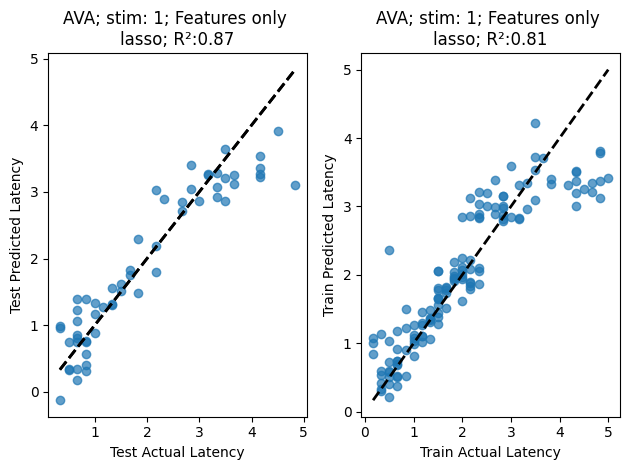

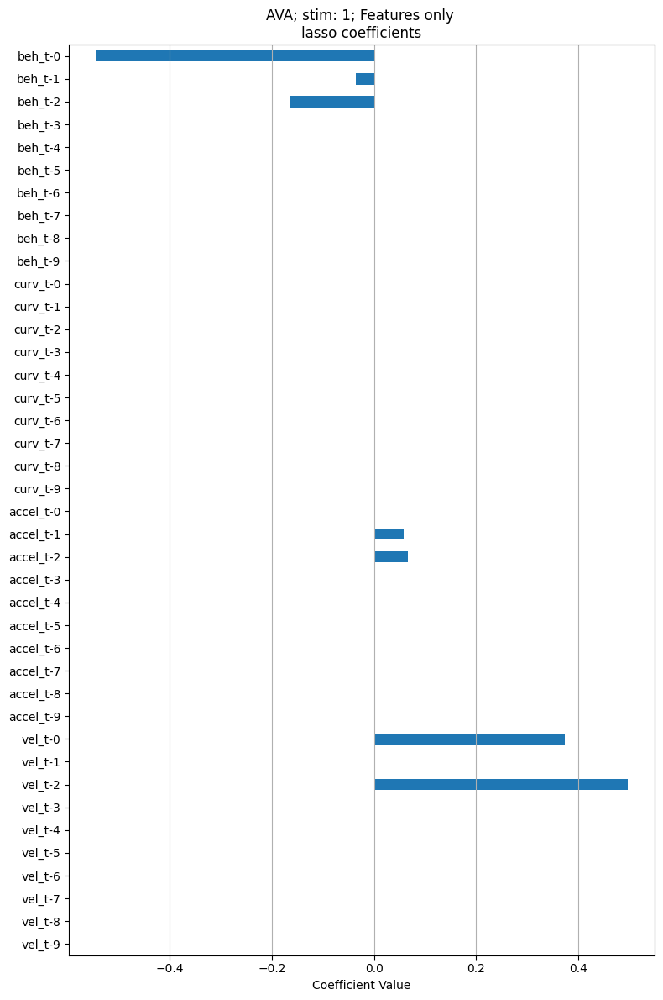

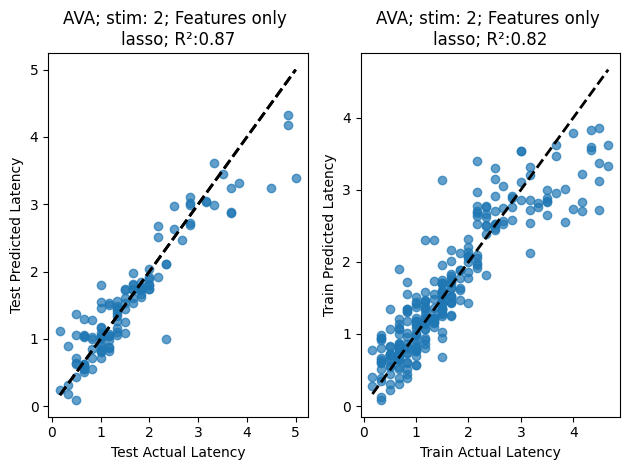

...

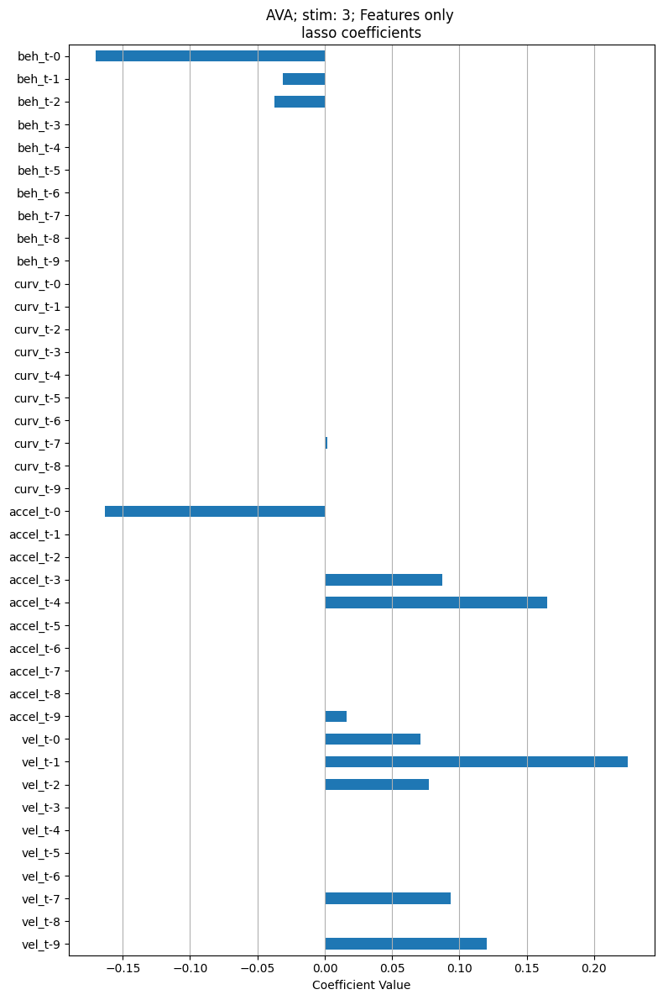

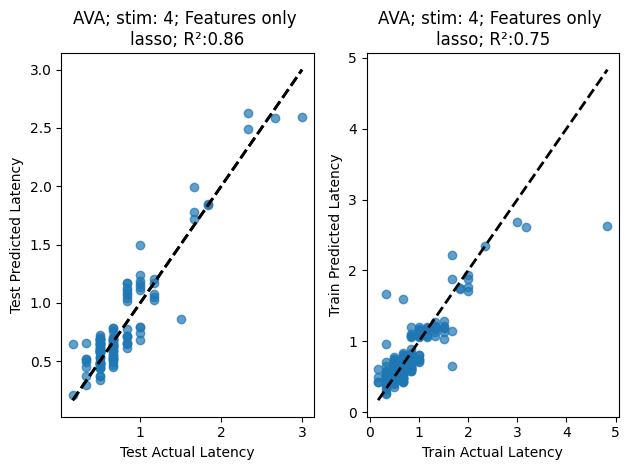

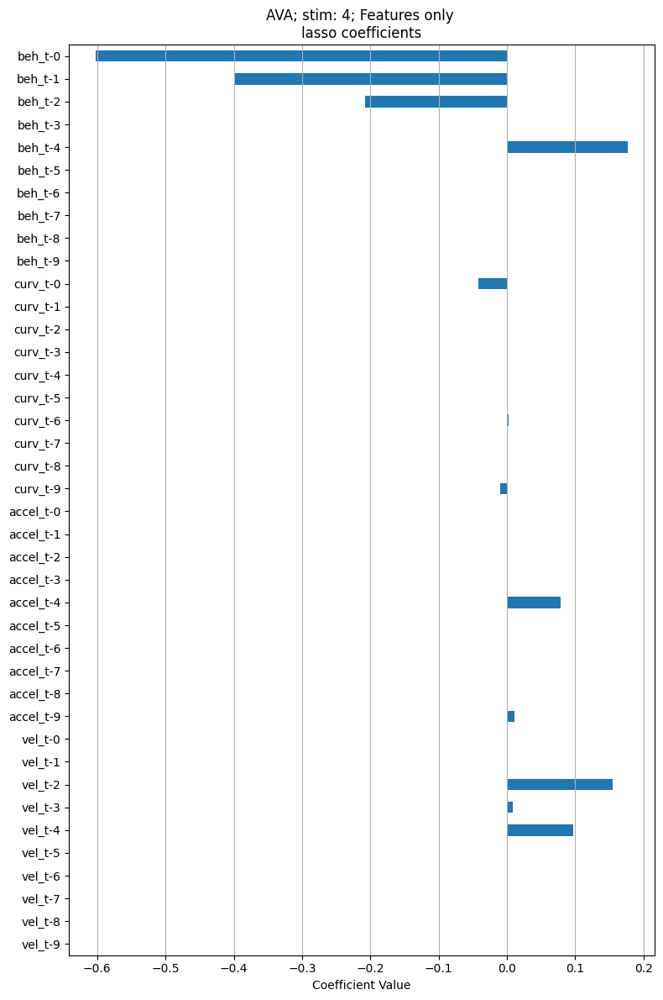

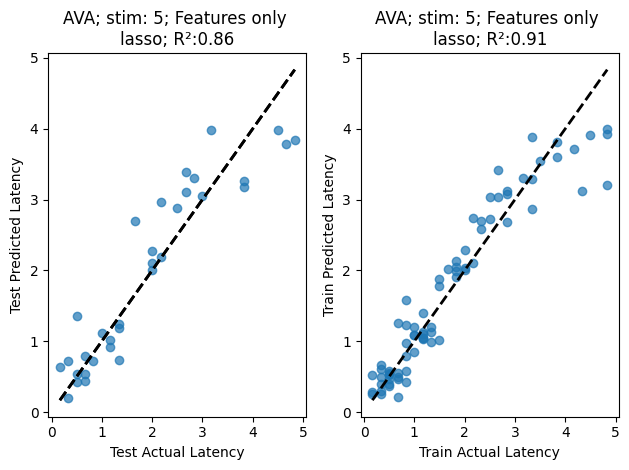

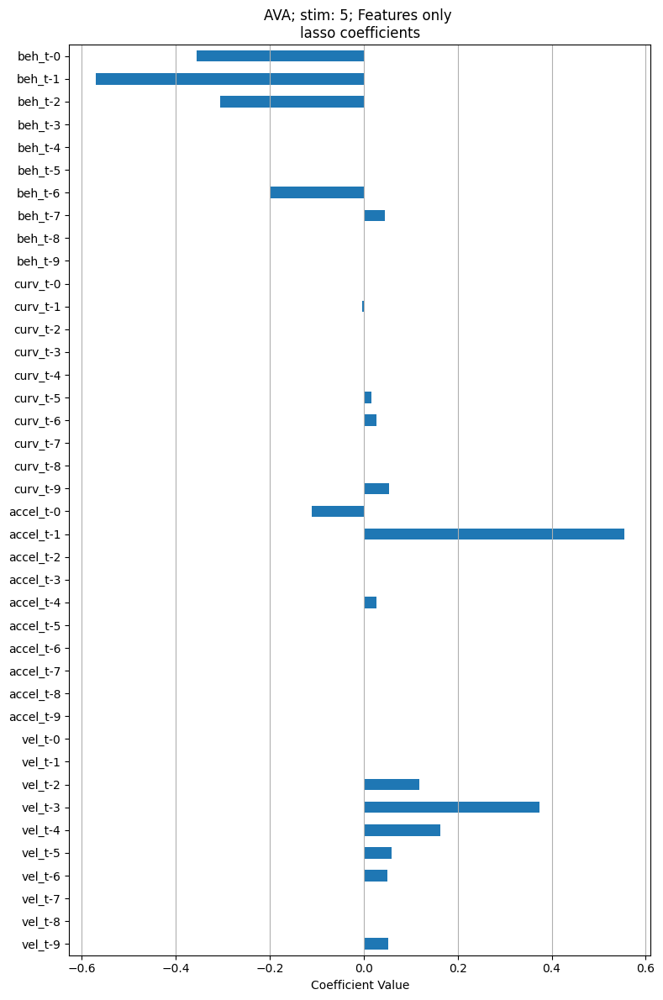

In [ ]:

# def visualize_model_regression(model, model_label, feature_names, X_train, X_test, y_train, y_test,n_time_steps, feature_names_ordered = None, xlim = None, coeffs = None):
#     model_real = copy.deepcopy(model)
#     # model_real.fit(X_train, y_train)
#     # # print(f"{model_label} Linear Regression R²:", model_real.score(X_test, y_test))
#     # # plot_results(model_real, model_label, feature_names, X_train, X_test, y_train, y_test, n_time_steps, feature_names_ordered = feature_names_ordered, compare_to_suffle = compare_to_suffle  )
#     # # print("Coefficients:", model.coef_)
#     # # model_label= f"{i};lin"
#     # model_shuffle = copy.deepcopy(model)
#     # model_shuffle.fit(X_train, np.random.permutation(y_train))
#     # # plot_results(model_shuffle, model_label, feature_names, X_train, X_test, y_train, y_test, n_time_steps, feature_names_ordered = feature_names_ordered, compare_to_suffle = compare_to_suffle  )
    
    
#     y_pred_real = model_real.predict(X_test)
#     fig, axs = plt.subplots(1,2)
#     ax = axs[0]
#     ax.scatter(y_test, y_pred_real, alpha=0.7)
#     ax.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2)
#     ax.set_xlabel("Test Actual Latency")
#     ax.set_ylabel("Test Predicted Latency")
#     ax.set_title( f"{model_label}; R²:{np.round(model_real.score(X_test, y_test),2)}")
    
#     # y_pred_shuffled = model_shuffle.predict(X_test)
#     # ax = axs[1]
#     # ax.scatter(y_test, y_pred_shuffled, alpha=0.7)
#     ax.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2)
#     ax.set_xlabel("Test Actual Latency")
#     ax.set_ylabel("Test Predicted Latency")
#     # test_r2 = model_shuffle.score(X_test, y_test)
    
#     # ax.set_title( f"{model_label}; shuffled; R²:{np.round(test_r2,2)}")
#     plt.tight_layout()
#     y_pred_real = model_real.predict(X_train)
#     # fig, ax = plt.subplots()
#     ax = axs[1]
#     ax.scatter(y_train, y_pred_real, alpha=0.7)
#     ax.plot([y_train.min(), y_train.max()], [y_train.min(), y_train.max()], 'k--', lw=2)
#     ax.set_xlabel("Train Actual Latency")
#     ax.set_ylabel("Train Predicted Latency")
#     test_r2 = model_real.score(X_train, y_train)
#     ax.set_title( f"{model_label}; R²:{np.round(test_r2,2)}")
    
#     # y_pred_shuffled = model_shuffle.predict(X_train)
#     # ax = axs[1]
#     # ax.scatter(y_train, y_pred_shuffled, alpha=0.7)
#     # ax.plot([y_train.min(), y_train.max()], [y_train.min(), y_train.max()], 'k--', lw=2)
#     ax.set_xlabel("Train Actual Latency")
#     ax.set_ylabel("Train Predicted Latency")
#     # ax.set_title( f"{model_label}; shuffled; R²:{np.round(model_shuffle.score(X_train, y_train),2)}")
#     plt.tight_layout()
    
#     fig, ax = plot_coeffs(model, feature_names, model_label, n_time_steps, feature_names_ordered = feature_names_ordered, xlim = xlim, coeffs = coeffs)
    

        
        
# n_timesteps = 10
# feature_names = np.array([[f"vel_t-{n_timesteps - t - 1}", f"accel_t-{n_timesteps - t - 1}",
#                             f"curv_t-{n_timesteps - t - 1}", f"beh_t-{n_timesteps - t - 1}"]
#                             for t in range(n_timesteps)]).flatten()
# for i in range(len(resampled_onsets)):
#     model,X_train, X_test, y_train, y_test = best_models[(i, n_timesteps)] 
    
#     # print("Best alpha lasso:", grid_search_lasso.best_params_['alpha'])
#     # print("Best CV R²:", grid_search_lasso.best_score_)
#     # alpha = grid_search_lasso.best_params_['alpha']
#     # model = Lasso(alpha=alpha)  # You can tune alpha with CV
#     model_label= f"{neuron}; stim: {i}; Features only \nlasso"#_a{np.round(alpha,2)}"#; lasso_a{np.round(alpha,2)}"
#     visualize_model_regression(model, model_label, feature_names, X_train, X_test, y_train, y_test, n_timesteps,  feature_names_ordered = True)#, xlim = [-2,1])

    


Processing i=0, n_timesteps=1
n_timesteps 459
n_timesteps 459
Best split R²: 0.190, Mean R²: 0.034 ± 0.076

Processing i=0, n_timesteps=4
n_timesteps 459
n_timesteps 459
Best split R²: 0.433, Mean R²: 0.321 ± 0.087

Processing i=0, n_timesteps=7
n_timesteps 459
n_timesteps 459
Best split R²: 0.684, Mean R²: 0.557 ± 0.079

Processing i=0, n_timesteps=10
n_timesteps 459
n_timesteps 459
Best split R²: 0.828, Mean R²: 0.743 ± 0.068

Processing i=0, n_timesteps=13
n_timesteps 459
n_timesteps 459
Best split R²: 0.828, Mean R²: 0.740 ± 0.067

Processing i=1, n_timesteps=1
n_timesteps 459
n_timesteps 459
Best split R²: 0.189, Mean R²: 0.097 ± 0.045

Processing i=1, n_timesteps=4
n_timesteps 459
n_timesteps 459
Best split R²: 0.270, Mean R²: 0.197 ± 0.063

Processing i=1, n_timesteps=7
n_timesteps 459
n_timesteps 459
Best split R²: 0.469, Mean R²: 0.332 ± 0.068

Processing i=1, n_timesteps=10
n_timesteps 459
n_timesteps 459
Best split R²: 0.592, Mean R²: 0.396 ± 0.163

Processing i=1, n_timest

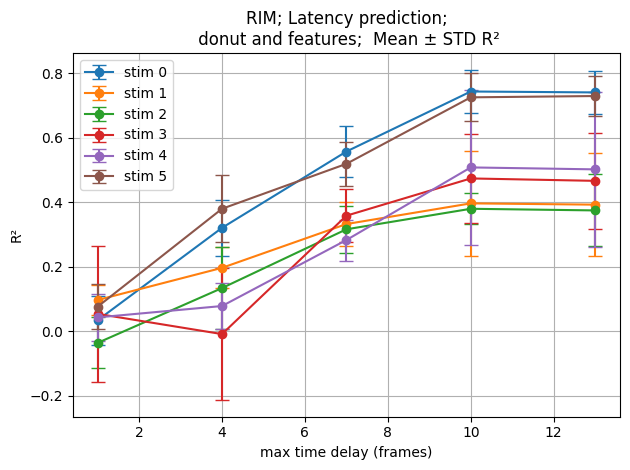

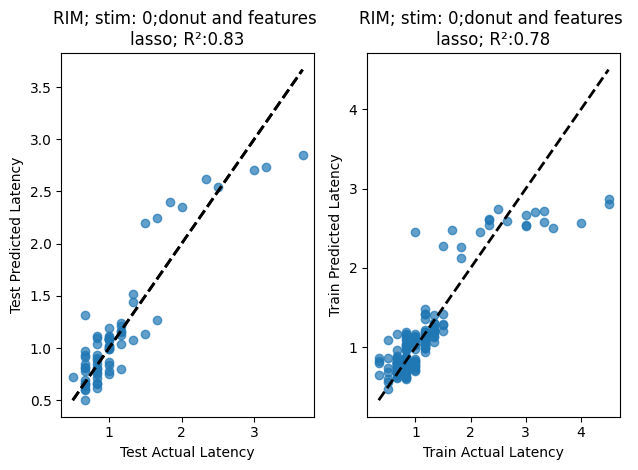

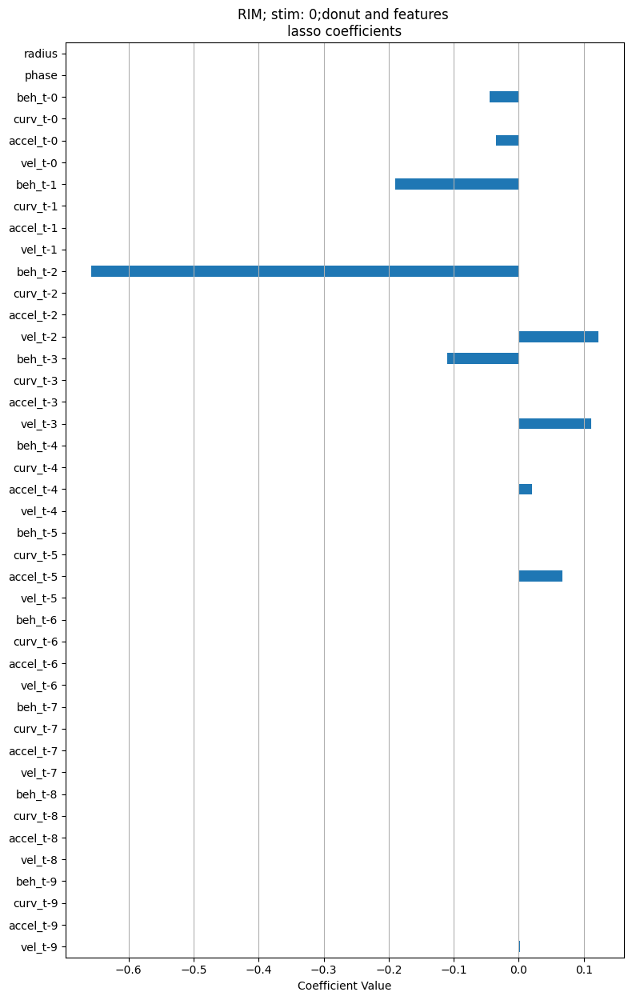

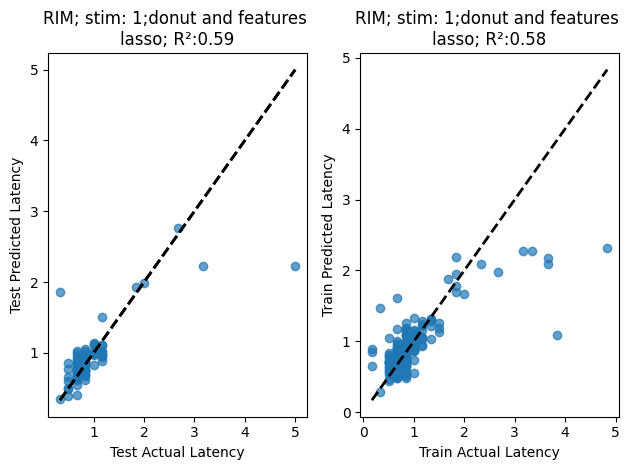

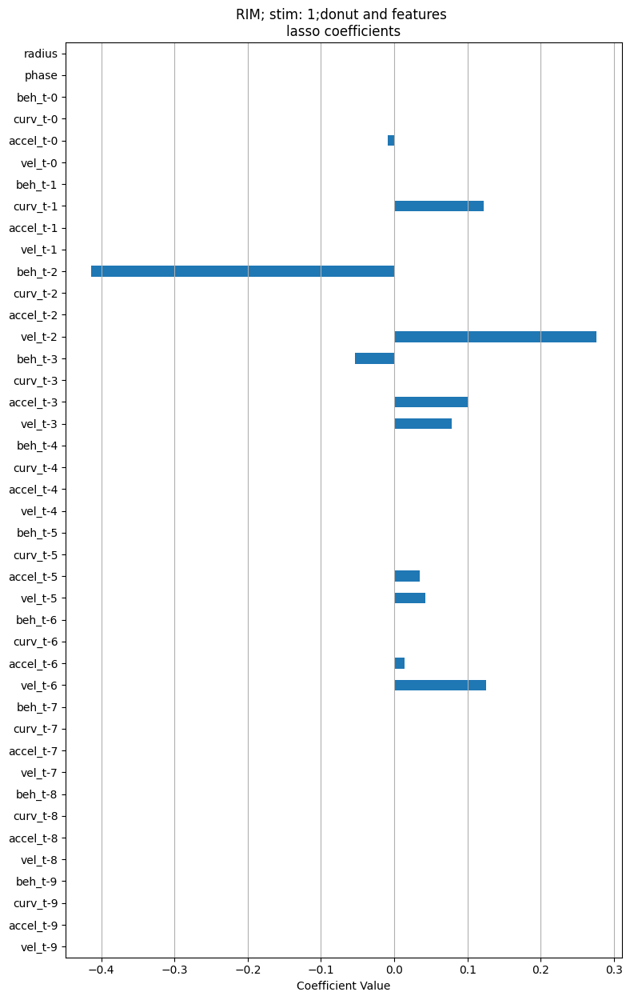

...

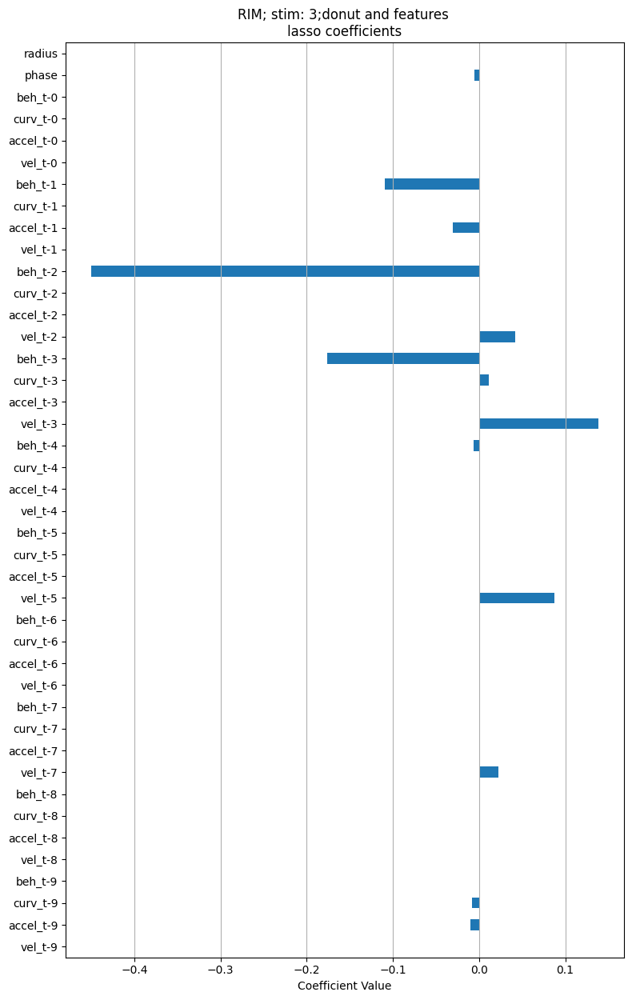

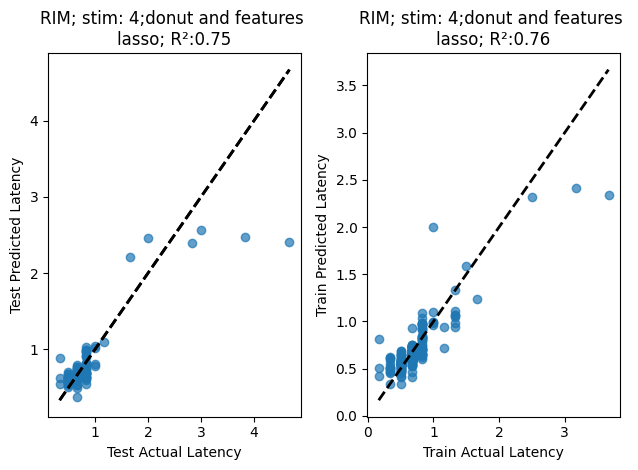

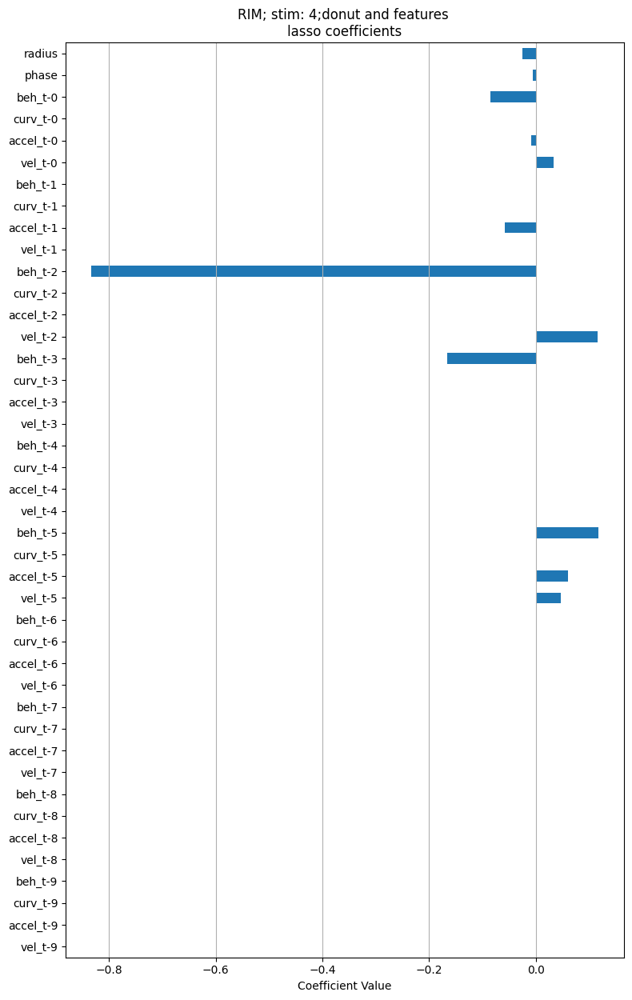

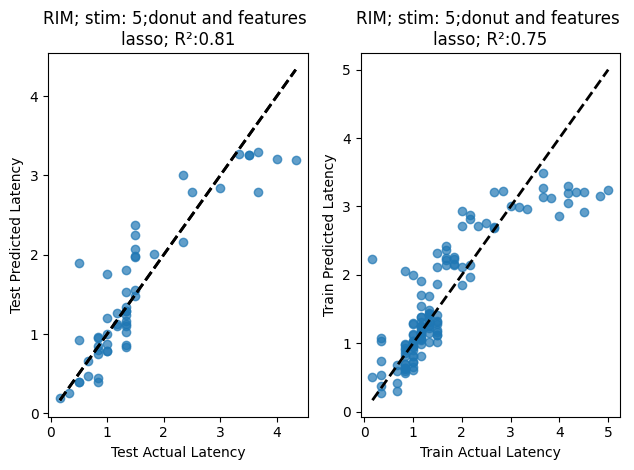

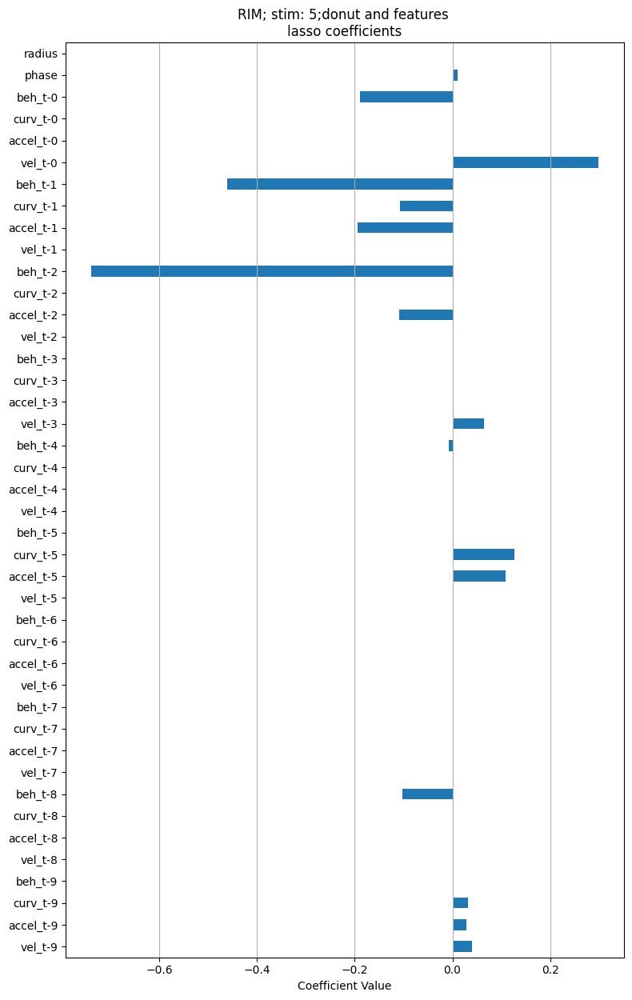

In [ ]:
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    n_tracks  = resampled_vel.shape[0]
    # phase_resampled = feature_all_to_resampled(inferred_phases_all)
    # radii_resampled = feature_all_to_resampled(inferred_rad_all) 


    n_splits = 10
    results_dict = {}  # Store mean/std r² per i and n_timesteps
    best_models = {}   # Store best model per (i, n_timesteps)
    T = 5
    lstm_lag = 5
    fig, ax = plt.subplots()
    for i, (resampled_onset, exp_onset) in enumerate(zip(resampled_onsets, exp_onsets)):
        r2_means = []
        r2_stds = []
        # all_r2_means = []
        all_r2s_per_i = {}
        n_timesteps_list = []
        onset = resampled_onset-1

        # for n_timesteps in range(5, 10, 2):
        # for n_timesteps in range(1, 15, 1):
        for n_timesteps in range(1, 15, 3):
            print(f"\nProcessing i={i}, n_timesteps={n_timesteps}")
            feature_names = np.array([[f"vel_t-{n_timesteps - t - 1}", f"accel_t-{n_timesteps - t - 1}",
                                    f"curv_t-{n_timesteps - t - 1}", f"beh_t-{n_timesteps - t - 1}"]
                                    for t in range(n_timesteps)]).flatten()


            # X_stim_all, feature_names_all = prep_FB_inputs_features_only(resampled_vel, resampled_acc, resampled_curve, resampled_rev, resampled_turn, onset, n_timesteps,   lstm_lag = lstm_lag)#shape (n_tracks, n_frames, n_features)
            X_stim_all, feature_names_all =  prep_FB_inputs_feature_and_donut(resampled_vel, resampled_acc, resampled_curve, resampled_rev, resampled_turn, inferred_phases_all, inferred_rad_all,resampled_onset, n_tracks,   n_timesteps, lstm_lag = 5)

            Y_latency = latency_to_reversal(rev_bin, exp_onset, max_latency=6 * durations[i] + 1) / 6
            valid_indices = np.argwhere((~np.isnan(Y_latency)) & (Y_latency != 0)).flatten() #non_nan_non_rev_is = np.argwhere(np.logical_and(np.logical_not(np.isnan(Y_latency)), Y_latency!=0)).flatten()
            X_stim_all_latency = X_stim_all[valid_indices]
            Y_latency_valid = Y_latency[valid_indices]

            r2s = []
            models = []

            for split_idx in range(n_splits):
                X_train, X_test, y_train, y_test = train_test_split(
                    X_stim_all_latency, Y_latency_valid, test_size=test_size, random_state=split_idx)

                alphas = np.logspace(-4, 2, 20)
                lasso = Lasso(max_iter=10000)
                grid_search = GridSearchCV(lasso, {'alpha': alphas}, cv=5, scoring='r2')
                grid_search.fit(X_train, y_train)

                best_model = grid_search.best_estimator_
                y_pred = best_model.predict(X_test)
                r2 = r2_score(y_test, y_pred)

                r2s.append(r2)
                # models.append(best_model)
                models.append((best_model,X_train, X_test, y_train, y_test))

            r2_mean = np.mean(r2s)
            r2_std = np.std(r2s)
            best_model_idx = np.argmax(r2s)
            best_model_overall = models[best_model_idx]

            # Save results
            n_timesteps_list.append(n_timesteps)
            # all_r2_means.append(r2s)
            all_r2s_per_i[(i, n_timesteps)] = r2s
            r2_means.append(r2_mean)
            r2_stds.append(r2_std)
            results_dict[(i, n_timesteps)] = (r2_mean, r2_std)
            best_models[(i, n_timesteps)] = best_model_overall

            # # Optional: Save model to disk
            # with open(f"best_model_i{i}_T{n_timesteps}.pkl", "wb") as f:
            #     pickle.dump(best_model_overall, f)

            print(f"Best split R²: {r2s[best_model_idx]:.3f}, Mean R²: {r2_mean:.3f} ± {r2_std:.3f}")


        # cmap1 = cm.get_cmap('tab10', len(resampled_onsets))
        ax.errorbar(n_timesteps_list, r2_means, yerr=r2_stds, #color=cmap1(i),
                    fmt='-o', capsize=5, label = f"stim {i}")
        # for x, n_t in enumerate(n_timesteps_list):
        #     r2s = all_r2s_per_i[(i, n_t)]
        #     plt.scatter([n_t]*len(r2s), r2s, color='gray', alpha=0.6, s=30, label='Split R²' if x == 0 else None)
        # for x, n_t in enumerate(n_timesteps_list): # plot jsut max 
        #     r2s = all_r2s_per_i[(i, n_t)]
        #     ax.scatter(n_t, max(r2s), color=cmap1(i), alpha=0.6, s=30, marker='^', facecolors='none', edgecolors=color, label='Split R²' if x == 0 else None)
        ax.set_title(f"{neuron}; Latency prediction;\n donut and features;  Mean ± STD R²")
        ax.set_xlabel("max time delay (frames)")
        ax.set_ylabel("R²")
    ax.legend()
    plt.grid(True)
    plt.tight_layout()
    # plt.savefig(f"r2_plot_i{i}.png")
    # plt.close()



        
        
    n_timesteps = 10
    # feature_names = np.array([[f"vel_t-{n_timesteps - t - 1}", f"accel_t-{n_timesteps - t - 1}",
    #                             f"curv_t-{n_timesteps - t - 1}", f"beh_t-{n_timesteps - t - 1}"]
    #                             for t in range(n_timesteps)]).flatten()
    for i in range(len(resampled_onsets)):
        model,X_train, X_test, y_train, y_test = best_models[(i, n_timesteps)] 
        
        # print("Best alpha lasso:", grid_search_lasso.best_params_['alpha'])
        # print("Best CV R²:", grid_search_lasso.best_score_)
        # alpha = grid_search_lasso.best_params_['alpha']
        # model = Lasso(alpha=alpha)  # You can tune alpha with CV
        X_stim_features, feature_names = prep_FB_inputs_features_only(resampled_vel, resampled_acc, resampled_curve, resampled_rev, resampled_turn, resampled_onset,   n_timesteps, lstm_lag = lstm_lag)#shape (n_tracks, n_frames, n_features)
        X_donut_stim, donut_names = prep_FB_inputs_donut_only( inferred_phases_all, inferred_rad_all, resampled_onset, n_tracks)
        X_stim_all =  np.concatenate([X_stim_features ,  X_donut_stim], axis = 1)
        feature_names_all = np.array(feature_names.tolist()+donut_names)
        model_label= f"{neuron}; stim: {i};donut and features \nlasso"#_a{np.round(alpha,2)}"#; lasso_a{np.round(alpha,2)}"
        visualize_model_regression(model, model_label, feature_names_all, X_train, X_test, y_train, y_test, n_timesteps,  feature_names_ordered = False)#, xlim = [-2,1])



Processing i=0, n_timesteps=0
n_timesteps 459
n_timesteps 459
Best split R²: 0.138, Mean R²: 0.024 ± 0.057

Processing i=1, n_timesteps=0
n_timesteps 459
n_timesteps 459
Best split R²: 0.021, Mean R²: -0.020 ± 0.035

Processing i=2, n_timesteps=0
n_timesteps 459
n_timesteps 459
Best split R²: 0.038, Mean R²: -0.014 ± 0.044

Processing i=3, n_timesteps=0
n_timesteps 459
n_timesteps 459
Best split R²: 0.057, Mean R²: 0.023 ± 0.020

Processing i=4, n_timesteps=0
n_timesteps 459
n_timesteps 459
Best split R²: -0.001, Mean R²: -0.047 ± 0.060

Processing i=5, n_timesteps=0
n_timesteps 459
n_timesteps 459
Best split R²: 0.013, Mean R²: -0.015 ± 0.016


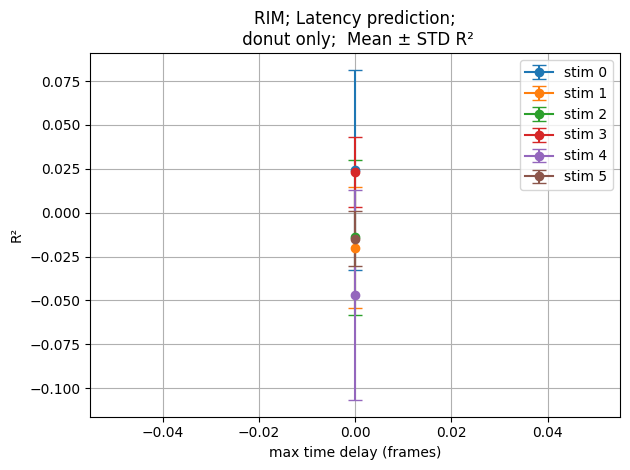

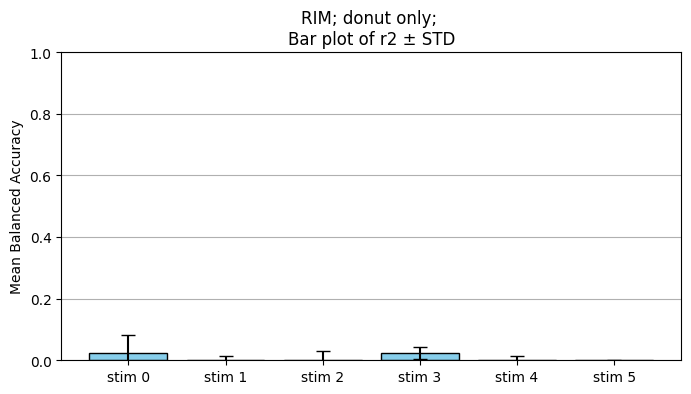

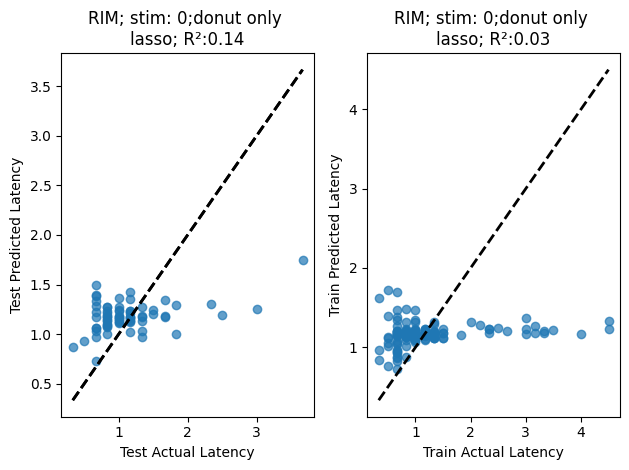

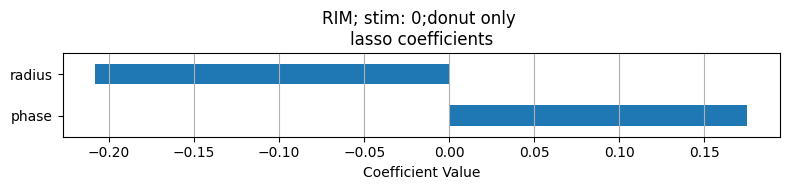

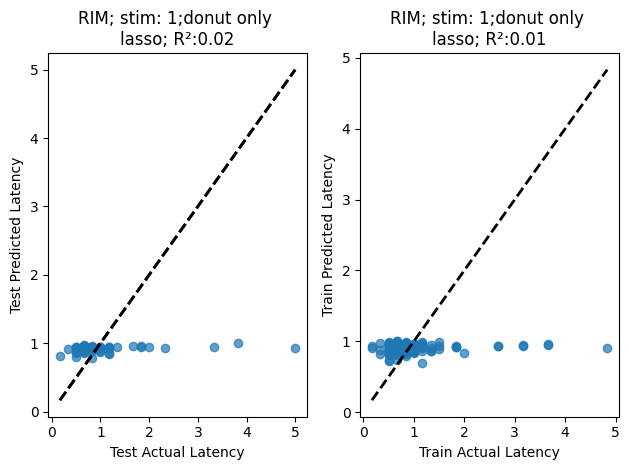

...

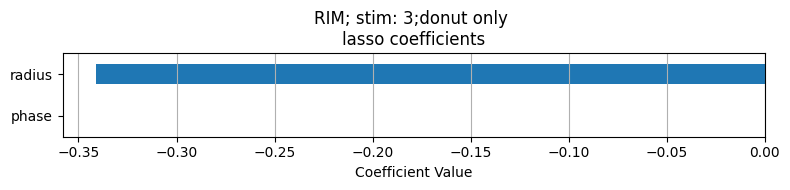

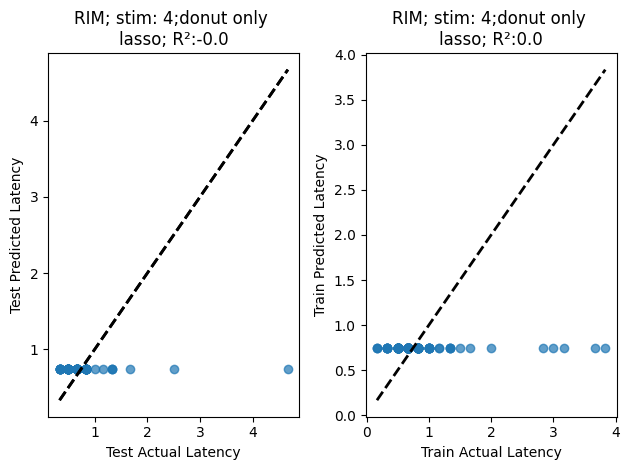

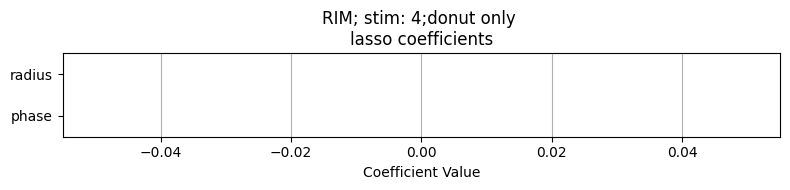

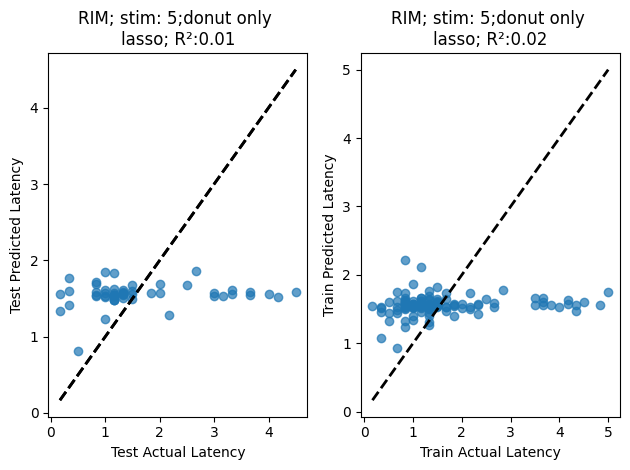

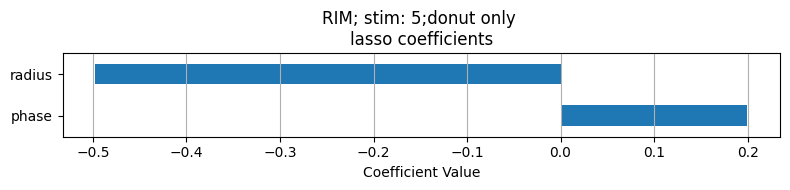

In [ ]:
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    n_tracks  = resampled_vel.shape[0]
    # phase_resampled = feature_all_to_resampled(inferred_phases_all)
    # radii_resampled = feature_all_to_resampled(inferred_rad_all) 


    n_splits = 10
    results_dict = {}  # Store mean/std r² per i and n_timesteps
    best_models = {}   # Store best model per (i, n_timesteps)
    T = 5
    lstm_lag = 5
    fig, ax = plt.subplots()
    for i, (resampled_onset, exp_onset) in enumerate(zip(resampled_onsets, exp_onsets)):
        r2_means = []
        r2_stds = []
        # all_r2_means = []
        all_r2s_per_i = {}
        n_timesteps_list = []
        onset = resampled_onset-1

        # for n_timesteps in range(5, 10, 2):
        # for n_timesteps in range(1, 15, 1):
        # for n_timesteps in range(1, 15, 3):
        n_timesteps = 0
        print(f"\nProcessing i={i}, n_timesteps={n_timesteps}")
        feature_names = np.array([[f"vel_t-{n_timesteps - t - 1}", f"accel_t-{n_timesteps - t - 1}",
                                f"curv_t-{n_timesteps - t - 1}", f"beh_t-{n_timesteps - t - 1}"]
                                for t in range(n_timesteps)]).flatten()


        # X_stim_all, feature_names_all = prep_FB_inputs_features_only(resampled_vel, resampled_acc, resampled_curve, resampled_rev, resampled_turn, onset, n_timesteps,   lstm_lag = lstm_lag)#shape (n_tracks, n_frames, n_features)
        # X_stim_all, feature_names_all =  prep_FB_inputs_feature_and_donut(resampled_vel, resampled_acc, resampled_curve, resampled_rev, resampled_turn, inferred_phases_all, inferred_rad_all,resampled_onset, n_tracks,   n_timesteps, lstm_lag = 5)
        X_stim_all, feature_names_all = prep_FB_inputs_donut_only( inferred_phases_all, inferred_rad_all, onset, n_tracks)

        Y_latency = latency_to_reversal(rev_bin, exp_onset, max_latency=6 * durations[i] + 1) / 6
        valid_indices = np.argwhere((~np.isnan(Y_latency)) & (Y_latency != 0)).flatten() #non_nan_non_rev_is = np.argwhere(np.logical_and(np.logical_not(np.isnan(Y_latency)), Y_latency!=0)).flatten()
        X_stim_all_latency = X_stim_all[valid_indices]
        Y_latency_valid = Y_latency[valid_indices]

        r2s = []
        models = []

        for split_idx in range(n_splits):
            X_train, X_test, y_train, y_test = train_test_split(
                X_stim_all_latency, Y_latency_valid, test_size=test_size, random_state=split_idx)

            alphas = np.logspace(-4, 2, 20)
            lasso = Lasso(max_iter=10000)
            grid_search = GridSearchCV(lasso, {'alpha': alphas}, cv=5, scoring='r2')
            grid_search.fit(X_train, y_train)

            best_model = grid_search.best_estimator_
            y_pred = best_model.predict(X_test)
            r2 = r2_score(y_test, y_pred)

            r2s.append(r2)
            # models.append(best_model)
            models.append((best_model,X_train, X_test, y_train, y_test))

        r2_mean = np.mean(r2s)
        r2_std = np.std(r2s)
        best_model_idx = np.argmax(r2s)
        best_model_overall = models[best_model_idx]

        # Save results
        n_timesteps_list.append(n_timesteps)
        # all_r2_means.append(r2s)
        all_r2s_per_i[(i, n_timesteps)] = r2s
        r2_means.append(r2_mean)
        r2_stds.append(r2_std)
        results_dict[(i, n_timesteps)] = (r2_mean, r2_std)
        best_models[(i, n_timesteps)] = best_model_overall

        # # Optional: Save model to disk
        # with open(f"best_model_i{i}_T{n_timesteps}.pkl", "wb") as f:
        #     pickle.dump(best_model_overall, f)

        print(f"Best split R²: {r2s[best_model_idx]:.3f}, Mean R²: {r2_mean:.3f} ± {r2_std:.3f}")


        # cmap1 = cm.get_cmap('tab10', len(resampled_onsets))
        ax.errorbar(n_timesteps_list, r2_means, yerr=r2_stds, #color=cmap1(i),
                    fmt='-o', capsize=5, label = f"stim {i}")
        # for x, n_t in enumerate(n_timesteps_list):
        #     r2s = all_r2s_per_i[(i, n_t)]
        #     plt.scatter([n_t]*len(r2s), r2s, color='gray', alpha=0.6, s=30, label='Split R²' if x == 0 else None)
        # for x, n_t in enumerate(n_timesteps_list): # plot jsut max 
        #     r2s = all_r2s_per_i[(i, n_t)]
        #     ax.scatter(n_t, max(r2s), color=cmap1(i), alpha=0.6, s=30, marker='^', facecolors='none', edgecolors=color, label='Split R²' if x == 0 else None)
        ax.set_title(f"{neuron}; Latency prediction;\n donut only;  Mean ± STD R²")
        ax.set_xlabel("max time delay (frames)")
        ax.set_ylabel("R²")
        
    ax.legend()
    plt.grid(True)
    plt.tight_layout()
    # plt.savefig(f"r2_plot_i{i}.png")
    # plt.close()
    
            
    fig_bar, ax_bar = plt.subplots(figsize=(8, 4))
    # Collect bar plot data
    x_vals = list(range(len(resampled_onsets)))  # i values
    bar_heights = [results_dict[(i, 0)][0] for i in x_vals]  # mean balanced accuracy
    bar_errors = [results_dict[(i, 0)][1] for i in x_vals]  # std 

    # Create bar plot
    ax_bar.bar(x_vals, bar_heights, yerr=bar_errors, capsize=5, color='skyblue', edgecolor='k')
    ax_bar.set_xticks(x_vals)
    ax_bar.set_xticklabels([f"stim {i}" for i in x_vals])
    ax_bar.set_ylabel("Mean Balanced Accuracy")
    ax_bar.set_title(f"{neuron}; donut only; \nBar plot of r2 ± STD")
    ax_bar.set_ylim(0, 1)
    ax_bar.grid(True, axis='y')




        
        
    n_timesteps = 0

    for i in range(len(resampled_onsets)):
        model,X_train, X_test, y_train, y_test = best_models[(i, n_timesteps)] 
        
        # print("Best alpha lasso:", grid_search_lasso.best_params_['alpha'])
        # print("Best CV R²:", grid_search_lasso.best_score_)
        # alpha = grid_search_lasso.best_params_['alpha']
        # model = Lasso(alpha=alpha)  # You can tune alpha with CV

        model_label= f"{neuron}; stim: {i};donut only \nlasso"#_a{np.round(alpha,2)}"#; lasso_a{np.round(alpha,2)}"
        visualize_model_regression(model, model_label, feature_names_all, X_train, X_test, y_train, y_test, n_timesteps,  feature_names_ordered = False)#, xlim = [-2,1])

4; 1; logisticAccuracy: 0.9609375
4; 1; logisticPrecision: 0.92340087890625
4; 1; logisticRecall: 0.9609375
4; 1; logisticF1 Score: 0.9417953187250996
4;1; linear svc l1Accuracy: 0.9609375
4;1; linear svc l1Precision: 0.92340087890625
4;1; linear svc l1Recall: 0.9609375
4;1; linear svc l1F1 Score: 0.9417953187250996


/Users/friederikebuck/miniconda3/envs/DLC_YOLO_GUI/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/friederikebuck/miniconda3/envs/DLC_YOLO_GUI/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Best C: 0.001
Best CV accuracy: 0.5
4;1; linear svc l1 c 0.001Accuracy: 0.0390625
4;1; linear svc l1 c 0.001Precision: 0.00152587890625
4;1; linear svc l1 c 0.001Recall: 0.0390625
4;1; linear svc l1 c 0.001F1 Score: 0.0029370300751879698
4; 1; tree no max depthAccuracy: 0.921875
4; 1; tree no max depthPrecision: 0.921875
4; 1; tree no max depthRecall: 0.921875
4; 1; tree no max depthF1 Score: 0.921875


/Users/friederikebuck/miniconda3/envs/DLC_YOLO_GUI/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


4; 1; tree max depth = 3Accuracy: 0.953125
4; 1; tree max depth = 3Precision: 0.9231053149606299
4; 1; tree max depth = 3Recall: 0.953125
4; 1; tree max depth = 3F1 Score: 0.937875
4; 1; SVC rbf kernelAccuracy: 0.9609375
4; 1; SVC rbf kernelPrecision: 0.92340087890625
4; 1; SVC rbf kernelRecall: 0.9609375
4; 1; SVC rbf kernelF1 Score: 0.9417953187250996


/Users/friederikebuck/miniconda3/envs/DLC_YOLO_GUI/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Best alpha lasso: 0.06951927961775606
Best CV R²: -0.041714940634256514


/var/folders/8z/xy4sl8b90qnc_x9p_4psrnmh0000gn/T/ipykernel_7228/3247618565.py:153: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axs = plt.subplots(1,2)


4; 3; logisticAccuracy: 0.9609375
4; 3; logisticPrecision: 0.92340087890625
4; 3; logisticRecall: 0.9609375
4; 3; logisticF1 Score: 0.9417953187250996
4;3; linear svc l1Accuracy: 0.9609375
4;3; linear svc l1Precision: 0.92340087890625
4;3; linear svc l1Recall: 0.9609375
4;3; linear svc l1F1 Score: 0.9417953187250996


/Users/friederikebuck/miniconda3/envs/DLC_YOLO_GUI/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/friederikebuck/miniconda3/envs/DLC_YOLO_GUI/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/friederikebuck/miniconda3/envs/DLC_YOLO_GUI/lib/python3.9/site-packages/sklearn/svm/_base.py:1250: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/friederikebuck/miniconda3/envs/DLC_YOLO_GUI/lib/python3.9/site-packages/sklearn/svm/_base.py:1250: Convergenc

Best C: 0.001
Best CV accuracy: 0.5
4;3; linear svc l1 c 0.001Accuracy: 0.0390625
4;3; linear svc l1 c 0.001Precision: 0.00152587890625
4;3; linear svc l1 c 0.001Recall: 0.0390625
4;3; linear svc l1 c 0.001F1 Score: 0.0029370300751879698
4; 3; tree no max depthAccuracy: 0.8984375
4; 3; tree no max depthPrecision: 0.9208984375
4; 3; tree no max depthRecall: 0.8984375
4; 3; tree no max depthF1 Score: 0.9095293209876544
4; 3; tree max depth = 3Accuracy: 0.9453125
4; 3; tree max depth = 3Precision: 0.9228050595238095
4; 3; tree max depth = 3Recall: 0.9453125
4; 3; tree max depth = 3F1 Score: 0.9339231927710844
4; 3; SVC rbf kernelAccuracy: 0.9609375
4; 3; SVC rbf kernelPrecision: 0.92340087890625
4; 3; SVC rbf kernelRecall: 0.9609375
4; 3; SVC rbf kernelF1 Score: 0.9417953187250996


/Users/friederikebuck/miniconda3/envs/DLC_YOLO_GUI/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


KeyboardInterrupt: 

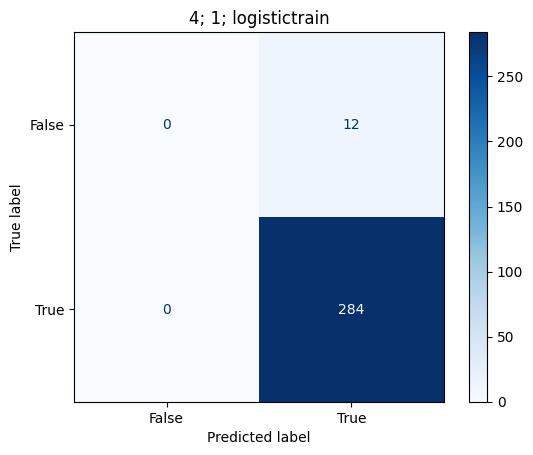

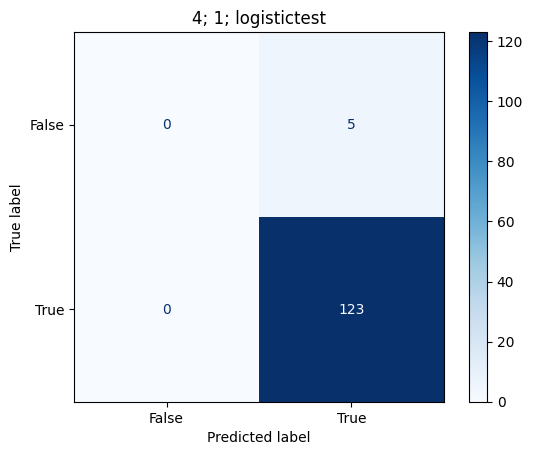

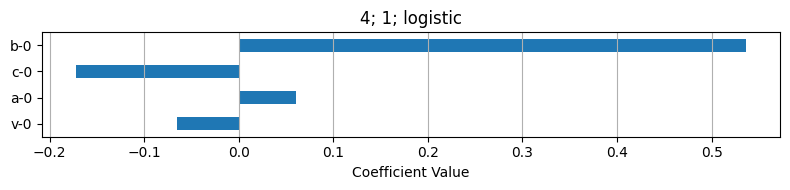

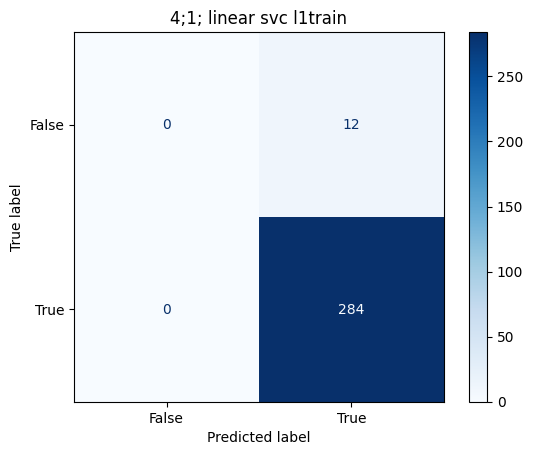

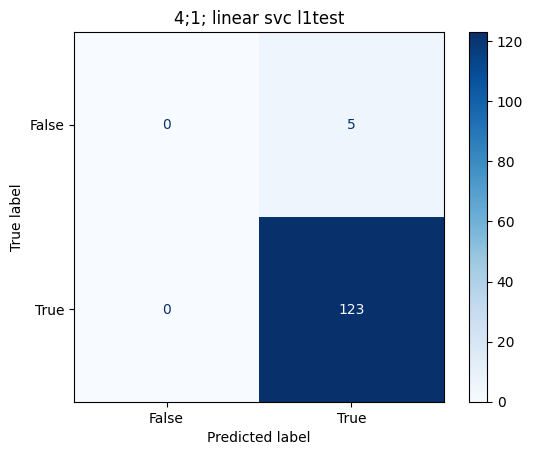

...

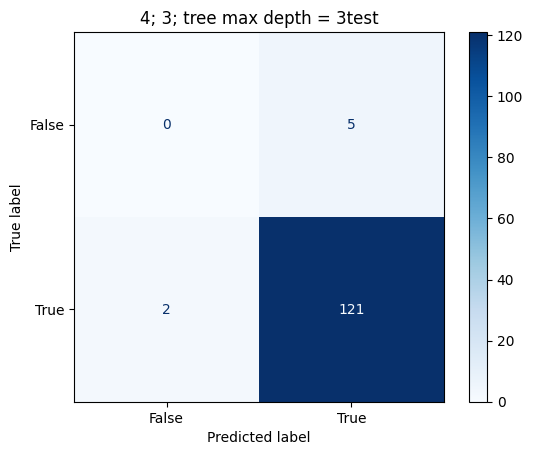

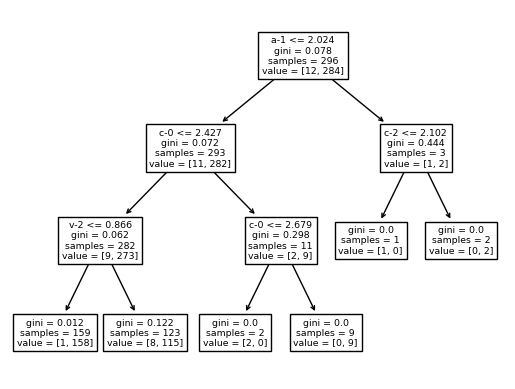

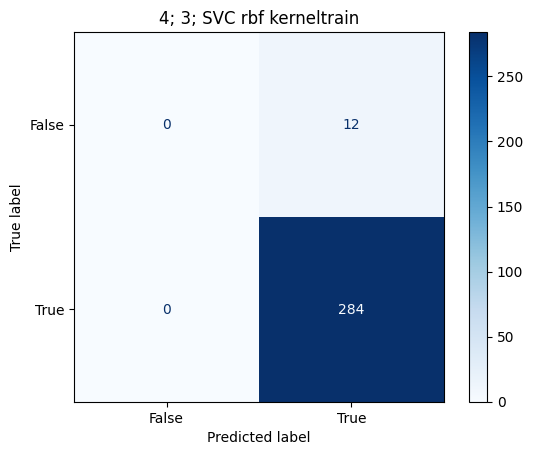

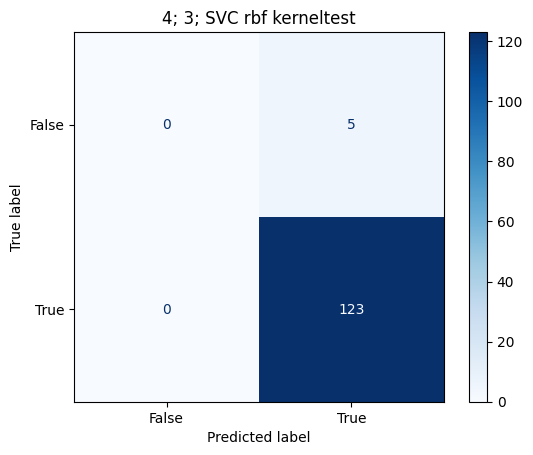

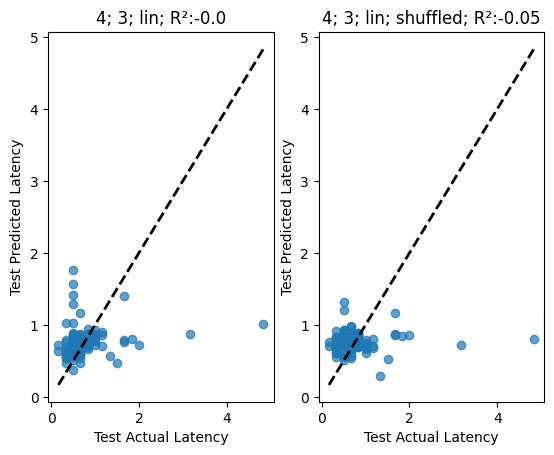

In [ ]:
import pandas as pd 
###get inputs into lstm 
beh_map = [z_norm.min(), z_norm.min()/2 + z_norm.max()/2, z_norm.max()]

# def prep_FB_inputs(resampled_vel, resampled_acc, resampled_curve, resampled_rev, resampled_turn,  n_timesteps= 5
#                 #    times, beh_map, 
#                 #    lag=16, inclusion_thresh =3, 
#                 #    remove_revs=False, 
                  
#                    ): 
#     #num time lags

#     # if remove_revs:
#     #     rev_id = beh_map[1]
#     # else:
#     #     rev_id = 100000

#     behavior_input = np.array(resampled_rev+2*resampled_turn, dtype=np.float64)
#     behavior_input -= np.array(z).mean()
#     behavior_input /= np.array(z).std()

#     # inferred_phases = np.zeros((len(times), len(resampled_vel))) +np.nan
#     # inferred_rad = np.zeros((len(times), len(resampled_vel))) +np.nan
#     # final_behaviors = np.zeros((len(times), len(resampled_vel))) +np.nan
#     # initial_behaviors = np.zeros((len(times), len(resampled_vel))) +np.nan
#     # initial_cts_beh = np.zeros((len(times), len(resampled_vel))) +np.nan

#     # final_behaviors_all = []
#     # inferred_phases_all = []
#     # inferred_rad_all = []
#     # behaviors_all = []
#     X_all_LSTM = []
#     for new_worm_idx in range(len(resampled_vel)):
       
#         X_new_worm = np.stack([resampled_vel[new_worm_idx], resampled_acc[new_worm_idx], resampled_curve[new_worm_idx], behavior_input[new_worm_idx]], axis=1)  
#         # X_new_worm = np.stack([resampled_vel[new_worm_idx], resampled_acc[new_worm_idx], behavior_input[new_worm_idx]], axis=1)  
#         X_new_tensor = torch.tensor(X_new_worm, dtype=torch.float32)
        
#         if n_timesteps> 0:
#             X_new_seq1 = create_X_sequences(X_new_tensor, n_timesteps).numpy() #torch.Size([475, 5, 4]), = n_frames, time delay, 4 is the feature  #
#         else: 
#             X_new_seq1 = X_new_tensor.numpy()
        
#         n_frames, delay, n_features = X_new_seq1.shape
#         X_new_seq1 = X_new_seq1.reshape((n_frames,  delay*n_features)) # check how this is shaped it will be f1_t-T, f2_t-T, f3_t-T, f4_t-T, ; f1_t-T+1, f2_T+1, f3_T+1 f4_T+1
        
#         # # Normalize the inputs
#         # X_train_mean, X_train_std = X_new_seq1.mean(axis=0), X_new_seq1.std(axis=0)
#         # if normalize:
#         #     X_new_seq1 = (X_new_seq1 - X_train_mean) / (X_train_std + 1e-8)  
            
#         X_all_LSTM.append(X_new_seq1)
#     # X_all_LSTM = np.concatenate(X_all_LSTM, axis = 1 ) # i guess should check if reshape how it reshapes.. ie if feautres are all together or not 
#     X_all_LSTM = np.array(X_all_LSTM)#shape (n_tracks, n_frames, n_features)
#     return X_all_LSTM






if experiment == "time_titration":
    durations = [1,3,5,10]
else:
    durations = [5,5,5,5,5,5]
    if experiment == "hiscl":
        durations = [5,5]
        

# def plot_results_regression(model, model_label, feature_names, X_train, X_test, y_train, y_test, n_time_steps, feature_names_ordered = None):
#     model.fit(X_train, y_train)
#     y_pred = model.predict(X_test)
#     fig, ax = plt.subplots()
#     ax.scatter(y_test, y_pred, alpha=0.7)
#     ax.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2)
#     ax.set_xlabel("Test Actual Latency (s) ")
#     ax.set_ylabel("Test Predicted Latency (s) ")
#     ax.set_title( f"{model_label}; R²:{model.score(X_test, y_test)}")
#     ax.set_ylim([0,6])
#     ax.set_xlim([0,6])
    
    
    
#     y_pred = model.predict(X_train)
#     fig, ax = plt.subplots()
#     ax.scatter(y_train, y_pred, alpha=0.7)
#     ax.plot([y_train.min(), y_train.max()], [y_train.min(), y_train.max()], 'k--', lw=2)
#     ax.set_xlabel("Train Actual Latency (s) ")
#     ax.set_ylabel("Train Predicted Latency (s) ")
#     ax.set_title( f"{model_label}; R²:{model.score(X_train, y_train)}")
#     ax.set_ylim([0,6])
#     ax.set_xlim([0,6])
    
#     plot_coeffs(model, feature_names,model_label,n_time_steps,   feature_names_ordered = feature_names_ordered)
    
    

  
    
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LinearRegression, Lasso, TweedieRegressor
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn import tree
##get latency and features for each stim 
# random_state = 42
# test_size = 0.2

random_state = 30
test_size = 0.3

feature_names_ordered = True

resampled_onsets= onsets
for n_timesteps in range(1, 10, 2 ):
    feature_names = np.array([[f"v-{n_timesteps-t-1}", f"a-{n_timesteps-t-1}", f"c-{n_timesteps-t-1}", f"b-{n_timesteps-t-1}"] for t in range(n_timesteps)]).flatten()
    # feature_names_ordered = np.array([[f"v-{T-t-1}", f"a-{T-t-1}", f"c-{T-t-1}", f"b-{T-t-1}"] for t in range(0,n_timesteps)]).reshape((len(feature_names), -1), order='F').flatten()
    X_stim = prep_FB_inputs(resampled_vel, resampled_acc, resampled_curve, resampled_rev, resampled_turn,  n_timesteps= n_timesteps ) #shape (n_tracks, n_frames, n_features)
    # X_stim = [X_all_LSTM[i].numpy() for i in range(len(X_all_LSTM))]
    rev_bin = exp_behaviors
    for i, (resampled_onset, exp_onset) in [list(enumerate(zip(resampled_onsets, exp_onsets)))[4]]:
        X_stim_all =X_stim[:, resampled_onset-T-1, :]# X_all_LSTM[resampled_onset-T, :]
        # Get rid of already reversing guys###

        Y_latency = latency_to_reversal(rev_bin, exp_onset, max_latency = 6*durations[i]+1)/6 # nan where not 
        no_rev_at_onset = Y_latency!=0
        
        Y_prob = np.logical_not(np.isnan(Y_latency[no_rev_at_onset]))# classfy y/n did rev happen
        X_prob = copy.deepcopy(X_stim_all[no_rev_at_onset])
        
        ###    
        X_train, X_test, y_train, y_test = train_test_split(X_prob, Y_prob, test_size=test_size, random_state=random_state)
        model = LogisticRegression(max_iter=1000, random_state=random_state)#, class_weight="balanced")
        model_label = f"{i}; {n_timesteps}; logistic"
        fit_visualize_model_classifiction(model, model_label, feature_names, X_train, X_test, y_train, y_test, n_timesteps, feature_names_ordered = feature_names_ordered)

        
        
        model = LinearSVC(penalty='l1', dual=False, max_iter=10000)
        model_label = f"{i};{n_timesteps}; linear svc l1"
        fit_visualize_model_classifiction(model, model_label, feature_names, X_train, X_test, y_train, y_test, n_timesteps, feature_names_ordered = feature_names_ordered)
        # Grid of C values to search
        param_grid = {
            'C': [0.001, 0.01, 0.1, 1, 10, 100]
        }

        model = LinearSVC(penalty='l1', dual=False, max_iter=10000)
        # Grid search
        grid = GridSearchCV(model, param_grid, cv=5, scoring='balanced_accuracy')
        grid.fit(X_train, y_train)

        # Best parameters and score
        print("Best C:", grid.best_params_['C'])
        print("Best CV accuracy:", grid.best_score_)
        c = grid.best_params_['C']
        model = LinearSVC(penalty='l1', dual=False, max_iter=10000, C = c)
        model_label = f"{i};{n_timesteps}; linear svc l1 c {c}"
        fit_visualize_model_classifiction(model, model_label, feature_names, X_train, X_test, y_train, y_test, n_timesteps, feature_names_ordered = feature_names_ordered)
        
        model = tree.DecisionTreeClassifier()
        model_label = f"{i}; {n_timesteps}; tree no max depth"
        model, y_pred = fit_visualize_model_classifiction(model, model_label, feature_names, X_train, X_test, y_train, y_test, n_timesteps, get_coeff = False, feature_names_ordered = feature_names_ordered)
        fig, ax = plt.subplots()
        tree.plot_tree(model, feature_names = feature_names)
        
        model = tree.DecisionTreeClassifier(max_depth=3)
        model_label = f"{i}; {n_timesteps}; tree max depth = 3"
        model, y_pred = fit_visualize_model_classifiction(model, model_label, feature_names, X_train, X_test, y_train, y_test, n_timesteps,  get_coeff = False, feature_names_ordered = feature_names_ordered)
        fig, ax = plt.subplots()
        tree.plot_tree(model, feature_names = feature_names)
        
        model = svm.SVC()
        model_label = f"{i}; {n_timesteps}; SVC rbf kernel"
        model, y_pred = fit_visualize_model_classifiction(model, model_label, feature_names, X_train, X_test, y_train, y_test, n_timesteps, get_coeff = False, feature_names_ordered = feature_names_ordered)

        
        ###########try latency 
        
        non_nan_non_rev_is = np.argwhere(np.logical_and(np.logical_not(np.isnan(Y_latency)), Y_latency!=0)).flatten()
        X_stim_all_latency = X_stim_all[non_nan_non_rev_is]# classfy y/n did stim happen
        Y_latency = Y_latency[non_nan_non_rev_is]
        
        X_train, X_test, y_train, y_test = train_test_split(X_stim_all_latency, Y_latency, test_size=test_size, random_state=random_state)

        model = LinearRegression()
        model_label= f"{i}; {n_timesteps}; lin"
        fit_visualize_model_regression(model, model_label, feature_names, X_train, X_test, y_train, y_test, n_timesteps, feature_names_ordered = feature_names_ordered)
        # model_lr.fit(X_train, y_train)
        # print("Linear Regression R²:", model_lr.score(X_test, y_test))
        # print("Coefficients:", model_lr.coef_)
        
        alphas = np.logspace(-4, 2, 20)
        lasso = Lasso(max_iter=10000)
        param_grid = {'alpha': alphas}
        grid_search_lasso = GridSearchCV(lasso, param_grid, cv=5, scoring='r2')
        grid_search_lasso.fit(X_train, y_train)

        best_lasso = grid_search_lasso.best_estimator_

        print("Best alpha lasso:", grid_search_lasso.best_params_['alpha'])
        print("Best CV R²:", grid_search_lasso.best_score_)
        alpha = grid_search_lasso.best_params_['alpha']
        model = Lasso(alpha=alpha)  # You can tune alpha with CV
        model_label= f"{i};{n_timesteps}; lasso_a{np.round(alpha,2)}"
        fit_visualize_model_regression(model, model_label, feature_names, X_train, X_test, y_train, y_test, n_timesteps,  feature_names_ordered = feature_names_ordered)
        
        
        # model_lasso.fit(X_train, y_train)
        
        # print("Lasso R²:", model_lasso.score(X_test, y_test))
        # print("Coefficients:", model_lasso.coef_)# Range of alpha values to try (log scale)
        
        # Gamma regression
        #If your latencies are tightly distributed, or variance is constant → LinearRegression or Lasso
        # If variance grows with latency (heteroscedasticity) → TweedieRegressor(power=2)
        
        # param_grid = {
        #     'alpha': np.logspace(-4, 2, 10),  # Try a wide range
        # }

        # model = TweedieRegressor(power=2, alpha=0.0, link='log')  # log link enforces positivity
        # model_label=f"{i};gamma_a0.0"
        # fit_visualize_model_regression(model, model_label, feature_names, X_train, X_test, y_train, y_test)
        # grid_search_lasso = GridSearchCV(model, param_grid, cv=5, scoring='r2')
        # grid_search_lasso.fit(X_train, y_train)
        # best_lasso = grid_search_lasso.best_estimator_

        # print("Best alpha gamma:", grid_search_lasso.best_params_['alpha'])
        # print("Best CV R²:", grid_search_lasso.best_score_)
        # alpha = grid_search_lasso.best_params_['alpha']
        # model = Lasso(alpha=alpha)  # You can tune alpha with CV
        # model_label= f"{i};gamma_a{np.round(alpha,2)}"
        # fit_visualize_model_regression(model, model_label, feature_names, X_train, X_test, y_train, y_test)
        
        
        # model_gamma.fit(X_train, y_train)
        # print("Gamma GLM R²:", model_gamma.score(X_train, y_test))
        # print("Coefficients:", model_gamma.coef_)
        
        
        
        # ###########
        # ####scaled
        # scaler = StandardScaler()
        # X_train_scaled = scaler.fit_transform(X_train)
        # X_train = X_train_scaled
        # X_test_scaled = scaler.transform(X_test)
        
        
        # model = LinearRegression()
        # model_label= f"{i};lin;scaled"
        # fit_visualize_model_regression(model, model_label, feature_names, X_train_scaled, X_test_scaled, y_train, y_test)
        # # model_lr.fit(X_train, y_train)
        # # print("Linear Regression R²:", model_lr.score(X_test, y_test))
        # # print("Coefficients:", model_lr.coef_)

        
        # alphas = np.logspace(-4, 2, 20)
        # lasso = Lasso(max_iter=10000)
        # param_grid = {'alpha': alphas}
        # grid_search_lasso = GridSearchCV(lasso, param_grid, cv=5, scoring='r2')
        # grid_search_lasso.fit(X_train, y_train)

        # best_lasso = grid_search_lasso.best_estimator_

        # # print("Best alpha:", grid_search_lasso.best_params_['alpha'])
        # # print("Best CV R²:", grid_search_lasso.best_score_)
        # alpha = grid_search_lasso.best_params_['alpha']
        # model = Lasso(alpha=alpha)  # You can tune alpha with CV
        # model_label= f"{i}; scaled;lasso_a{np.round(alpha,2)}"
        # fit_visualize_model_regression(model, model_label, feature_names,X_train_scaled, X_test_scaled, y_train, y_test)
        
        
        # # model_lasso.fit(X_train, y_train)
        
        # # print("Lasso R²:", model_lasso.score(X_test, y_test))
        # # print("Coefficients:", model_lasso.coef_)# Range of alpha values to try (log scale)
        
        # # Gamma regression
        # #If your latencies are tightly distributed, or variance is constant → LinearRegression or Lasso
        # # If variance grows with latency (heteroscedasticity) → TweedieRegressor(power=2)
        # model = TweedieRegressor(power=2, alpha=0.0, link='log')  # log link enforces positivity
        # model_label=f"{i};scaled; gamma"
        # fit_visualize_model_regression(model, model_label, feature_names,X_train_scaled, X_test_scaled, y_train, y_test)
        break
        
        ##try gam 
        
    


In [ ]:
print(resampled_rev.shape)

(347, 480)


In [ ]:

# np.array([[f"v-{T-t+1}", f"a-{T-t+1}", f"c-{T-t+1}", f"b-{T-t+1}"] for t in range(0,T)]).flatten()
print(feature_names_ordered)

True


# simulate data

In [ ]:
try: #no need to redo it
    final_behs
except:
    final_behs = simulate_exp([0,1,3,5], input_durs=[8], neuron=neuron, input_dict = input_dict,new_slds = new_slds, q_x = q_x, pca=pca,  total_dur=8, thresh=2, remove_rev=False)

# plot

(0.0, 40.0)

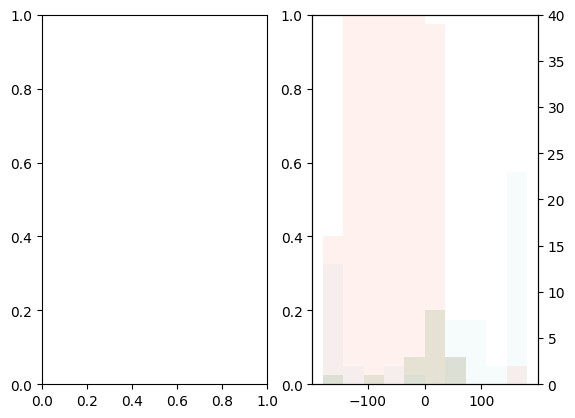

In [ ]:
fig,ax_2 = plt.subplots(1,2)
ax2 = ax_2[1].twinx()
idxs=[0,-1]
transformed_angles = np.degrees(np.concatenate(inferred_phases[[idxs]]))
# transformed_angles = (transformed_angles)%360 - 180
behs = np.concatenate(initial_behaviors[[idxs]])
beh_map = [z_norm.min(), z_norm.min()/2 + z_norm.max()/2, z_norm.max()]
for i in range(3):
    ax2.hist(transformed_angles[np.abs(behs -beh_map[i]) < 0.01], bins=np.linspace(-180,181,11), density=False, alpha=0.1, color=palette[i])
ax2.set_ylim(0,40)

In [ ]:
ax_2[0].set_title(neuron)
colors = [plt.get_cmap("Purples")(i) for i in np.linspace(0, 1, 7)][1:]
colors[0] = (0,0,0,1)



times = onsets
inferred_phases, final_behaviors, final_behaviors_all, inferred_phases_all, inferred_rad_all, behaviors_all, inferred_rad, initial_behaviors, initial_cts_beh, X_all_LSTM = analyze_data(resampled_vel, resampled_acc, resampled_curve, resampled_rev, resampled_turn, times,model_beh_directed,  lag=8, inclusion_thresh = 3, model_type="ff", remove_revs=False)


for i in range(len(final_behs)):
    test_angs = np.concatenate(worm_angles[0:5])
    plot_rev_pro2(np.degrees(test_angs), final_behs[i], np.concatenate(np.array(q_z[0:5])[:,5+T:]), ax=ax_2[0],  label=f"input: {input_str}", color=colors[i], window_size=np.pi/4, plot_type="line", num_bins=10)

if condition == "control":
    plot_rev_pro2(np.degrees(inferred_phases_all[:10000]), final_behaviors_all[:10000], ax=ax_2[1], color="k", window_size=np.pi/4, beh1=False, plot_type="line", num_bins=10)
    ax_2[1].set_title("control")
else:
    plot_results([0,1,2,3], inferred_phases, final_behaviors, combined=False, ax=ax_2[1], colors=colors[:], num_bins=10, window_size=np.pi/4, plot_type="box", noise_level=0)
    ax_2[1].set_title(neuron)


ax_2[0].set_xlabel(r"$\theta$")
ax_2[1].set_xlabel(r"$\theta$")

# ax_2[1].set_xlim(-120,50)
# ax_2[0].set_xlim(-120,50)

fig.tight_layout()


/var/folders/8z/xy4sl8b90qnc_x9p_4psrnmh0000gn/T/ipykernel_7228/1496002733.py:22: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode_val, _ = mode(bin_data)


bin_edges [-180. -144. -108.  -72.  -36.    0.   36.   72.  108.  144.  180.]
bin_centers [-162. -126.  -90.  -54.  -18.   18.   54.   90.  126.  162.]
[13, 28, 152, 202, 35, 13, 4, 4, 2, 16]
bin_edges [-180. -144. -108.  -72.  -36.    0.   36.   72.  108.  144.  180.]
bin_centers [-162. -126.  -90.  -54.  -18.   18.   54.   90.  126.  162.]
[18, 26, 168, 189, 27, 18, 7, 1, 5, 10]
bin_edges [-180. -144. -108.  -72.  -36.    0.   36.   72.  108.  144.  180.]
bin_centers [-162. -126.  -90.  -54.  -18.   18.   54.   90.  126.  162.]
[19, 48, 180, 136, 45, 21, 5, 2, 2, 11]
bin_edges [-180. -144. -108.  -72.  -36.    0.   36.   72.  108.  144.  180.]
bin_centers [-162. -126.  -90.  -54.  -18.   18.   54.   90.  126.  162.]
[36, 68, 188, 92, 25, 23, 9, 5, 10, 13]


# Kernel regression

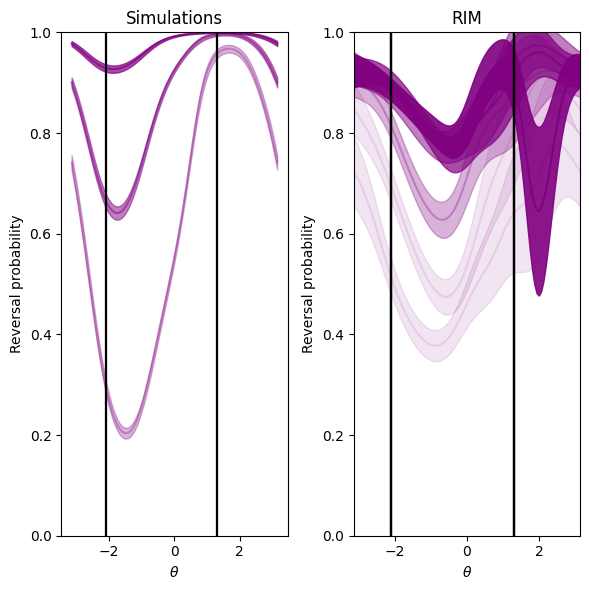

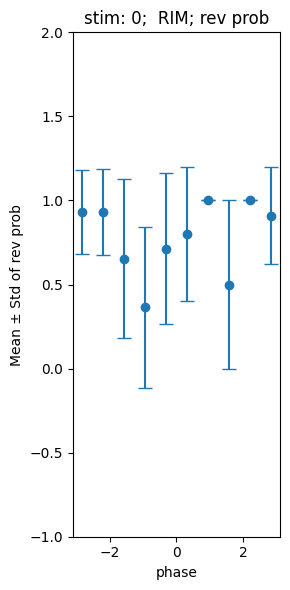

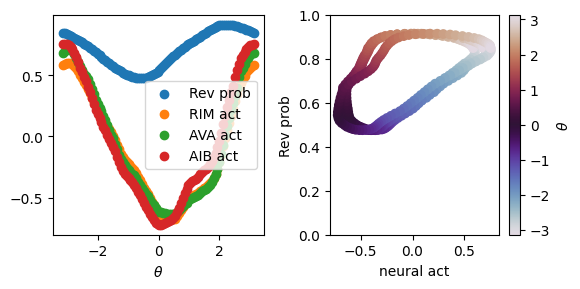

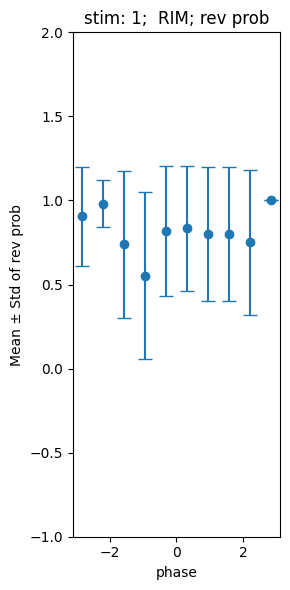

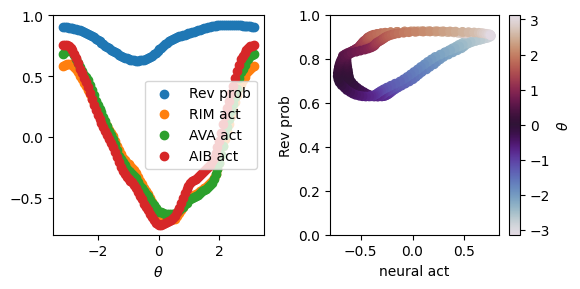

...

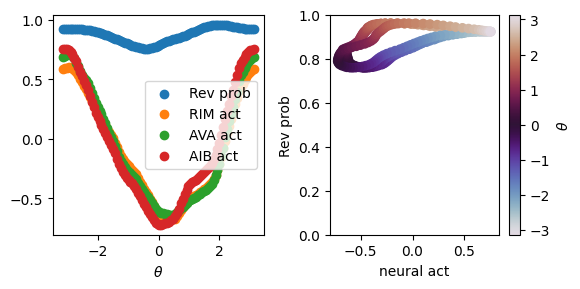

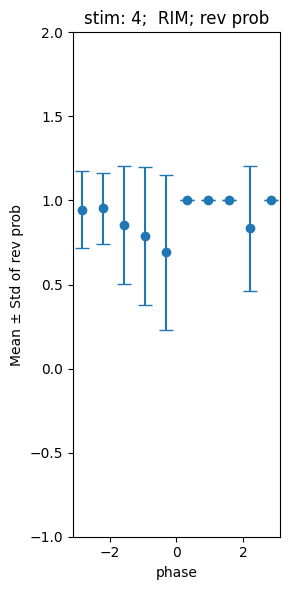

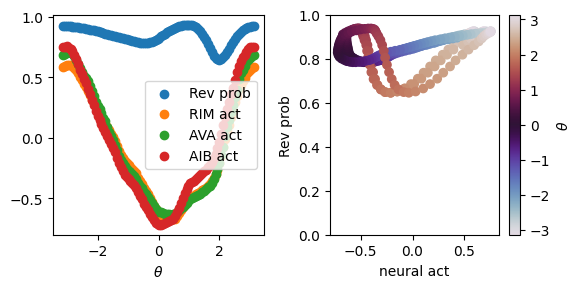

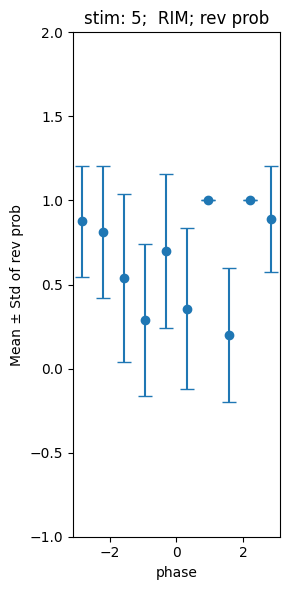

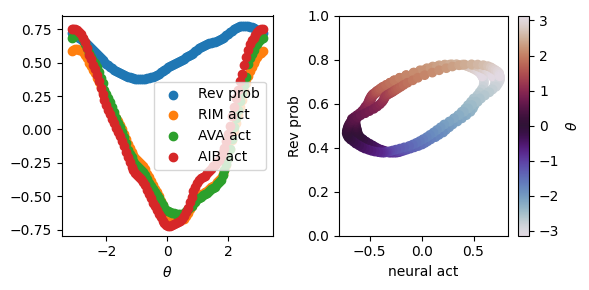

In [ ]:
def plot_binned_counts(x,y,title_supp="",  fig = None, ax = None, n_bins = 10):
    # Define bin edges
    bin_edges = np.linspace(-1*np.pi, np.pi, n_bins + 1)

    # Digitize x values to bin indices
    bin_indices = np.digitize(x, bin_edges) - 1

    # Preallocate arrays
    means = np.zeros(n_bins)
    stds = np.zeros(n_bins)
    bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2

    # Compute mean and std per bin
    for i in range(n_bins):
        mask = bin_indices == i
        if np.any(mask):
            means[i] = np.mean(y[mask])
            stds[i] = np.std(y[mask])
        else:
            means[i] = np.nan
            stds[i] = np.nan

    ax.errorbar(bin_centers, means, yerr=stds, fmt='o', capsize=5)
    ax.set_xlabel('phase')
    ax.set_ylabel('Mean ± Std of rev prob')
    ax.set_ylim([-1, 2])
    ax.set_title(f'{title_supp} {neuron}; rev prob')
    # plt.show()


# Plot
fig,ax = plt.subplots(1,2,figsize=(6,6))

if neuron == "AVA":
    idxs = [[0,-1],[1],[2], [3,4]]
    idxs = [[0],[1],[2],[3],[4],[5]]
if neuron == "RIM":
    idxs = [[0,-1],[1], [2,3,4]]
    idxs = [[0],[1],[2],[3],[4],[5]]
if neuron == "AIB":
    idxs = [[0,-1],[1,2], [3,4]]
# if neuron == "AIB":
#     idxs = [[0,-1],[1], [2], [3], [4]]
#     idxs = [[0],[1],[2],[3],[4],[5]]

for i in range(len(idxs)):

    x0,x1 = np.concatenate(inferred_phases[idxs[i]]), np.concatenate(inferred_rad[idxs[i]])
    y = np.concatenate(final_behaviors[idxs[i]])
    x = np.stack((x0, x1)).T
    x = x[~np.isnan(y)]
    y = y[~np.isnan(y)]

    fig1,ax1 = plt.subplots(figsize=(3,6))
    # ax1.scatter(x0[non_nan_ys], y, label = i)
    plot_binned_counts(x0,y,title_supp = f"stim: {i}; ",fig = fig1, ax = ax1, n_bins = 10)
    
    
    
    y_est = fit_and_evaluate_kernel_regression(x, y, method="kernel", bandwidths=(0.3,0.3), plot=True, kernel_type=("vonmises", "gaussian"), ax=ax[1], alpha = 0.1 + 0.2*(i%5), return_est=True)
    ax[1].set_xlabel(r"$\theta$")
    ax[1].set_ylabel("Reversal probability")
    ax[1].set_ylim(0,1)
    ax[1].set_title(neuron)
    ax[1].axvline(-2.1, color='k')
    ax[1].axvline(1.3, color='k')
    ax[1].set_xlim(-np.pi, np.pi)


    if True: # plot rev probability vs mean trace
        fig2,ax2  = plt.subplots(1,2, figsize=(6,3))
        ax2[0].scatter(np.linspace(-np.pi, np.pi, 100), y_est, label="Rev prob")

        neuron_names = ["RIM", "AVA", "AIB"]
        i = 0
        for y_est2 in y_est2s:
            ax2[0].scatter(np.linspace(-np.pi, np.pi, 100), y_est2, label=f"{neuron_names[i]} act")
            im = ax2[1].scatter(y_est2, y_est, c = np.linspace(-np.pi, np.pi, 100), cmap="twilight")
            i+=1


        ax2[0].set_xlabel(r"$\theta$")
        cb = fig.colorbar(im)
        cb.set_label(r"$\theta$")
        ax2[1].set_ylabel("Rev prob")
        ax2[1].set_xlabel(f"neural act")
        ax2[1].set_ylim(0,1)
        ax2[0].legend()
        fig2.tight_layout()


for i in range(1,len(final_behs)):


    x0,x1 = np.concatenate(worm_angles[0:5]), np.concatenate(worm_radii[0:5])
    y = np.array(final_behs[i])
    x = np.stack((x0, x1)).T
    x = x[~np.isnan(y)]
    y = y[~np.isnan(y)]


    
    
    y_est = fit_and_evaluate_kernel_regression(x, y, method="kernel", bandwidths=(0.3,0.3), plot=True, kernel_type=("vonmises", "gaussian"), ax=ax[0], alpha = 0.1 + 0.2*(i%5), return_est=True)


    ax[0].set_xlabel(r"$\theta$")
    ax[0].set_ylabel("Reversal probability")
    ax[0].set_title("Simulations")
    ax[0].axvline(-2.1, color='k')
    ax[0].axvline(1.3, color='k')
    ax[0].set_ylim(0,1)


fig.tight_layout()
